# Navigation points
Navigation points, also known as waypoints, are specific geographic locations defined by coordinates (latitude and longitude) used in aviation to guide aircraft along predetermined routes. These points help pilots and air traffic controllers manage and optimize flight paths, especially during arrivals, departures, and en-route navigation. In this notebook, a list of navigation points (STAR points) with their coordinates is provided below for use in trajectory analysis and visualization.

1. **ABAPA**: 52 00 36.0 N, 021 11 40.0 E  
2. **AGAVA**: 51 34 53.1 N, 019 57 38.7 E  
3. **ARFEP**: 51 33 56.0 N, 020 26 43.1 E  
4. **BIMPA**: 52 22 27.8 N, 019 46 29.0 E  
5. **BUWAS**: 52 10 47.0 N, 021 47 06.8 E  
6. **DEBZU**: 52 02 16.1 N, 021 05 47.0 E  
7. **DINVA**: 52 13 47.2 N, 021 03 53.7 E  
8. **DUTFU**: 52 15 45.3 N, 021 20 24.5 E  
9. **EDIZE**: 52 10 17.0 N, 021 16 17.7 E  
10. **EMCEL**: 51 41 08.0 N, 020 54 35.0 E  
11. **ENZAM**: 52 12 05.0 N, 021 33 17.0 E  
12. **FOLFA**: 51 46 37.1 N, 020 57 27.4 E  
13. **HALFI**: 52 22 42.8 N, 020 41 14.3 E  
14. **KEWLU**: 52 30 45.0 N, 020 20 33.0 E  
15. **KUMUT**: 51 57 15.2 N, 021 23 24.3 E  
16. **LIMVI**: 51 44 42.0 N, 021 41 08.0 E  
17. **LOGDA**: 51 17 04.0 N, 020 41 38.0 E  
18. **MAPIX**: 51 58 55.6 N, 021 17 33.0 E  
19. **NAHPA**: 51 57 43.7 N, 021 02 24.8 E  
20. **NEPOX**: 52 09 33.0 N, 021 59 57.1 E  
21. **RIKNO**: 52 06 18.9 N, 021 30 13.1 E  
22. **SORIX**: 52 41 43.0 N, 019 49 12.0 E  
23. **TIGTU**: 52 07 59.8 N, 021 24 19.9 E  
24. **VIXLO**: 51 34 19.4 N, 020 15 13.8 E  
25. **WA731**: 52 03 27.8 N, 021 20 56.1 E  
26. **WA732**: 52 01 46.9 N, 021 26 48.7 E  
27. **WA821**: 51 28 54.3 N, 020 47 58.4 E  
28. **WA884**: 51 58 28.1 N, 021 37 12.4 E  
29. **ZEBWI**: 52 13 27.8 N, 021 28 27.6 E  

In [2]:
WAYPOINTS = [
    ("ABAPA", "52 00 36.0 N", "021 11 40.0 E"),
    ("AGAVA", "51 34 53.1 N", "019 57 38.7 E"),
    ("ARFEP", "51 33 56.0 N", "020 26 43.1 E"),
    ("BIMPA", "52 22 27.8 N", "019 46 29.0 E"),
    ("BUWAS", "52 10 47.0 N", "021 47 06.8 E"),
    ("DEBZU", "52 02 16.1 N", "021 05 47.0 E"),
    ("DINVA", "52 13 47.2 N", "021 03 53.7 E"),
    ("DUTFU", "52 15 45.3 N", "021 20 24.5 E"),
    ("EDIZE", "52 10 17.0 N", "021 16 17.7 E"),
    ("EMCEL", "51 41 08.0 N", "020 54 35.0 E"),
    ("ENZAM", "52 12 05.0 N", "021 33 17.0 E"),
    ("FOLFA", "51 46 37.1 N", "020 57 27.4 E"),
    ("HALFI", "52 22 42.8 N", "020 41 14.3 E"),
    ("KEWLU", "52 30 45.0 N", "020 20 33.0 E"),
    ("KUMUT", "51 57 15.2 N", "021 23 24.3 E"),
    ("LIMVI", "51 44 42.0 N", "021 41 08.0 E"),
    ("LOGDA", "51 17 04.0 N", "020 41 38.0 E"),
    ("MAPIX", "51 58 55.6 N", "021 17 33.0 E"),
    ("NAHPA", "51 57 43.7 N", "021 02 24.8 E"),
    ("NEPOX", "52 09 33.0 N", "021 59 57.1 E"),
    ("RIKNO", "52 06 18.9 N", "021 30 13.1 E"),
    ("SORIX", "52 41 43.0 N", "019 49 12.0 E"),
    ("TIGTU", "52 07 59.8 N", "021 24 19.9 E"),
    ("VIXLO", "51 34 19.4 N", "020 15 13.8 E"),
    ("WA731", "52 03 27.8 N", "021 20 56.1 E"),
    ("WA732", "52 01 46.9 N", "021 26 48.7 E"),
    ("WA821", "51 28 54.3 N", "020 47 58.4 E"),
    ("WA884", "51 58 28.1 N", "021 37 12.4 E"),
    ("ZEBWI", "52 13 27.8 N", "021 28 27.6 E"),
]

In [3]:
def dms_str_to_decimal(coord_str):
    """
    Converts a coordinate string in 'DD MM SS.S D' or 'DDD MM SS.S D' format to decimal degrees.
    Example: '52 00 36.0 N' or '021 11 40.0 E'
    """
    parts = coord_str.strip().split()
    if len(parts) != 4:
        raise ValueError("Invalid coordinate format")
    degrees = float(parts[0])
    minutes = float(parts[1])
    seconds = float(parts[2])
    direction = parts[3].upper()
    decimal = degrees + minutes / 60 + seconds / 3600
    if direction in ['S', 'W']:
        decimal = -decimal
    return decimal

In [4]:
WAYPOINTS_DECIMAL = {
    name: (round(dms_str_to_decimal(lat), 6), round(dms_str_to_decimal(lon), 6))
    for name, lat, lon in WAYPOINTS
}
WAYPOINTS_DECIMAL

{'ABAPA': (52.01, 21.194444),
 'AGAVA': (51.581417, 19.96075),
 'ARFEP': (51.565556, 20.445306),
 'BIMPA': (52.374389, 19.774722),
 'BUWAS': (52.179722, 21.785222),
 'DEBZU': (52.037806, 21.096389),
 'DINVA': (52.229778, 21.064917),
 'DUTFU': (52.262583, 21.340139),
 'EDIZE': (52.171389, 21.271583),
 'EMCEL': (51.685556, 20.909722),
 'ENZAM': (52.201389, 21.554722),
 'FOLFA': (51.776972, 20.957611),
 'HALFI': (52.378556, 20.687306),
 'KEWLU': (52.5125, 20.3425),
 'KUMUT': (51.954222, 21.390083),
 'LIMVI': (51.745, 21.685556),
 'LOGDA': (51.284444, 20.693889),
 'MAPIX': (51.982111, 21.2925),
 'NAHPA': (51.962139, 21.040222),
 'NEPOX': (52.159167, 21.999194),
 'RIKNO': (52.10525, 21.503639),
 'SORIX': (52.695278, 19.82),
 'TIGTU': (52.133278, 21.405528),
 'VIXLO': (51.572056, 20.253833),
 'WA731': (52.057722, 21.348917),
 'WA732': (52.029694, 21.446861),
 'WA821': (51.48175, 20.799556),
 'WA884': (51.974472, 21.620111),
 'ZEBWI': (52.224389, 21.474333)}

In [5]:
star_points = [
    {"name": name, "lat": lat, "lon": lon}
    for name, (lat, lon) in WAYPOINTS_DECIMAL.items()
]

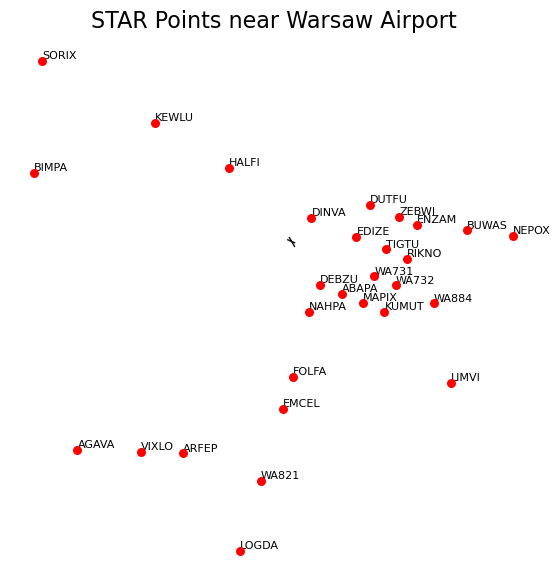

In [10]:
import numpy as np
from cartes.crs import EPSG_2180
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from traffic.core import Flight, Traffic
import os
import pandas as pd
from traffic.data import opensky, airports

# Prepare data
lats = [pt["lat"] for pt in star_points]
lons = [pt["lon"] for pt in star_points]
names = [pt["name"] for pt in star_points]

# Transform coordinates from PlateCarree (lon/lat) to EPSG:2180
src_crs = ccrs.PlateCarree()
dst_crs = EPSG_2180()

xy = dst_crs.transform_points(src_crs, np.array(lons), np.array(lats))
xs, ys = xy[:, 0], xy[:, 1]

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    ax.scatter(xs, ys, color="red", s=30, zorder=5)
    for name, x, y in zip(names, xs, ys):
        ax.text(x, y, name, fontsize=8, ha="left", va="bottom")

    ax.set_title("STAR Points near Warsaw Airport")
plt.show()

# FDB1829

In [11]:
trajectories_folder = '../datasetsV2/dataset_specific_callsigns/trajectories'

In [12]:
def extract_flights_by_callsign_per_runway(callsign):
    runway_traffic = {}
    for subfolder in os.listdir(trajectories_folder):
        subfolder_path = os.path.join(trajectories_folder, subfolder)
        if os.path.isdir(subfolder_path):
            flights = []
            for filename in os.listdir(subfolder_path):
                if callsign in filename:
                    file_path = os.path.join(subfolder_path, filename)
                    flights.append(Flight.from_file(file_path))
            if flights:
                # Extract only the number from the folder name
                runway_number = ''.join(filter(str.isdigit, subfolder))
                runway_traffic[int(runway_number)] = Traffic.from_flights(flights)
    return runway_traffic

In [13]:
fdb1829_traffic = extract_flights_by_callsign_per_runway('FDB1829')

In [14]:
fdb1829_runway33_traffic = fdb1829_traffic[33]

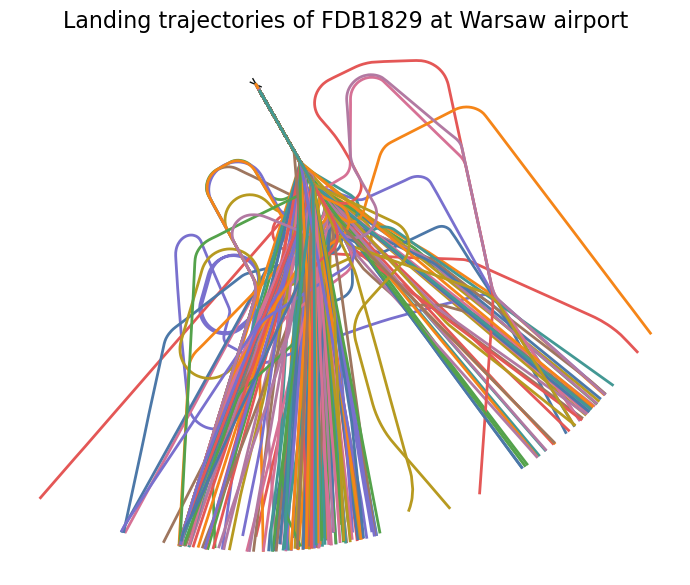

In [28]:
with plt.style.context("traffic"):

    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))

    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))
    for flight in fdb1829_runway33_traffic:
        flight.plot(ax, linewidth=2)

    ax.set_title("Landing trajectories of FDB1829 at Warsaw airport")
plt.show()

In [15]:
fdb1829_runway33_traffic = fdb1829_runway33_traffic.assign(
    quarter=lambda df: df.timestamp.dt.quarter,
    month=lambda df: df.timestamp.dt.month,
    day=lambda df: df.timestamp.dt.day,
    hour=lambda df: df.timestamp.dt.hour,
    weekday=lambda df: df.timestamp.dt.weekday,
)

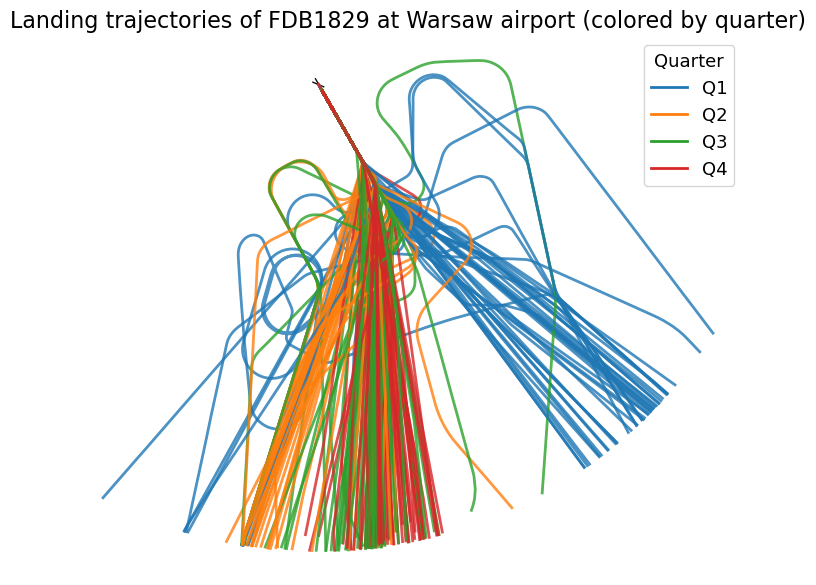

In [40]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Assign a color to each quarter
quarter_colors = {1: "tab:blue", 2: "tab:orange", 3: "tab:green", 4: "tab:red"}

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Plot each flight colored by its quarter
    for flight in fdb1829_runway33_traffic:
        # Get the quarter for this flight (assumes 'quarter' column exists)
        quarter = flight.data.timestamp.dt.quarter.iloc[0]
        color = quarter_colors.get(quarter, "gray")
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for quarters
    handles = [plt.Line2D([0], [0], color=color, lw=2, label=f"Q{q}") for q, color in quarter_colors.items()]
    ax.legend(handles=handles, title="Quarter")

    ax.set_title("Landing trajectories of FDB1829 at Warsaw airport (colored by quarter)")
plt.show()

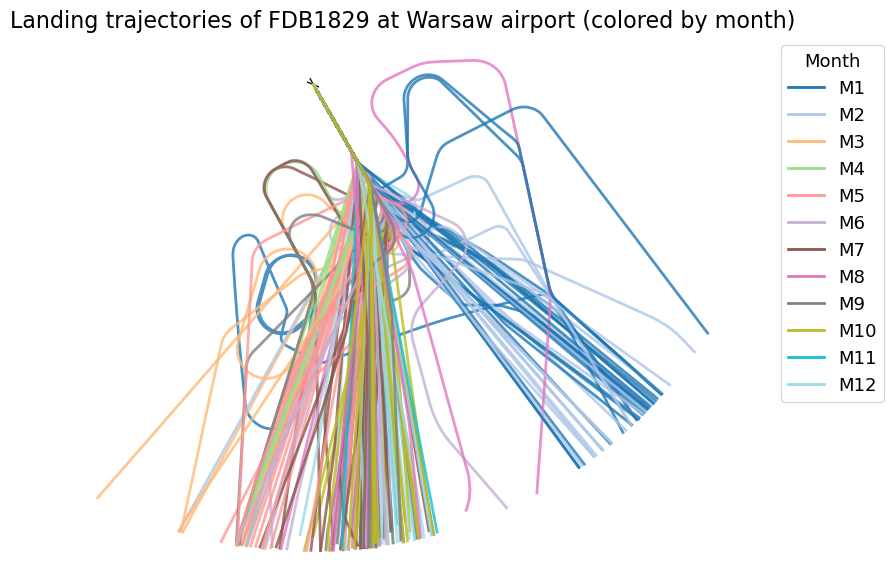

In [44]:
# Assign a color to each month (1-12) using the recommended API
month_colors = plt.colormaps["tab20"].resampled(12)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Make sure 'month' column exists
    if "month" not in fdb1829_runway33_traffic.data.columns:
        fdb1829_runway33_traffic = fdb1829_runway33_traffic.assign(
            month=lambda df: df.timestamp.dt.month
        )

    # Plot each flight colored by its month
    for flight in fdb1829_runway33_traffic:
        month = flight.data.timestamp.dt.month.iloc[0]
        color = month_colors(month - 1)
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for months
    handles = [
        plt.Line2D([0], [0], color=month_colors(i), lw=2, label=f"M{i+1}")
        for i in range(12)
    ]
    ax.legend(handles=handles, title="Month", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("Landing trajectories of FDB1829 at Warsaw airport (colored by month)")
plt.show()

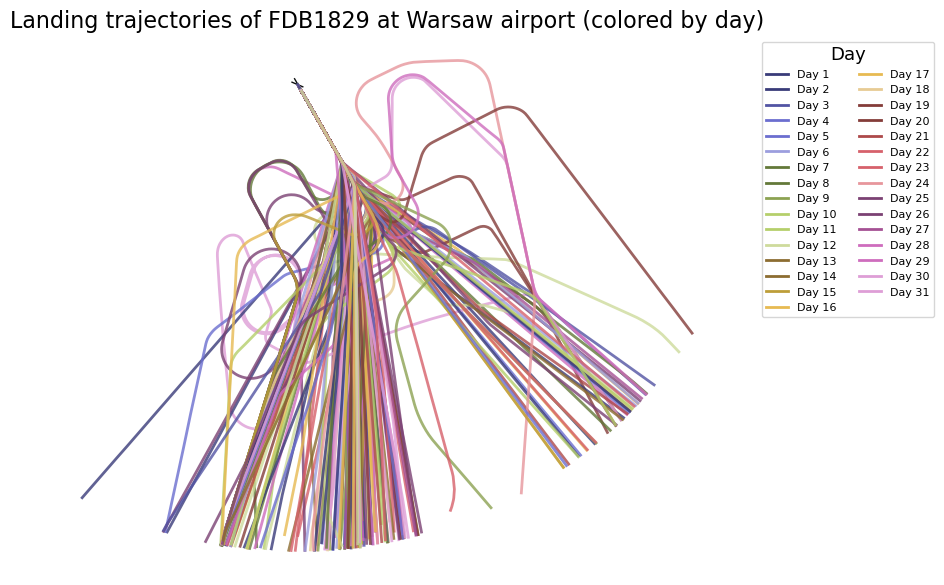

In [45]:
# Assign a color to each day (1-31) using a colormap
day_colors = plt.colormaps["tab20b"].resampled(31)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Make sure 'day' column exists
    if "day" not in fdb1829_runway33_traffic.data.columns:
        fdb1829_runway33_traffic = fdb1829_runway33_traffic.assign(
            day=lambda df: df.timestamp.dt.day
        )

    # Plot each flight colored by its day
    for flight in fdb1829_runway33_traffic:
        day = flight.data.timestamp.dt.day.iloc[0]
        color = day_colors(day - 1)
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for days
    handles = [
        plt.Line2D([0], [0], color=day_colors(i), lw=2, label=f"Day {i+1}")
        for i in range(31)
    ]
    ax.legend(handles=handles, title="Day", bbox_to_anchor=(1.05, 1), loc="upper left", ncol=2, fontsize=8)

    ax.set_title("Landing trajectories of FDB1829 at Warsaw airport (colored by day)")
plt.show()

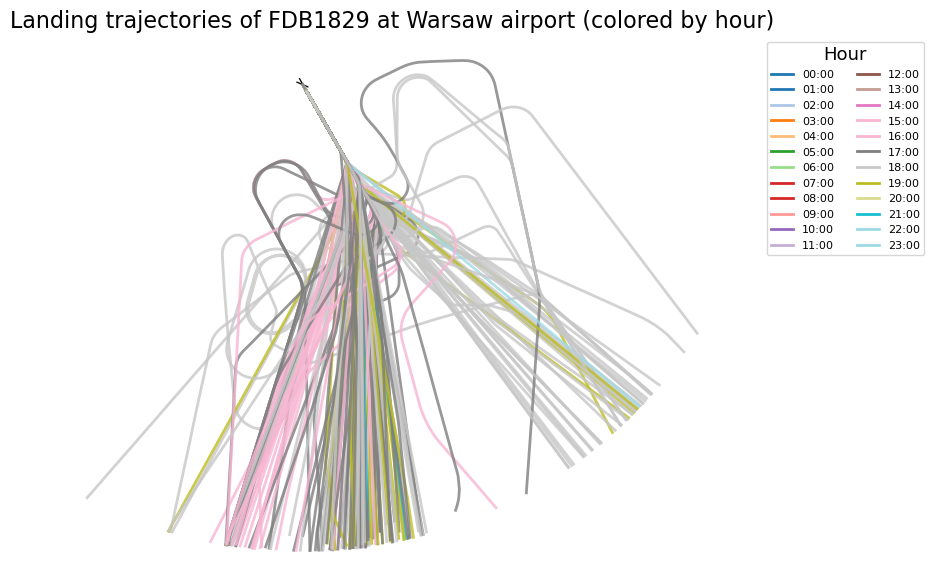

In [47]:
# Assign a color to each hour (0-23) using a colormap
hour_colors = plt.colormaps["tab20"].resampled(24)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Make sure 'hour' column exists
    if "hour" not in fdb1829_runway33_traffic.data.columns:
        fdb1829_runway33_traffic = fdb1829_runway33_traffic.assign(
            hour=lambda df: df.timestamp.dt.hour
        )

    # Plot each flight colored by its hour
    for flight in fdb1829_runway33_traffic:
        hour = flight.data.timestamp.dt.hour.iloc[0]
        color = hour_colors(hour)
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for hours
    handles = [
        plt.Line2D([0], [0], color=hour_colors(i), lw=2, label=f"{i:02d}:00")
        for i in range(24)
    ]
    ax.legend(handles=handles, title="Hour", bbox_to_anchor=(1.05, 1), loc="upper left", ncol=2, fontsize=8)

    ax.set_title("Landing trajectories of FDB1829 at Warsaw airport (colored by hour)")
plt.show()

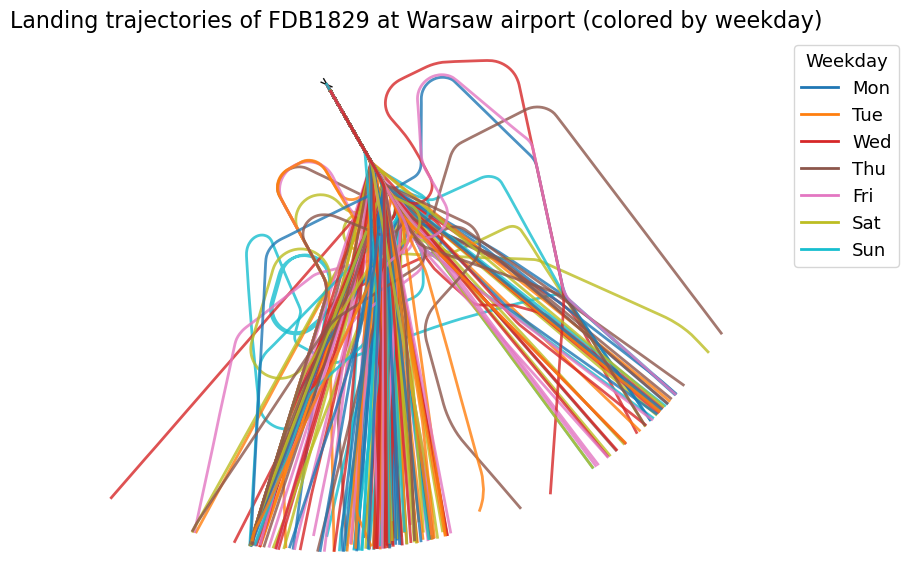

In [46]:
# Assign a color to each weekday (0=Monday, 6=Sunday) using a colormap
weekday_colors = plt.colormaps["tab10"].resampled(7)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Make sure 'weekday' column exists
    if "weekday" not in fdb1829_runway33_traffic.data.columns:
        fdb1829_runway33_traffic = fdb1829_runway33_traffic.assign(
            weekday=lambda df: df.timestamp.dt.weekday
        )

    # Plot each flight colored by its weekday
    for flight in fdb1829_runway33_traffic:
        weekday = flight.data.timestamp.dt.weekday.iloc[0]
        color = weekday_colors(weekday)
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for weekdays
    weekday_labels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
    handles = [
        plt.Line2D([0], [0], color=weekday_colors(i), lw=2, label=weekday_labels[i])
        for i in range(7)
    ]
    ax.legend(handles=handles, title="Weekday", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("Landing trajectories of FDB1829 at Warsaw airport (colored by weekday)")
plt.show()

## Q1

In [16]:
fdb1829_runway33_q1_traffic = fdb1829_runway33_traffic.query("quarter == 1")

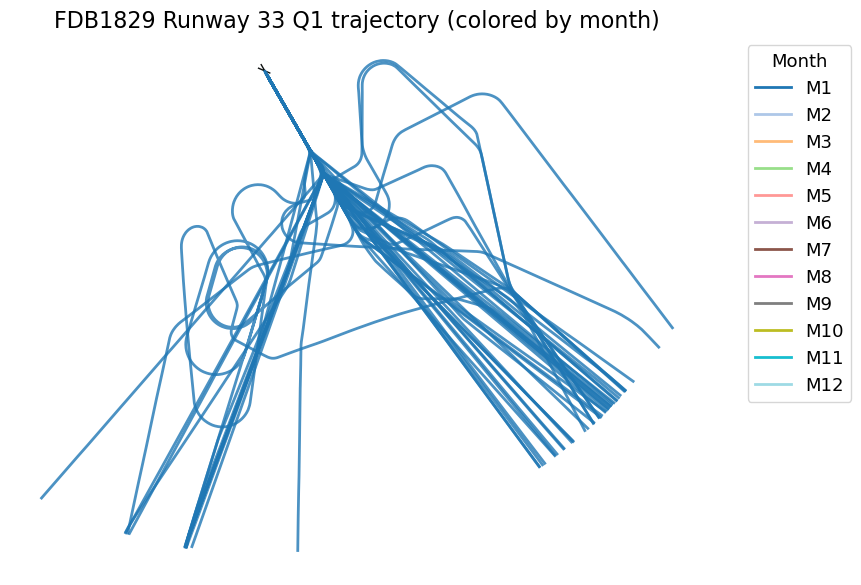

In [57]:
# Plot the trajectory of fdb1829_runway33_q1_traffic colored by its month

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Get the month for this flight (assumes 'month' column exists)
    month = fdb1829_runway33_q1_traffic.data.timestamp.dt.month.iloc[0]
    color = month_colors(month - 1)
    fdb1829_runway33_q1_traffic.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for months
    handles = [
        plt.Line2D([0], [0], color=month_colors(i), lw=2, label=f"M{i+1}")
        for i in range(12)
    ]
    ax.legend(handles=handles, title="Month", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("FDB1829 Runway 33 Q1 trajectory (colored by month)")
plt.show()

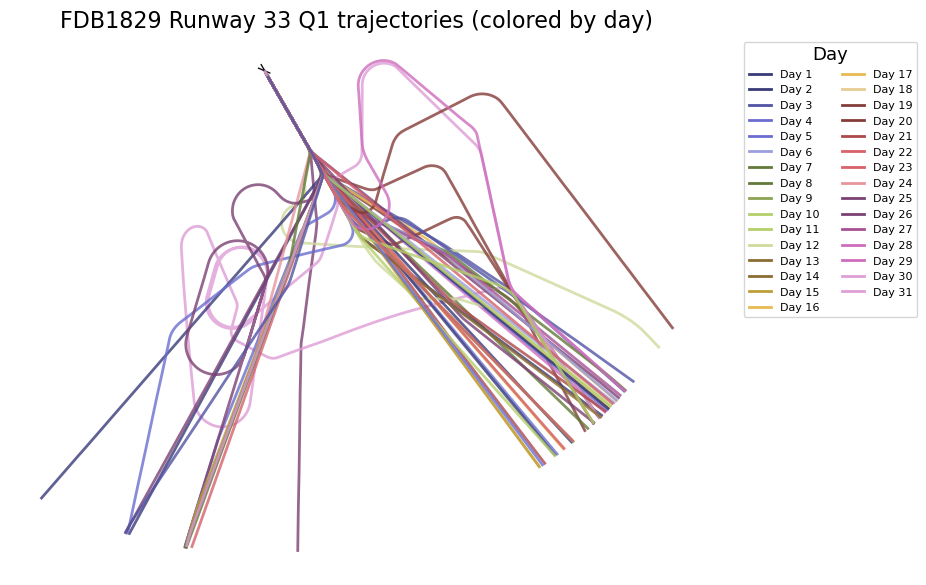

In [58]:
# Plot fdb1829_runway33_q1_traffic colored by day

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Plot each flight colored by its day
    for flight in fdb1829_runway33_q1_traffic:
        day = flight.data.timestamp.dt.day.iloc[0]
        color = day_colors(day - 1)
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for days
    handles = [
        plt.Line2D([0], [0], color=day_colors(i), lw=2, label=f"Day {i+1}")
        for i in range(31)
    ]
    ax.legend(handles=handles, title="Day", bbox_to_anchor=(1.05, 1), loc="upper left", ncol=2, fontsize=8)

    ax.set_title("FDB1829 Runway 33 Q1 trajectories (colored by day)")
plt.show()

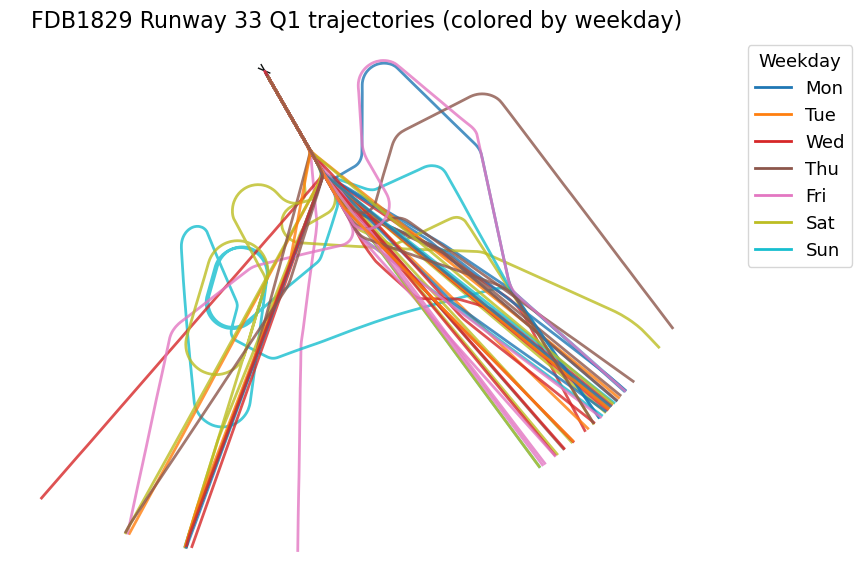

In [59]:
# Plot fdb1829_runway33_q1_traffic colored by weekday

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Plot each flight colored by its weekday
    for flight in fdb1829_runway33_q1_traffic:
        weekday = flight.data.timestamp.dt.weekday.iloc[0]
        color = weekday_colors(weekday)
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for weekdays
    handles = [
        plt.Line2D([0], [0], color=weekday_colors(i), lw=2, label=weekday_labels[i])
        for i in range(7)
    ]
    ax.legend(handles=handles, title="Weekday", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("FDB1829 Runway 33 Q1 trajectories (colored by weekday)")
plt.show()

In [17]:
fdb1829_runway33_q1_traffic = fdb1829_runway33_q1_traffic.aircraft_data()

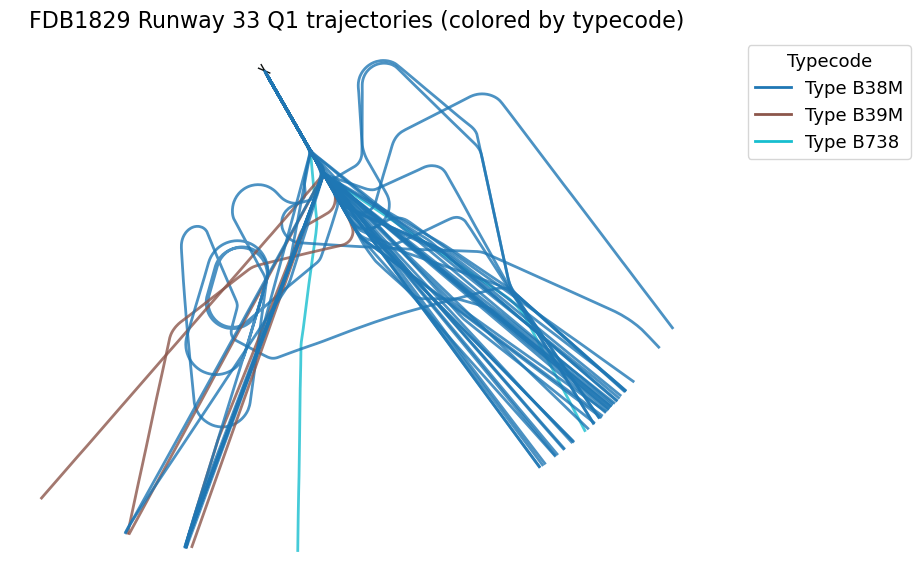

In [76]:
# Assign a color to each unique typecode using a colormap
typecodes = [tc for tc in fdb1829_runway33_q1_traffic.data["typecode"].unique() if pd.notna(tc)]
typecode_colors = plt.colormaps["tab10"].resampled(len(typecodes))
typecode_to_color = {tc: typecode_colors(i) for i, tc in enumerate(typecodes)}

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_q1_traffic:
        # Get the typecode for this flight (assumes 'typecode' column exists)
        typecode = flight.data.typecode.iloc[0]
        color = typecode_to_color.get(typecode, "gray")
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for typecodes
    handles = [
        plt.Line2D([0], [0], color=typecode_to_color[tc], lw=2, label=f"Type {tc}")
        for tc in typecodes
    ]
    ax.legend(handles=handles, title="Typecode", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("FDB1829 Runway 33 Q1 trajectories (colored by typecode)")
plt.show()

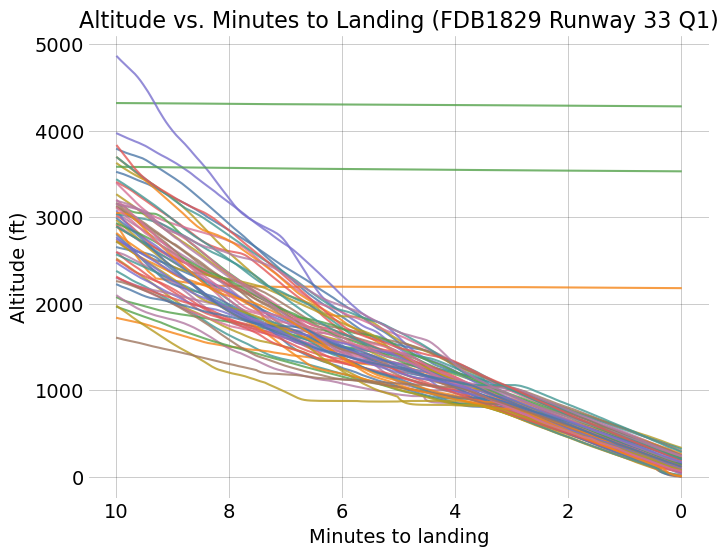

In [62]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        ax.plot(time_to_end, df.altitude, alpha=0.8, label=flight.icao24)

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Altitude (ft)")
    ax.set_title("Altitude vs. Minutes to Landing (FDB1829 Runway 33 Q1)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

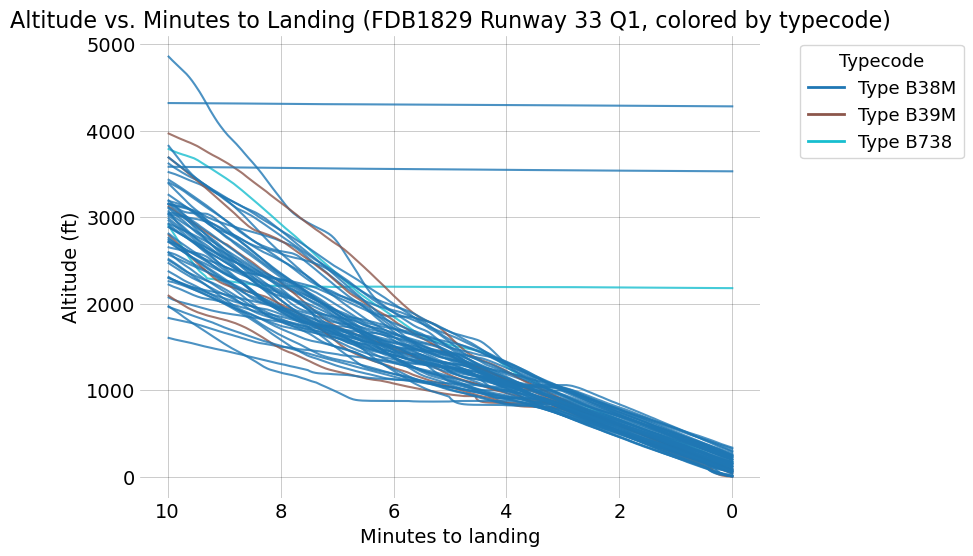

In [ ]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        typecode = df.typecode.iloc[0]
        color = typecode_to_color.get(typecode, "gray")
        ax.plot(time_to_end, df.altitude, alpha=0.8, color=color, label=typecode)

    # Only show each typecode once in the legend
    handles = [
        plt.Line2D([0], [0], color=typecode_to_color[tc], lw=2, label=f"Type {tc}")
        for tc in typecodes
    ]
    ax.legend(handles=handles, title="Typecode", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Altitude (m)")
    ax.set_title("Altitude vs. Minutes to Landing (FDB1829 Runway 33 Q1, colored by typecode)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

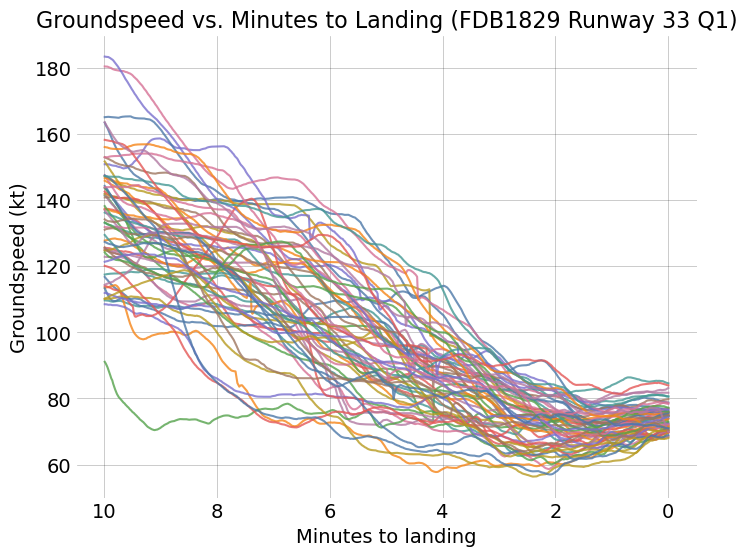

In [ ]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        ax.plot(time_to_end, df.groundspeed, alpha=0.8, label=flight.icao24)

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Groundspeed (m/s)")
    ax.set_title("Groundspeed vs. Minutes to Landing (FDB1829 Runway 33 Q1)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

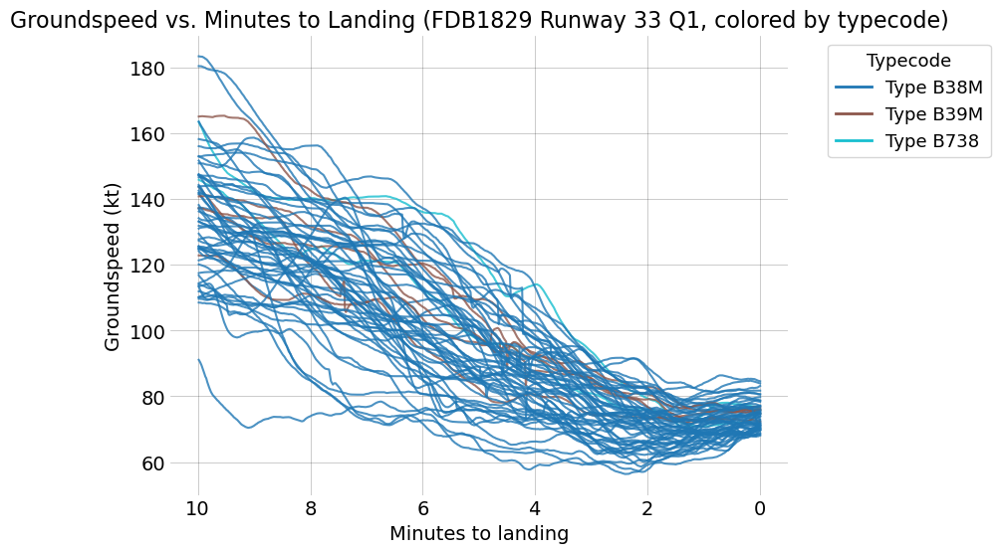

In [ ]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        typecode = df.typecode.iloc[0]
        color = typecode_to_color.get(typecode, "gray")
        ax.plot(time_to_end, df.groundspeed, alpha=0.8, color=color, label=typecode)

    # Only show each typecode once in the legend
    handles = [
        plt.Line2D([0], [0], color=typecode_to_color[tc], lw=2, label=f"Type {tc}")
        for tc in typecodes
    ]
    ax.legend(handles=handles, title="Typecode", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Groundspeed (m/s)")
    ax.set_title("Groundspeed vs. Minutes to Landing (FDB1829 Runway 33 Q1, colored by typecode)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

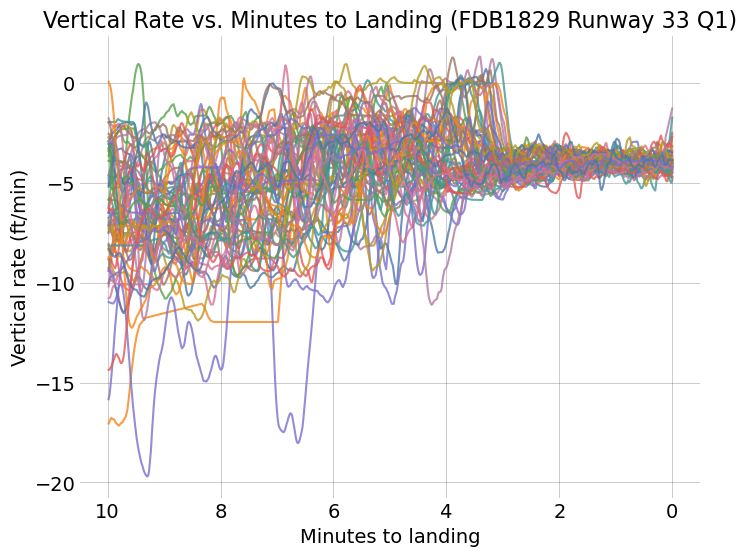

In [ ]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        ax.plot(time_to_end, df.vertical_rate, alpha=0.8, label=flight.icao24)

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Vertical rate (m/s)")
    ax.set_title("Vertical Rate vs. Minutes to Landing (FDB1829 Runway 33 Q1)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

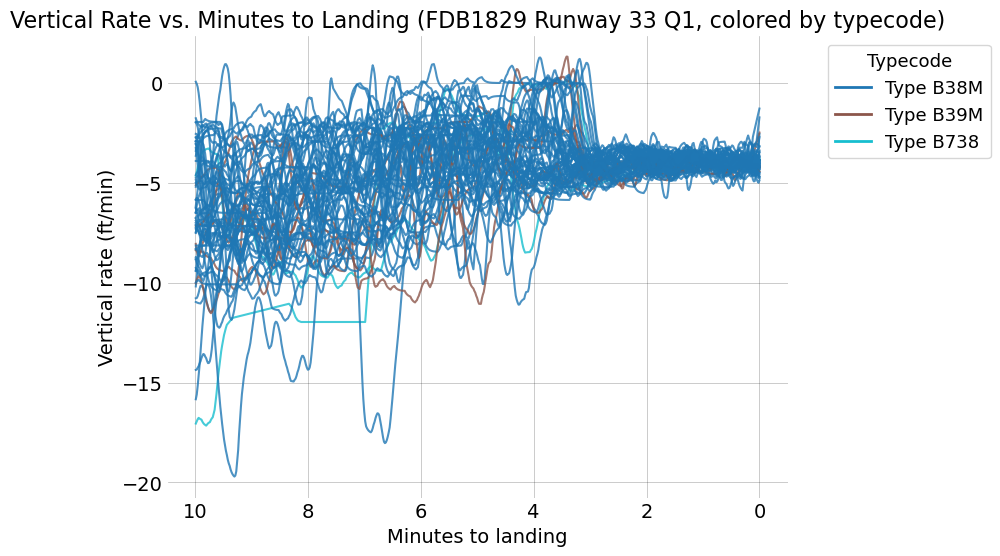

In [ ]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        typecode = df.typecode.iloc[0]
        color = typecode_to_color.get(typecode, "gray")
        ax.plot(time_to_end, df.vertical_rate, alpha=0.8, color=color, label=typecode)

    # Only show each typecode once in the legend
    handles = [
        plt.Line2D([0], [0], color=typecode_to_color[tc], lw=2, label=f"Type {tc}")
        for tc in typecodes
    ]
    ax.legend(handles=handles, title="Typecode", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Vertical rate (m/s)")
    ax.set_title("Vertical Rate vs. Minutes to Landing (FDB1829 Runway 33 Q1, colored by typecode)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

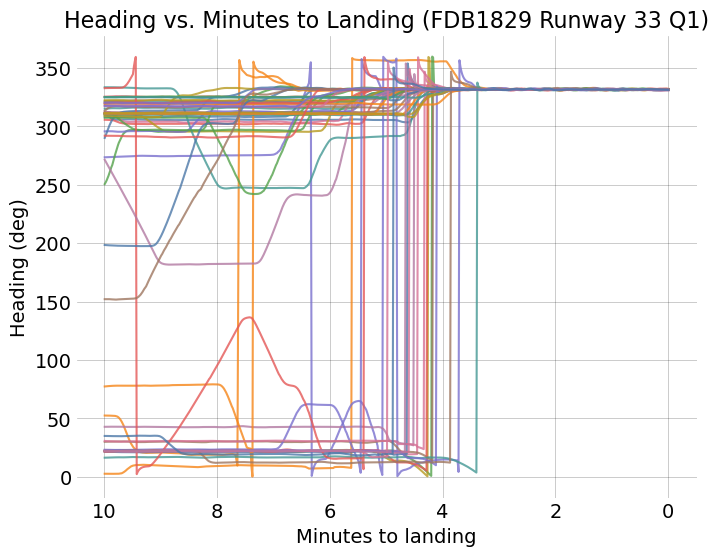

In [67]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).unwrap().data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        ax.plot(time_to_end, df.track, alpha=0.8, label=flight.icao24)

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Heading (deg)")
    ax.set_title("Heading vs. Minutes to Landing (FDB1829 Runway 33 Q1)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

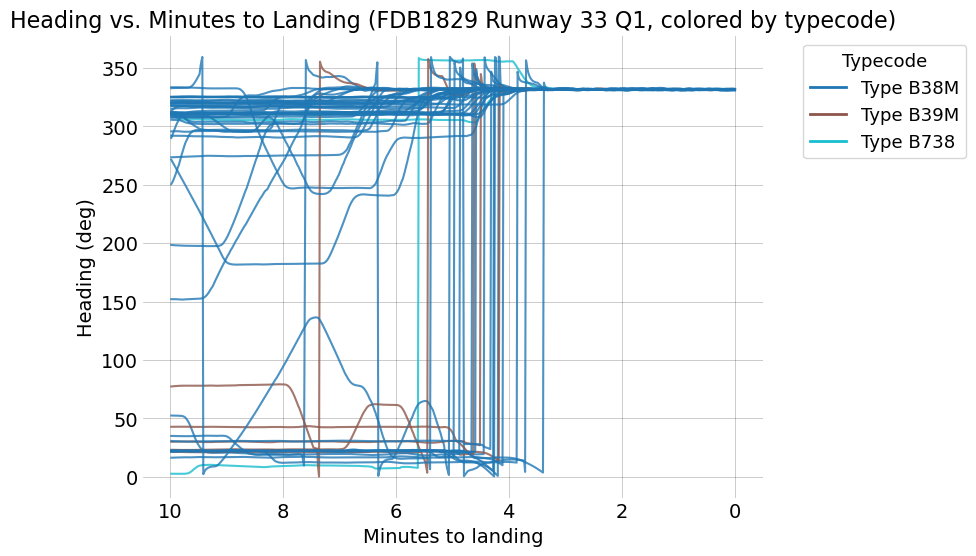

In [82]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 6))

    for flight in fdb1829_runway33_q1_traffic:
        df = flight.last(minutes=10).unwrap().data
        # Calculate minutes to landing (end of trajectory)
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        typecode = df.typecode.iloc[0]
        color = typecode_to_color.get(typecode, "gray")
        ax.plot(time_to_end, df.track, alpha=0.8, color=color, label=typecode)

    # Only show each typecode once in the legend
    handles = [
        plt.Line2D([0], [0], color=typecode_to_color[tc], lw=2, label=f"Type {tc}")
        for tc in typecodes
    ]
    ax.legend(handles=handles, title="Typecode", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Heading (deg)")
    ax.set_title("Heading vs. Minutes to Landing (FDB1829 Runway 33 Q1, colored by typecode)")
    ax.invert_xaxis()  # So that 0 (landing) is on the right
plt.show()

In [18]:
fdb1829_runway33_m1_traffic = fdb1829_runway33_q1_traffic.query("month == 1")

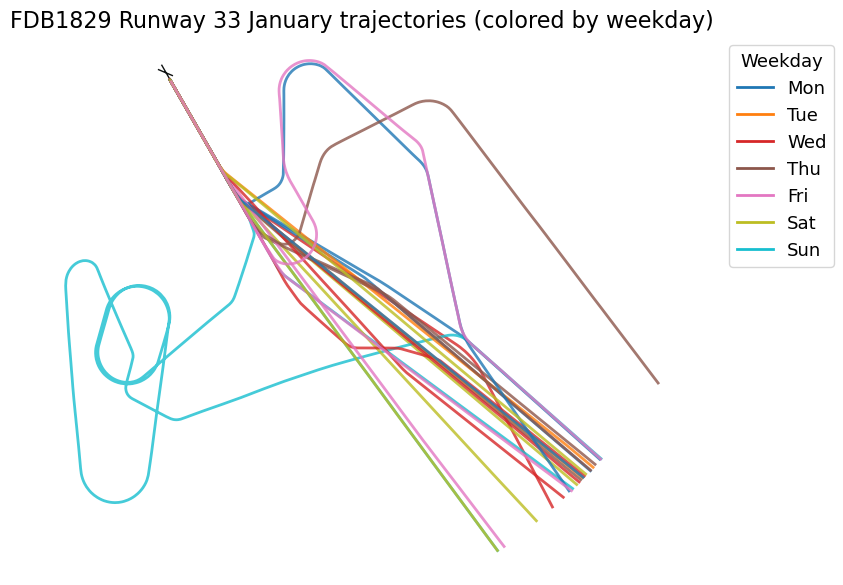

In [117]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Plot each flight colored by its weekday
    for flight in fdb1829_runway33_m1_traffic:
        weekday = flight.data.timestamp.dt.weekday.iloc[0]
        color = weekday_colors(weekday)
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    # Add legend for weekdays
    handles = [
        plt.Line2D([0], [0], color=weekday_colors(i), lw=2, label=weekday_labels[i])
        for i in range(7)
    ]
    ax.legend(handles=handles, title="Weekday", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("FDB1829 Runway 33 January trajectories (colored by weekday)")
plt.show()

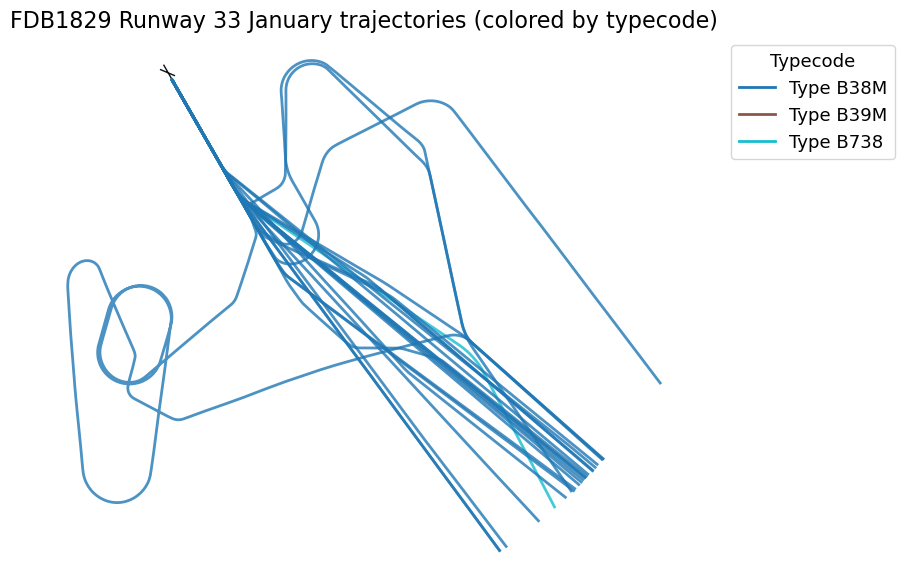

In [118]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        typecode = flight.data.typecode.iloc[0]
        color = typecode_to_color.get(typecode, "gray")
        flight.plot(ax, linewidth=2, color=color, alpha=0.8)

    handles = [
        plt.Line2D([0], [0], color=typecode_to_color[tc], lw=2, label=f"Type {tc}")
        for tc in typecodes
    ]
    ax.legend(handles=handles, title="Typecode", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("FDB1829 Runway 33 January trajectories (colored by typecode)")
plt.show()

## Time in area

In [123]:
def compute_time_in_area(traffic):
    times = []
    for flight in traffic:
        df = flight.data
        if len(df) > 1:
            duration = (df.timestamp.iloc[-1] - df.timestamp.iloc[0]).total_seconds() / 60  # minutes
            times.append({"icao24": flight.icao24, "callsign": flight.callsign, "duration_min": duration})
    return pd.DataFrame(times)

time_in_area_df = compute_time_in_area(fdb1829_runway33_m1_traffic)

# Detect abnormal durations using the IQR method
Q1 = time_in_area_df["duration_min"].quantile(0.25)
Q3 = time_in_area_df["duration_min"].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

abnormal_flights = time_in_area_df[
    (time_in_area_df["duration_min"] < lower_bound) | (time_in_area_df["duration_min"] > upper_bound)
]

# Calculate percent of abnormal flights
print("Statistics for time in area (minutes):")
print(time_in_area_df["duration_min"].describe())
print(f"\nIQR: {IQR:.2f}")
print(f"Q1: {Q1:.2f}")
print(f"Q3: {Q3:.2f}")
print(f"Lower bound: {lower_bound:.2f}")
print(f"Upper bound: {upper_bound:.2f}")
print(f"Number of abnormal flights: {len(abnormal_flights)}")
print(f"Percentage of abnormal flights: {len(abnormal_flights) / len(time_in_area_df) * 100:.2f}%")
print(f"Abnormal ICAO24s: {set(abnormal_flights['icao24'])}")

abnormal_flights

Statistics for time in area (minutes):
count    24.000000
mean     17.279861
std       7.692369
min      13.016667
25%      14.595833
50%      14.950000
75%      16.325000
max      51.100000
Name: duration_min, dtype: float64

IQR: 1.73
Q1: 14.60
Q3: 16.33
Lower bound: 12.00
Upper bound: 18.92
Number of abnormal flights: 4
Percentage of abnormal flights: 16.67%
Abnormal ICAO24s: {'8964d3', '89656a', '8965b2', '896531'}


,icao24,callsign,duration_min
5,8964d3,FDB1829,51.100000
15,896531,FDB1829,20.666667
19,89656a,FDB1829,20.033333
23,8965b2,FDB1829,25.200000


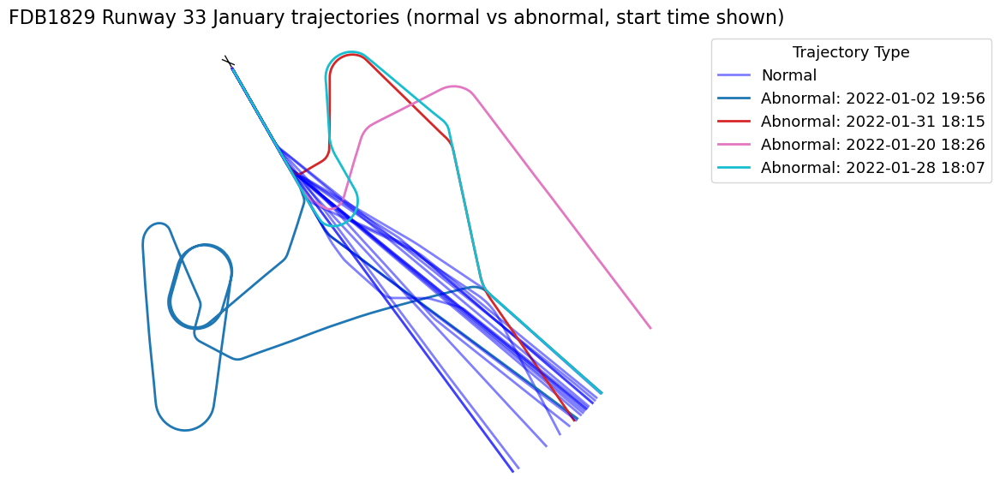

In [ ]:
# Plot normal and abnormal trajectories with different colors and show abnormal start times

# Get the set of abnormal icao24s and their start timestamps
abnormal_info = {}
for idx, row in abnormal_flights.iterrows():
    icao24 = row["icao24"]
    flight = next((f for f in fdb1829_runway33_m1_traffic if f.icao24 == icao24), None)
    if flight is not None:
        start_time = flight.data.timestamp.iloc[0]
        abnormal_info[icao24] = start_time

# Assign a unique color for each abnormal flight
abn_cmap = plt.colormaps["tab10"].resampled(len(abnormal_info))
abn_colors = {icao24: abn_cmap(i) for i, icao24 in enumerate(abnormal_info)}

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        if flight.icao24 in abnormal_info   :
            color = abn_colors[flight.icao24]
            alpha = 1.0
            label = f"Abnormal: {abnormal_info[flight.icao24].strftime('%Y-%m-%d %H:%M')}"
            flight.plot(ax, linewidth=2, color=color, alpha=alpha, label=label)
        else:
            color = "blue"
            alpha = 0.5
            flight.plot(ax, linewidth=2, color=color, alpha=alpha)

    # Add legend for abnormal flights and normal
    handles = [
        plt.Line2D([0], [0], color="blue", lw=2, alpha=0.5, label="Normal"),
    ]
    for icao24, color in abn_colors.items():
        label = f"Abnormal: {abnormal_info[icao24].strftime('%Y-%m-%d %H:%M')}"
        handles.append(plt.Line2D([0], [0], color=color, lw=2, label=label))
    ax.legend(handles=handles, title="Trajectory Type", bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_title("FDB1829 Runway 33 January trajectories (normal vs abnormal, start time shown)")
plt.show()


In [125]:
# Print the weekday, day, and trajectory start time for each abnormal flight
for idx, row in abnormal_flights.iterrows():
    icao24 = row["icao24"]
    # Find the corresponding flight in fdb1829_runway33_m1_traffic
    flight = next((f for f in fdb1829_runway33_m1_traffic if f.icao24 == icao24), None)
    if flight is not None:
        weekday = flight.data.timestamp.dt.weekday.iloc[0]
        day = flight.data.timestamp.dt.day.iloc[0]
        start_time = flight.data.timestamp.iloc[0]
        print(f"ICAO24: {icao24}, Weekday: {weekday_labels[weekday]} ({weekday}), Day: {day}, Start: {start_time}")
    else:
        print(f"ICAO24: {icao24}, Weekday: Not found, Day: Not found, Start: Not found")

ICAO24: 8964d3, Weekday: Sun (6), Day: 2, Start: 2022-01-02 19:56:25+00:00
ICAO24: 896531, Weekday: Mon (0), Day: 31, Start: 2022-01-31 18:15:38+00:00
ICAO24: 89656a, Weekday: Thu (3), Day: 20, Start: 2022-01-20 18:26:35+00:00
ICAO24: 8965b2, Weekday: Fri (4), Day: 28, Start: 2022-01-28 18:07:47+00:00


## Frechet distance
The Frechet distance is a measure of similarity between two curves or trajectories. It is often used in applications such as shape matching, path comparison, and trajectory analysis. The Frechet distance takes into account the location and ordering of points along the curves, making it suitable for comparing paths that may have different lengths or shapes.
The Frechet distance is defined as the minimum "continuous leash" length required to connect two curves, where the leash can stretch and bend but cannot cross itself. It is calculated by considering all possible continuous mappings between the two curves and finding the one that minimizes the maximum distance between corresponding points on the curves.

To use the Frechet distance for identifying abnormal trajectories, you can compute the Frechet distance between each trajectory and a reference (e.g., the median or mean trajectory, or a selected "nominal" trajectory). Trajectories with a Frechet distance significantly larger than the typical values can be considered abnormal.

A typical workflow:

1. **Choose a reference trajectory** (e.g., the median or a manually selected nominal trajectory).
2. **Compute the Frechet distance** between each trajectory and the reference.
3. **Analyze the distribution** of Frechet distances (e.g., using IQR or z-score).
4. **Flag trajectories** with distances above a threshold as abnormal.

This approach helps to systematically identify trajectories that deviate significantly from the norm based on their spatial path.

In [21]:
fdb1829_runway33_m1_traffic = fdb1829_runway33_m1_traffic.compute_xy()

### Frechet distance 2D

In [22]:
from shapely.geometry import LineString
from shapely import frechet_distance
import numpy as np

def get_linestring(flight):
    # Use x, y columns (already computed by .compute_xy())
    df = flight.data
    return LineString(np.column_stack([df.x, df.y]))

# Choose a reference trajectory: here, the one with median number of points
lengths = [len(f.data) for f in fdb1829_runway33_m1_traffic]
median_idx = np.argsort(lengths)[len(lengths) // 2]
ref_flight = list(fdb1829_runway33_m1_traffic)[median_idx]
ref_line = get_linestring(ref_flight)

# Compute Frechet distances
distances = []
for flight in fdb1829_runway33_m1_traffic:
    line = get_linestring(flight)
    dist = frechet_distance(ref_line, line)
    distances.append({"icao24": flight.icao24, "callsign": flight.callsign, "frechet": dist})

frechet_df = pd.DataFrame(distances)

# Detect abnormal trajectories using IQR
Q1 = frechet_df["frechet"].quantile(0.25)
Q3 = frechet_df["frechet"].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR

abnormal_frechet = frechet_df[frechet_df["frechet"] > upper_bound]

print("Frechet distance statistics:")
print(frechet_df["frechet"].describe())
print(f"\nIQR: {IQR:.2f}")
print(f"Q1: {Q1:.2f}")
print(f"Q3: {Q3:.2f}")
print(f"Upper bound: {upper_bound:.2f}")
print(f"Number of abnormal flights: {len(abnormal_frechet)}")
print(f"Abnormal ICAO24s: {set(abnormal_frechet['icao24'])}")

abnormal_frechet

Frechet distance statistics:
count       24.000000
mean     18434.699918
std      11107.362454
min          0.000000
25%      15111.314173
50%      17913.862549
75%      20548.001534
max      51008.317004
Name: frechet, dtype: float64

IQR: 5436.69
Q1: 15111.31
Q3: 20548.00
Upper bound: 28703.03
Number of abnormal flights: 3
Abnormal ICAO24s: {'89656a', '8964d3', '8965b2'}


,icao24,callsign,frechet
5,8964d3,FDB1829,51008.317004
19,89656a,FDB1829,38470.572937
23,8965b2,FDB1829,29801.597001


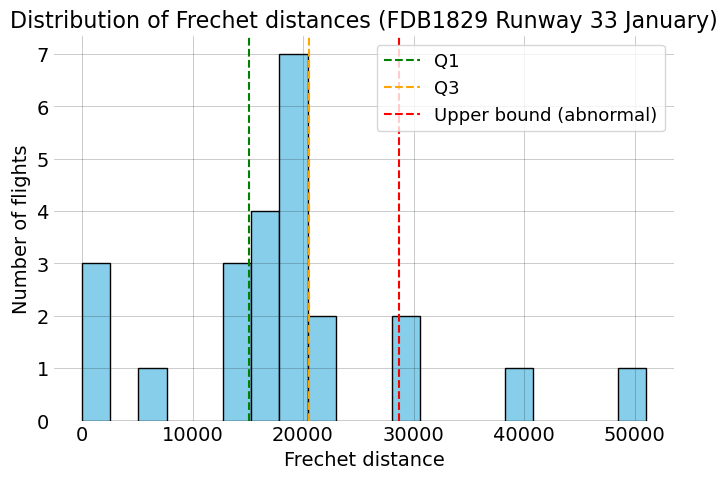

In [21]:
import matplotlib.pyplot as plt

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(frechet_df["frechet"], bins=20, color="skyblue", edgecolor="black")
    ax.axvline(Q1, color="green", linestyle="--", label="Q1")
    ax.axvline(Q3, color="orange", linestyle="--", label="Q3")
    ax.axvline(upper_bound, color="red", linestyle="--", label="Upper bound (abnormal)")
    ax.set_xlabel("Frechet distance")
    ax.set_ylabel("Number of flights")
    ax.set_title("Distribution of Frechet distances (FDB1829 Runway 33 January)")
    ax.legend()
plt.show()

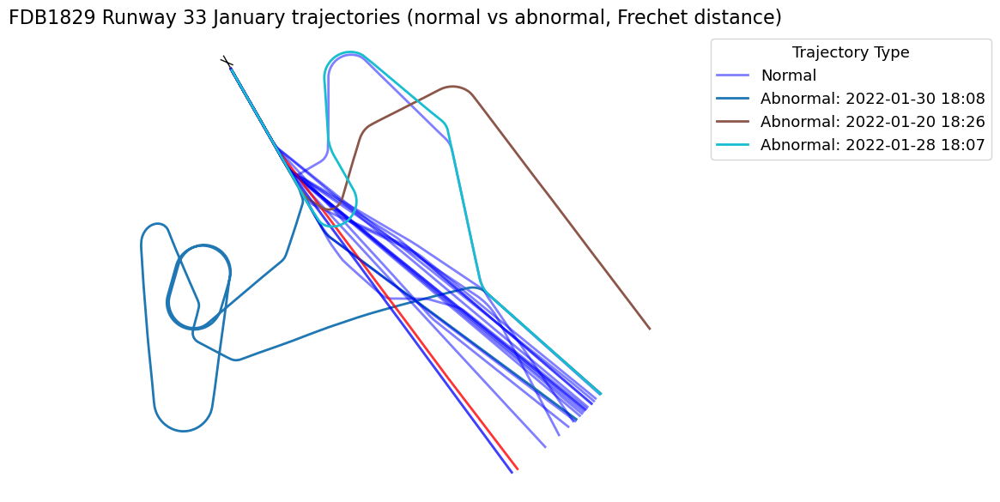

In [34]:
# Plot normal vs abnormal flights based on Frechet distance, show abnormal start time
abnormal_icao24s = set(abnormal_frechet["icao24"])

# Map abnormal icao24 to their start timestamp
abnormal_start_times = {}
for flight in fdb1829_runway33_m1_traffic:
    if flight.icao24 in abnormal_icao24s:
        abnormal_start_times[flight.icao24] = flight.data.timestamp.iloc[0]

# Assign a unique color for each abnormal flight
abn_cmap = plt.colormaps["tab10"].resampled(len(abnormal_icao24s))
abn_colors = {icao24: abn_cmap(i) for i, icao24 in enumerate(sorted(abnormal_icao24s))}

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    norm_label_added = False
    abn_label_added = {icao24: False for icao24 in abnormal_icao24s}

    for flight in fdb1829_runway33_m1_traffic:
        if flight.icao24 in abnormal_icao24s:
            color = abn_colors[flight.icao24]
            alpha = 1.0
            label = (
                f"Abnormal: {abnormal_start_times[flight.icao24].strftime('%Y-%m-%d %H:%M')}"
                if not abn_label_added[flight.icao24] else None
            )
            abn_label_added[flight.icao24] = True
            flight.plot(ax, linewidth=2, color=color, alpha=alpha, label=label)
        elif flight.icao24 == ref_flight.icao24 and flight.data["timestamp"].iloc[0] == ref_flight.data["timestamp"].iloc[0]:
            color = "red"
            alpha = 0.8
            label = "Reference (median length)" if not norm_label_added else None
            norm_label_added = True
            flight.plot(ax, linewidth=2, color=color, alpha=alpha, label=label)
        else :
            color = "blue"
            alpha = 0.5
            label = "Normal" if not norm_label_added else None
            norm_label_added = True
            flight.plot(ax, linewidth=2, color=color, alpha=alpha, label=label)

    ax.legend(title="Trajectory Type", bbox_to_anchor=(1.05, 1), loc="upper left")
    ax.set_title("FDB1829 Runway 33 January trajectories (normal vs abnormal, Frechet distance)")
plt.show()

## Dynamic Time Warping (DTW)

In [ ]:
from tslearn.metrics import dtw

# Prepare 3D arrays for DTW: use x, y, altitude for each flight
def get_xyz_array(flight):
    df = flight.data
    return np.column_stack([df.x, df.y, df.altitude])

# Choose a reference trajectory (e.g., median length)
lengths = [len(f.data) for f in fdb1829_runway33_m1_traffic]
median_idx = np.argsort(lengths)[len(lengths) // 2]
ref_flight = list(fdb1829_runway33_m1_traffic)[median_idx]
ref_xyz = get_xyz_array(ref_flight)

# Compute DTW distances for all flights
dtw_distances = []
for flight in fdb1829_runway33_m1_traffic:
    xyz = get_xyz_array(flight)
    dist = dtw(ref_xyz, xyz)
    dtw_distances.append({"icao24": flight.icao24, "callsign": flight.callsign, "dtw_3d": dist})

dtw3d_df = pd.DataFrame(dtw_distances)

# Detect abnormal trajectories using IQR
Q1_3d = dtw3d_df["dtw_3d"].quantile(0.25)
Q3_3d = dtw3d_df["dtw_3d"].quantile(0.75)
IQR_3d = Q3_3d - Q1_3d
upper_bound_3d = Q3_3d + 1.5 * IQR_3d

abnormal_dtw3d = dtw3d_df[dtw3d_df["dtw_3d"] > upper_bound_3d]

print("DTW 3D distance statistics:")
print(dtw3d_df["dtw_3d"].describe())
print(f"\nIQR: {IQR_3d:.2f}")
print(f"Q1: {Q1_3d:.2f}")
print(f"Q3: {Q3_3d:.2f}")
print(f"Upper bound: {upper_bound_3d:.2f}")
print(f"Number of abnormal flights: {len(abnormal_dtw3d)}")
print(f"Abnormal ICAO24s: {set(abnormal_dtw3d['icao24'])}")

abnormal_dtw3d

DTW 3D distance statistics:
count    2.400000e+01
mean     3.161928e+05
std      3.228624e+05
min      0.000000e+00
25%      1.757616e+05
50%      2.271686e+05
75%      2.864369e+05
max      1.512017e+06
Name: dtw_3d, dtype: float64

IQR: 110675.36
Q1: 175761.55
Q3: 286436.91
Upper bound: 452449.96
Number of abnormal flights: 4
Abnormal ICAO24s: {'8965b2', '89656a', '8964d3', '896531'}


,icao24,callsign,dtw_3d
5,8964d3,FDB1829,1.512017e+06
15,896531,FDB1829,6.122243e+05
19,89656a,FDB1829,8.549899e+05
23,8965b2,FDB1829,6.968880e+05


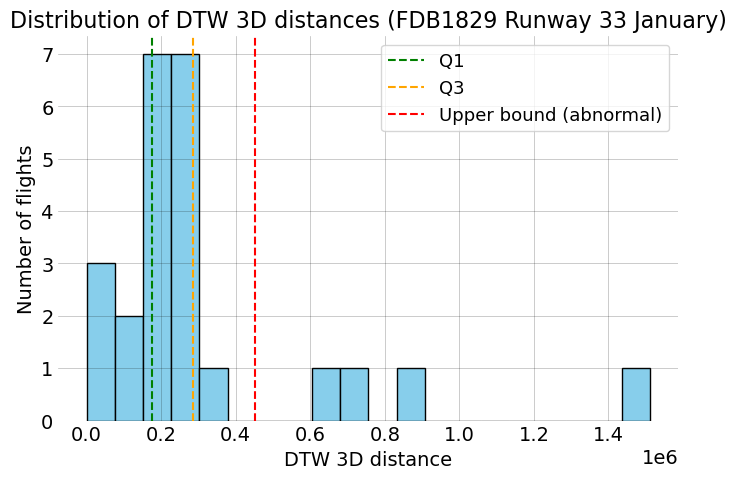

In [37]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(dtw3d_df["dtw_3d"], bins=20, color="skyblue", edgecolor="black")
    ax.axvline(Q1_3d, color="green", linestyle="--", label="Q1")
    ax.axvline(Q3_3d, color="orange", linestyle="--", label="Q3")
    ax.axvline(upper_bound_3d, color="red", linestyle="--", label="Upper bound (abnormal)")
    ax.set_xlabel("DTW 3D distance")
    ax.set_ylabel("Number of flights")
    ax.set_title("Distribution of DTW 3D distances (FDB1829 Runway 33 January)")
    ax.legend()
plt.show()

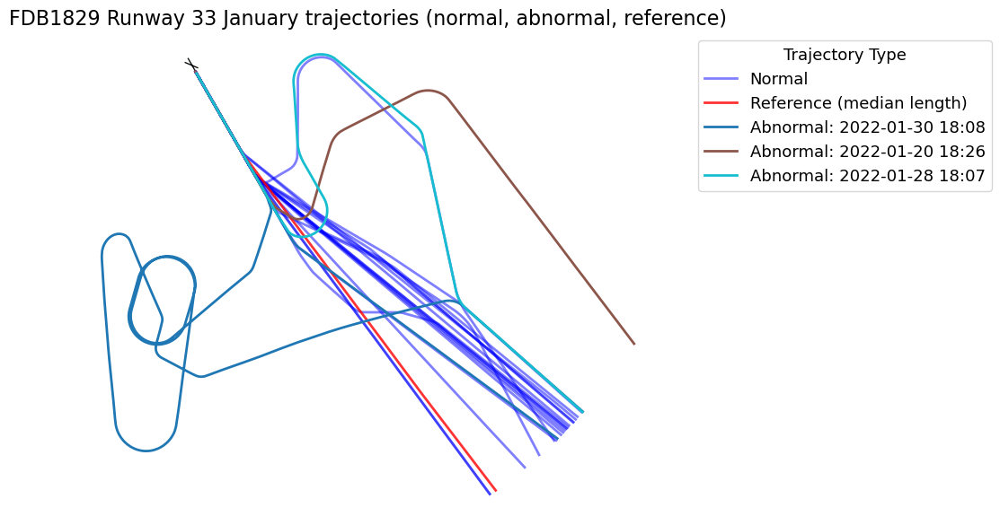

In [36]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Plot normal trajectories
    norm_label_added = False
    for flight in fdb1829_runway33_m1_traffic:
        if flight.icao24 not in abnormal_icao24s and flight.icao24 != ref_flight.icao24:
            label = "Normal" if not norm_label_added else None
            norm_label_added = True
            flight.plot(ax, linewidth=2, color="blue", alpha=0.5, label=label)

    # Plot reference trajectory
    ref_label = "Reference (median length)"
    ref_flight.plot(ax, linewidth=2, color="red", alpha=0.8, label=ref_label)

    # Plot abnormal trajectories
    abn_label_added = {icao24: False for icao24 in abnormal_icao24s}
    for flight in fdb1829_runway33_m1_traffic:
        if flight.icao24 in abnormal_icao24s:
            color = abn_colors[flight.icao24]
            ts = abnormal_start_times[flight.icao24]
            label = f"Abnormal: {ts.strftime('%Y-%m-%d %H:%M')}" if not abn_label_added[flight.icao24] else None
            abn_label_added[flight.icao24] = True
            flight.plot(ax, linewidth=2, color=color, alpha=1.0, label=label)

    ax.legend(title="Trajectory Type", bbox_to_anchor=(1.05, 1), loc="upper left")
    ax.set_title("FDB1829 Runway 33 January trajectories (normal, abnormal, reference)")
plt.show()

### Altitude

In [27]:
from tslearn.metrics import dtw

# Prepare altitude arrays for all flights, including date info
altitude_dtw = []
for flight in fdb1829_runway33_m1_traffic:
    # Get the date of the first timestamp as a string
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    altitude_dtw.append((flight.icao24, flight.data.altitude.values, date_str))

# Use the reference trajectory's altitude as baseline
ref_altitude = ref_flight.data.altitude.values

# Compute DTW distances for altitude only, include date
dtw_altitude_results = []
for icao24, alt, date_str in altitude_dtw:
    dist = dtw(ref_altitude, alt)
    dtw_altitude_results.append({"icao24": icao24, "date": date_str, "dtw_altitude": dist})

dtw_altitude_df = pd.DataFrame(dtw_altitude_results)

# Detect abnormal trajectories using IQR
Q1_alt = dtw_altitude_df["dtw_altitude"].quantile(0.25)
Q3_alt = dtw_altitude_df["dtw_altitude"].quantile(0.75)
IQR_alt = Q3_alt - Q1_alt
upper_bound_alt = Q3_alt + 1.5 * IQR_alt

abnormal_dtw_altitude = dtw_altitude_df[dtw_altitude_df["dtw_altitude"] > upper_bound_alt]

print("DTW altitude statistics:")
print(dtw_altitude_df["dtw_altitude"].describe())
print(f"\nIQR: {IQR_alt:.2f}")
print(f"Q1: {Q1_alt:.2f}")
print(f"Q3: {Q3_alt:.2f}")
print(f"Upper bound: {upper_bound_alt:.2f}")
print(f"Number of abnormal flights: {len(abnormal_dtw_altitude)}")
print(f"Abnormal ICAO24s: {set(abnormal_dtw_altitude['icao24'])}")

abnormal_dtw_altitude

DTW altitude statistics:
count       24.000000
mean      7788.915893
std      12578.010158
min          0.000000
25%       2250.322745
50%       3048.548953
75%       8488.612288
max      57643.865162
Name: dtw_altitude, dtype: float64

IQR: 6238.29
Q1: 2250.32
Q3: 8488.61
Upper bound: 17846.05
Number of abnormal flights: 2
Abnormal ICAO24s: {'89656a', '89656c'}


,icao24,date,dtw_altitude
19,89656a,20-01-2022,31320.659219
21,89656c,15-01-2022,57643.865162


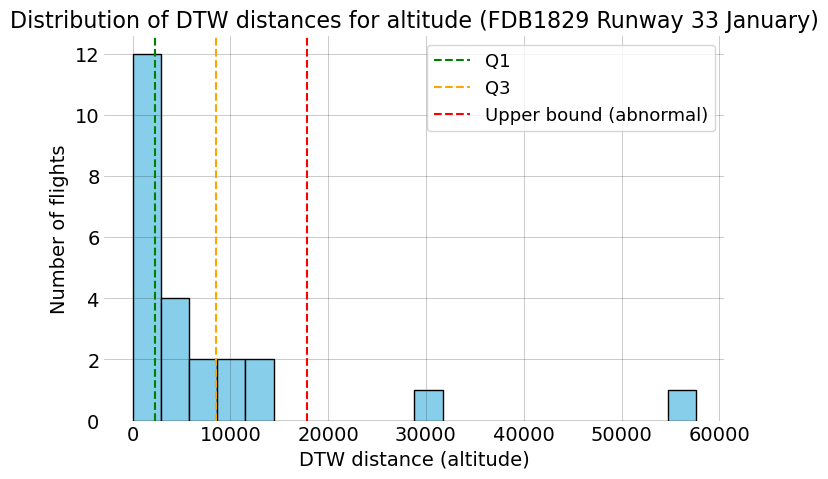

In [28]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(dtw_altitude_df["dtw_altitude"], bins=20, color="skyblue", edgecolor="black")
    ax.axvline(Q1_alt, color="green", linestyle="--", label="Q1")
    ax.axvline(Q3_alt, color="orange", linestyle="--", label="Q3")
    ax.axvline(upper_bound_alt, color="red", linestyle="--", label="Upper bound (abnormal)")
    ax.set_xlabel("DTW distance (altitude)")
    ax.set_ylabel("Number of flights")
    ax.set_title("Distribution of DTW distances for altitude (FDB1829 Runway 33 January)")
    ax.legend()
plt.show()

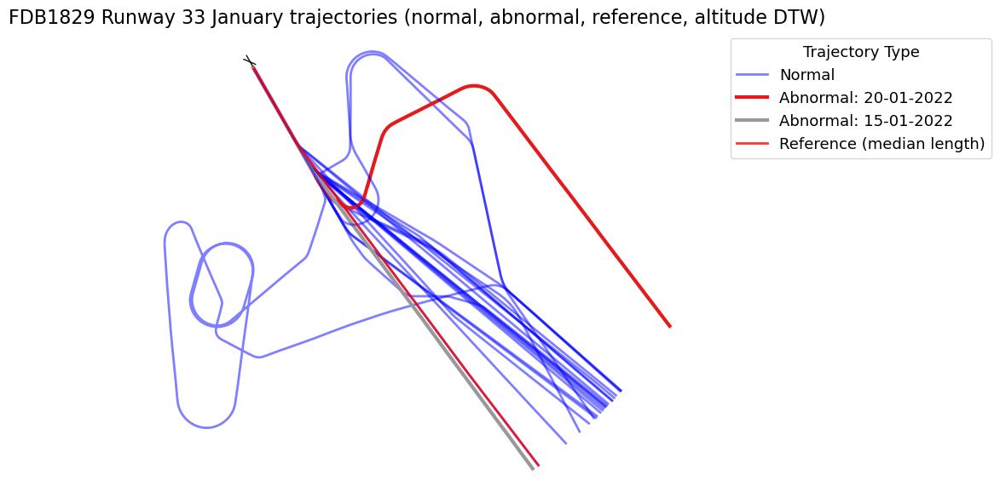

In [33]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Assign a unique color for each abnormal flight (by icao24+date)
    abn_keys = [(row["icao24"], row["date"]) for _, row in abnormal_dtw_altitude.iterrows()]
    abn_cmap = plt.colormaps["Set1"].resampled(len(abn_keys))
    abn_colors_alt = {key: abn_cmap(i) for i, key in enumerate(abn_keys)}

    norm_label_added = False
    abn_label_added = {key: False for key in abn_keys}
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        flight_day = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, flight_day)
        abn_row = dtw_altitude_df[(dtw_altitude_df["icao24"] == icao24) & (dtw_altitude_df["date"] == flight_day)]
        if not abn_row.empty and key in abn_colors_alt:
            color = abn_colors_alt[key]
            label = f"Abnormal: {flight_day}" if not abn_label_added[key] else None
            abn_label_added[key] = True
            flight.plot(ax, linewidth=3, color=color, alpha=1.0, label=label)
        else:
            label = "Normal" if not norm_label_added else None
            norm_label_added = True if label else norm_label_added
            flight.plot(ax, linewidth=2, color="blue", alpha=0.5, label=label)

    # Plot reference trajectory
    ref_label = "Reference (median length)"
    ref_flight.plot(ax, linewidth=2, color="red", alpha=0.8, label=ref_label)
    ax.legend(title="Trajectory Type", bbox_to_anchor=(1.05, 1), loc="upper left")
    ax.set_title("FDB1829 Runway 33 January trajectories (normal, abnormal, reference, altitude DTW)")
plt.show()


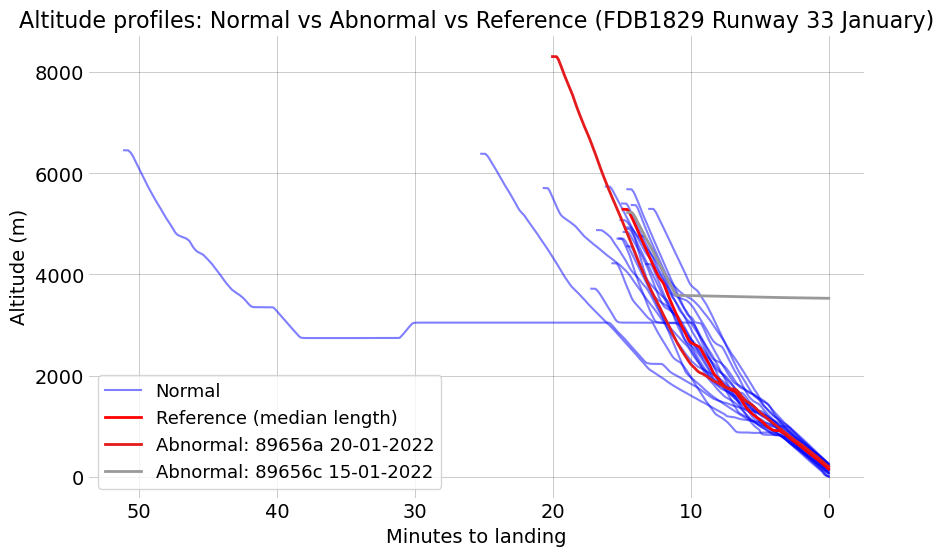

In [ ]:
abn_keys = [(row["icao24"], row["date"]) for _, row in abnormal_dtw_altitude.iterrows()]
abn_keys_set = set(abn_keys)
abn_cmap = plt.colormaps["Set1"].resampled(len(abn_keys))
abn_colors_alt = {key: abn_cmap(i) for i, key in enumerate(abn_keys)}

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot normal flights
    norm_label_added = False
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        flight_day = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, flight_day)
        if key not in abn_keys_set and icao24 != ref_flight.icao24:
            df = flight.data
            time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
            label = "Normal" if not norm_label_added else None
            norm_label_added = True if label else norm_label_added
            ax.plot(time_to_end, df.altitude.values, color="blue", alpha=0.5, label=label)

    # Plot reference trajectory
    df_ref = ref_flight.data
    time_to_end_ref = (df_ref.timestamp.iloc[-1] - df_ref.timestamp).dt.total_seconds() / 60
    ax.plot(time_to_end_ref, df_ref.altitude.values, color="red", linewidth=2, label="Reference (median length)")

    # Plot abnormal flights, each with a unique color and label
    abn_label_added = {key: False for key in abn_keys}
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        flight_day = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, flight_day)
        if key in abn_colors_alt:
            df = flight.data
            time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
            label = f"Abnormal: {icao24} {flight_day}" if not abn_label_added[key] else None
            abn_label_added[key] = True
            ax.plot(time_to_end, df.altitude.values, color=abn_colors_alt[key], linewidth=2, label=label)

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Altitude (m)")
    ax.set_title("Altitude profiles: Normal vs Abnormal vs Reference (FDB1829 Runway 33 January)")
    ax.invert_xaxis()
    ax.legend()
plt.show()

### Ground speed

In [37]:
from tslearn.metrics import dtw

# Prepare groundspeed arrays for all flights, including date info
groundspeed_dtw = []
for flight in fdb1829_runway33_m1_traffic:
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    groundspeed_dtw.append((flight.icao24, flight.data.groundspeed.values, date_str))

# Use the reference trajectory's groundspeed as baseline
ref_groundspeed = df_ref.groundspeed.values

# Compute DTW distances for groundspeed only, include date
dtw_groundspeed_results = []
for icao24, gs, date_str in groundspeed_dtw:
    dist = dtw(ref_groundspeed, gs)
    dtw_groundspeed_results.append({"icao24": icao24, "date": date_str, "dtw_groundspeed": dist})

dtw_groundspeed_df = pd.DataFrame(dtw_groundspeed_results)

# Detect abnormal trajectories using IQR
Q1_gs = dtw_groundspeed_df["dtw_groundspeed"].quantile(0.25)
Q3_gs = dtw_groundspeed_df["dtw_groundspeed"].quantile(0.75)
IQR_gs = Q3_gs - Q1_gs
upper_bound_gs = Q3_gs + 1.5 * IQR_gs

abnormal_dtw_groundspeed = dtw_groundspeed_df[dtw_groundspeed_df["dtw_groundspeed"] > upper_bound_gs]

print("DTW groundspeed statistics:")
print(dtw_groundspeed_df["dtw_groundspeed"].describe())
print(f"\nIQR: {IQR_gs:.2f}")
print(f"Q1: {Q1_gs:.2f}")
print(f"Q3: {Q3_gs:.2f}")
print(f"Upper bound: {upper_bound_gs:.2f}")
print(f"Number of abnormal flights: {len(abnormal_dtw_groundspeed)}")
print(f"Abnormal ICAO24s: {set(abnormal_dtw_groundspeed['icao24'])}")

abnormal_dtw_groundspeed

DTW groundspeed statistics:
count     24.000000
mean     180.274815
std      197.551366
min        0.000000
25%       72.608597
50%      119.624463
75%      251.086169
max      940.065944
Name: dtw_groundspeed, dtype: float64

IQR: 178.48
Q1: 72.61
Q3: 251.09
Upper bound: 518.80
Number of abnormal flights: 1
Abnormal ICAO24s: {'8964d3'}


,icao24,date,dtw_groundspeed
5,8964d3,30-01-2022,940.065944


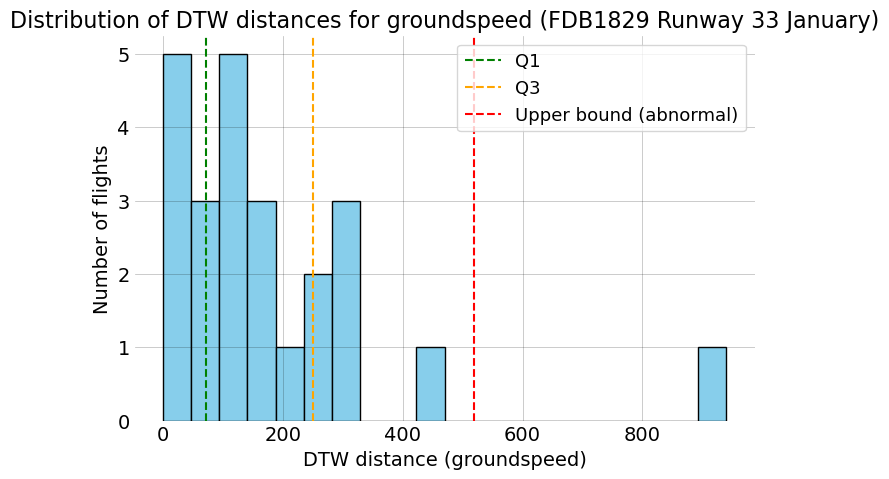

In [41]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(dtw_groundspeed_df["dtw_groundspeed"], bins=20, color="skyblue", edgecolor="black")
    ax.axvline(Q1_gs, color="green", linestyle="--", label="Q1")
    ax.axvline(Q3_gs, color="orange", linestyle="--", label="Q3")
    ax.axvline(upper_bound_gs, color="red", linestyle="--", label="Upper bound (abnormal)")
    ax.set_xlabel("DTW distance (groundspeed)")
    ax.set_ylabel("Number of flights")
    ax.set_title("Distribution of DTW distances for groundspeed (FDB1829 Runway 33 January)")
    ax.legend()
plt.show()

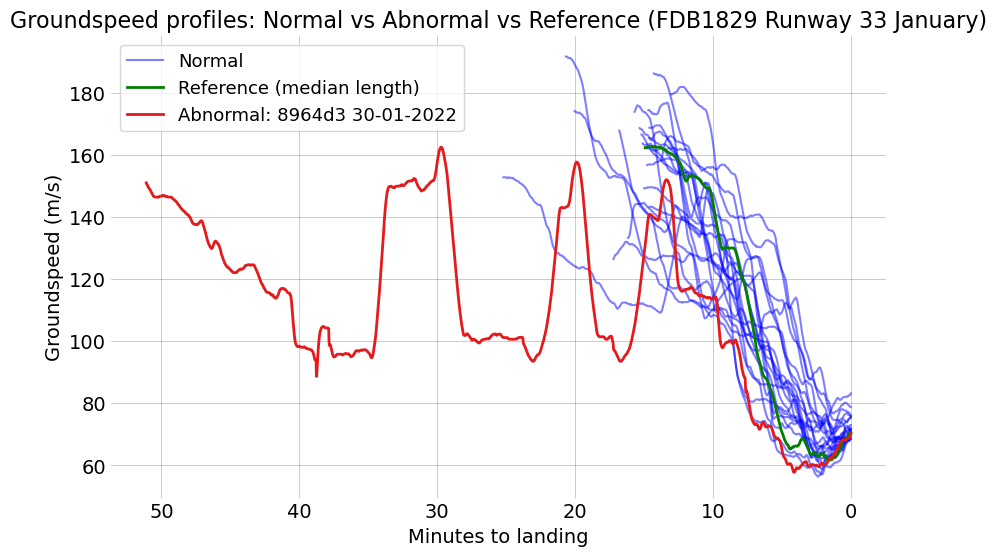

In [43]:
# Plot groundspeed vs. minutes to landing for all flights, highlighting reference and abnormal flights

# Prepare abnormal keys (icao24, date) for groundspeed DTW
abn_gs_keys = [(row["icao24"], row["date"]) for _, row in abnormal_dtw_groundspeed.iterrows()]
abn_gs_keys_set = set(abn_gs_keys)
abn_gs_cmap = plt.colormaps["Set1"].resampled(len(abn_gs_keys))
abn_gs_colors = {key: abn_gs_cmap(i) for i, key in enumerate(abn_gs_keys)}

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot normal flights
    norm_label_added = False
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        flight_day = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, flight_day)
        if key not in abn_gs_keys_set and icao24 != ref_flight.icao24:
            df = flight.data
            time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
            label = "Normal" if not norm_label_added else None
            norm_label_added = True if label else norm_label_added
            ax.plot(time_to_end, df.groundspeed.values, color="blue", alpha=0.5, label=label)

    # Plot reference flight
    ax.plot(time_to_end_ref, ref_groundspeed, color="green", linewidth=2, label=ref_label)

    # Plot abnormal flights
    abn_label_added = {key: False for key in abn_gs_keys}
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        flight_day = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, flight_day)
        if key in abn_gs_colors:
            df = flight.data
            time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
            label = f"Abnormal: {icao24} {flight_day}" if not abn_label_added[key] else None
            abn_label_added[key] = True
            ax.plot(time_to_end, df.groundspeed.values, color=abn_gs_colors[key], linewidth=2, label=label)

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Groundspeed (m/s)")
    ax.set_title("Groundspeed profiles: Normal vs Abnormal vs Reference (FDB1829 Runway 33 January)")
    ax.invert_xaxis()
    ax.legend()
plt.show()

### Vertical rate

In [ ]:
from tslearn.metrics import dtw

# Prepare vertical_rate arrays for all flights, including date info
vertical_rate_dtw = []
for flight in fdb1829_runway33_m1_traffic:
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    vertical_rate_dtw.append((flight.icao24, flight.data.vertical_rate.values, date_str))

# Use the reference trajectory's vertical_rate as baseline
ref_vertical_rate = ref_flight.data.vertical_rate.values

# Compute DTW distances for vertical_rate only, include date
dtw_vertical_rate_results = []
for icao24, vr, date_str in vertical_rate_dtw:
    dist = dtw(ref_vertical_rate, vr)
    dtw_vertical_rate_results.append({"icao24": icao24, "date": date_str, "dtw_vertical_rate": dist})

dtw_vertical_rate_df = pd.DataFrame(dtw_vertical_rate_results)

# Detect abnormal trajectories using IQR
Q1_vr = dtw_vertical_rate_df["dtw_vertical_rate"].quantile(0.25)
Q3_vr = dtw_vertical_rate_df["dtw_vertical_rate"].quantile(0.75)
IQR_vr = Q3_vr - Q1_vr
upper_bound_vr = Q3_vr + 1.5 * IQR_vr

abnormal_dtw_vertical_rate = dtw_vertical_rate_df[dtw_vertical_rate_df["dtw_vertical_rate"] > upper_bound_vr]

print("DTW vertical_rate statistics:")
print(dtw_vertical_rate_df["dtw_vertical_rate"].describe())
print(f"\nIQR: {IQR_vr:.2f}")
print(f"Q1: {Q1_vr:.2f}")
print(f"Q3: {Q3_vr:.2f}")
print(f"Upper bound: {upper_bound_vr:.2f}")
print(f"Number of abnormal flights: {len(abnormal_dtw_vertical_rate)}")
print(f"Abnormal ICAO24s: {set(abnormal_dtw_vertical_rate['icao24'])}")

abnormal_dtw_vertical_rate

DTW vertical_rate statistics:
count    24.000000
mean     34.067128
std      13.214799
min       0.000000
25%      28.029030
50%      32.514333
75%      41.494627
max      63.991984
Name: dtw_vertical_rate, dtype: float64

IQR: 13.47
Q1: 28.03
Q3: 41.49
Upper bound: 61.69
Number of abnormal flights: 1
Abnormal ICAO24s: {'8964d3'}


,icao24,date,dtw_vertical_rate
5,8964d3,30-01-2022,63.991984


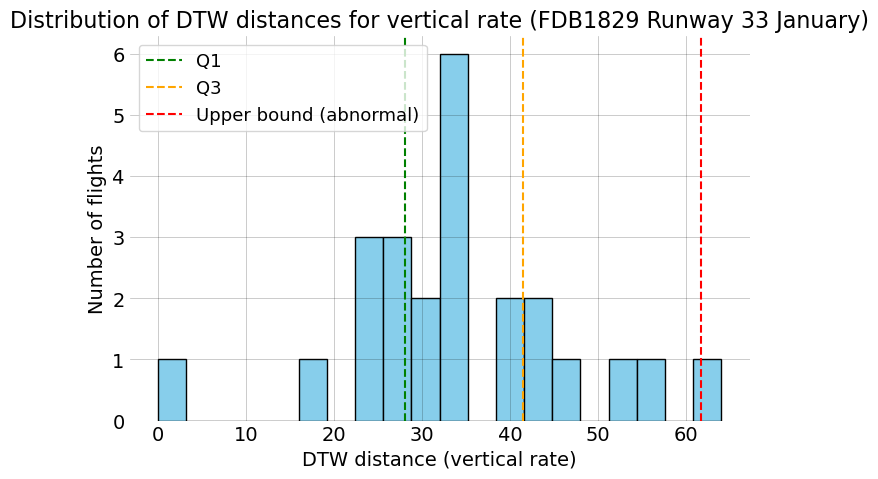

In [46]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(dtw_vertical_rate_df["dtw_vertical_rate"], bins=20, color="skyblue", edgecolor="black")
    ax.axvline(Q1_vr, color="green", linestyle="--", label="Q1")
    ax.axvline(Q3_vr, color="orange", linestyle="--", label="Q3")
    ax.axvline(upper_bound_vr, color="red", linestyle="--", label="Upper bound (abnormal)")
    ax.set_xlabel("DTW distance (vertical rate)")
    ax.set_ylabel("Number of flights")
    ax.set_title("Distribution of DTW distances for vertical rate (FDB1829 Runway 33 January)")
    ax.legend()
plt.show()

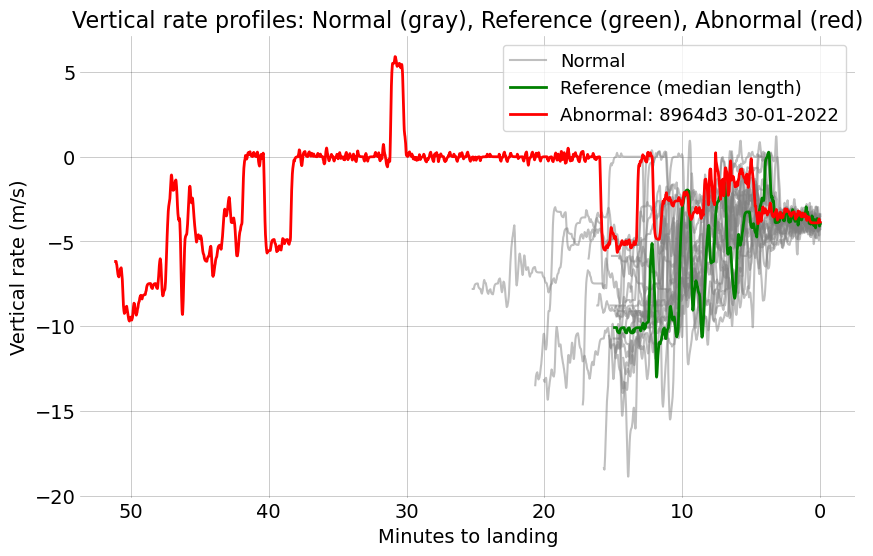

In [47]:
# Prepare abnormal keys (icao24, date) for vertical rate DTW
abn_vr_keys = [(row["icao24"], row["date"]) for _, row in abnormal_dtw_vertical_rate.iterrows()]
abn_vr_keys_set = set(abn_vr_keys)
abn_vr_cmap = plt.colormaps["Set1"].resampled(len(abn_vr_keys))
abn_vr_colors = {key: abn_vr_cmap(i) for i, key in enumerate(abn_vr_keys)}

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot normal flights
    norm_label_added = False
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        flight_day = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, flight_day)
        if key not in abn_vr_keys_set and icao24 != ref_flight.icao24:
            df = flight.data
            time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
            label = "Normal" if not norm_label_added else None
            norm_label_added = True if label else norm_label_added
            ax.plot(time_to_end, df.vertical_rate.values, color="gray", alpha=0.5, label=label)

    # Plot reference trajectory in green
    ax.plot(time_to_end_ref, ref_vertical_rate, color="green", linewidth=2, label=ref_label)

    # Plot abnormal flights in red
    abn_label_added = {key: False for key in abn_vr_keys}
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        flight_day = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, flight_day)
        if key in abn_vr_keys_set:
            df = flight.data
            time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
            label = f"Abnormal: {icao24} {flight_day}" if not abn_label_added[key] else None
            abn_label_added[key] = True
            ax.plot(time_to_end, df.vertical_rate.values, color="red", linewidth=2, label=label)

    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Vertical rate (m/s)")
    ax.set_title("Vertical rate profiles: Normal (gray), Reference (green), Abnormal (red)")
    ax.invert_xaxis()
    ax.legend()
plt.show()

### Heading

In [69]:
fdb1829_runway33_m1_traffic = fdb1829_runway33_m1_traffic.unwrap().eval()

In [79]:
from dtaidistance import dtw, clustering

# Prepare heading (track) time series for each flight
heading_series = []
icao24_date_list = []  # Store (icao24, date) for unique identification
for flight in fdb1829_runway33_m1_traffic:
    df = flight.data
    heading_series.append(df.track_unwrapped.values)
    date_str = df.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_date_list.append((flight.icao24, date_str))

# Perform k-medoids clustering with k=2 using the distance function
k = 2
model = clustering.KMedoids(dtw.distance_matrix_fast, {}, k=k)
cluster_idx = model.fit(heading_series)

In [81]:
# Print cluster assignments for pyclustering-style output
for medoid_idx, sample_indices in cluster_idx.items():
    print(f"Cluster (medoid idx {medoid_idx}):")
    for i in sample_indices:
        print(f"  ICAO24: {icao24_date_list[i]}")
    print(f"  Medoid ICAO24: {icao24_date_list[medoid_idx]}")

Cluster (medoid idx 5):
  ICAO24: ('8964d3', '30-01-2022')
  Medoid ICAO24: ('8964d3', '30-01-2022')
Cluster (medoid idx 22):
  ICAO24: ('896378', '19-01-2022')
  ICAO24: ('8964d2', '03-01-2022')
  ICAO24: ('8964d2', '17-01-2022')
  ICAO24: ('8964d2', '29-01-2022')
  ICAO24: ('8964d3', '02-01-2022')
  ICAO24: ('896513', '16-01-2022')
  ICAO24: ('896517', '13-01-2022')
  ICAO24: ('896517', '25-01-2022')
  ICAO24: ('896530', '01-01-2022')
  ICAO24: ('896530', '05-01-2022')
  ICAO24: ('896530', '06-01-2022')
  ICAO24: ('896530', '12-01-2022')
  ICAO24: ('896530', '18-01-2022')
  ICAO24: ('896530', '27-01-2022')
  ICAO24: ('896531', '31-01-2022')
  ICAO24: ('896532', '21-01-2022')
  ICAO24: ('896532', '26-01-2022')
  ICAO24: ('896533', '14-01-2022')
  ICAO24: ('89656a', '20-01-2022')
  ICAO24: ('89656b', '10-01-2022')
  ICAO24: ('89656c', '15-01-2022')
  ICAO24: ('89656c', '22-01-2022')
  ICAO24: ('8965b2', '28-01-2022')
  Medoid ICAO24: ('89656c', '22-01-2022')


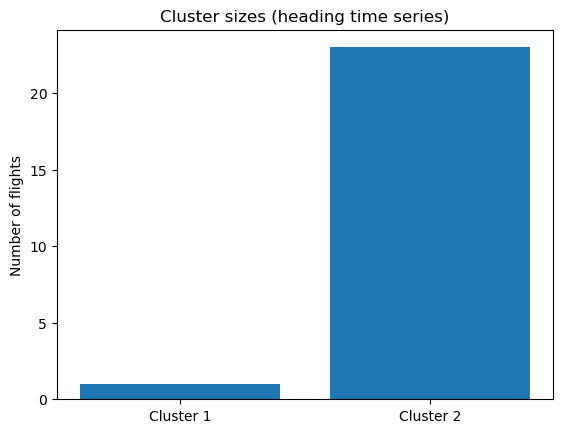

In [83]:
cluster_sizes = {medoid_idx: len(indices) for medoid_idx, indices in cluster_idx.items()}
plt.bar([f"Cluster {i+1}" for i in range(len(cluster_sizes))], list(cluster_sizes.values()))
plt.ylabel("Number of flights")
plt.title("Cluster sizes (heading time series)")
plt.show()

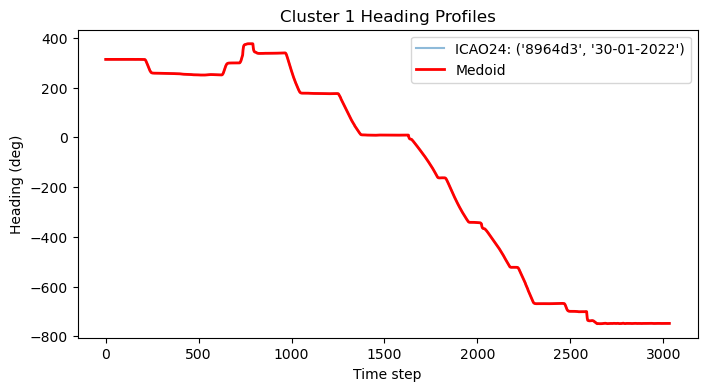

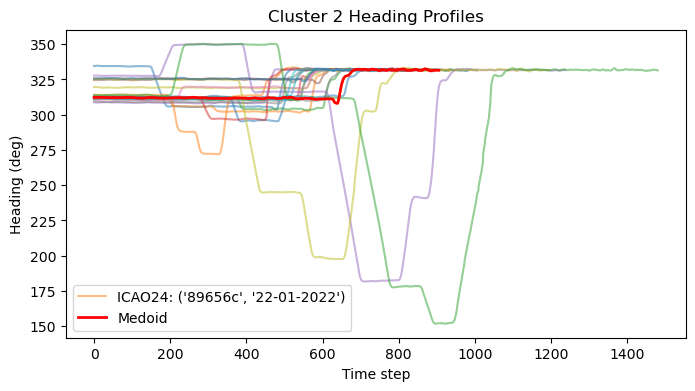

In [84]:
for cluster_num, (medoid_idx, indices) in enumerate(cluster_idx.items()):
    plt.figure(figsize=(8, 4))
    for i in indices:
        plt.plot(heading_series[i], alpha=0.5, label=f"ICAO24: {icao24_date_list[i]}" if i == medoid_idx else None)
    plt.plot(heading_series[medoid_idx], color="red", linewidth=2, label="Medoid")
    plt.title(f"Cluster {cluster_num+1} Heading Profiles")
    plt.xlabel("Time step")
    plt.ylabel("Heading (deg)")
    plt.legend()
    plt.show()

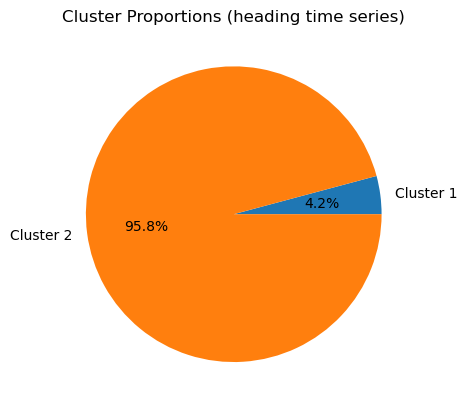

In [85]:
plt.pie(list(cluster_sizes.values()), labels=[f"Cluster {i+1}" for i in range(len(cluster_sizes))], autopct='%1.1f%%')
plt.title("Cluster Proportions (heading time series)")
plt.show()

In [87]:
first_cluster_medoid = list(cluster_idx.keys())[1]
first_cluster_indices = cluster_idx[first_cluster_medoid]
cluster1_headings = [heading_series[i] for i in first_cluster_indices]
cluster1_icao24s = [icao24_date_list[i] for i in first_cluster_indices]
medoid_heading = heading_series[first_cluster_medoid]

# Compute DTW distance to medoid for each flight in cluster 1
dtw_distances = []
for i, series in enumerate(cluster1_headings):
    dist = dtw.distance(medoid_heading, series)
    dtw_distances.append({"icao24": cluster1_icao24s[i], "dtw": dist})

dtw_df = pd.DataFrame(dtw_distances)

# Detect abnormal flights using IQR
Q1 = dtw_df["dtw"].quantile(0.25)
Q3 = dtw_df["dtw"].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR

abnormal_cluster1 = dtw_df[dtw_df["dtw"] > upper_bound]
print("Abnormal ICAO24s in Cluster 1 (DTW to medoid):", list(abnormal_cluster1["icao24"]))
abnormal_cluster1

Abnormal ICAO24s in Cluster 1 (DTW to medoid): [('896531', '31-01-2022'), ('89656a', '20-01-2022'), ('8965b2', '28-01-2022')]


,icao24,dtw
14,"(896531, 31-01-2022)",1719.880248
18,"(89656a, 20-01-2022)",1419.862727
22,"(8965b2, 28-01-2022)",2245.564280


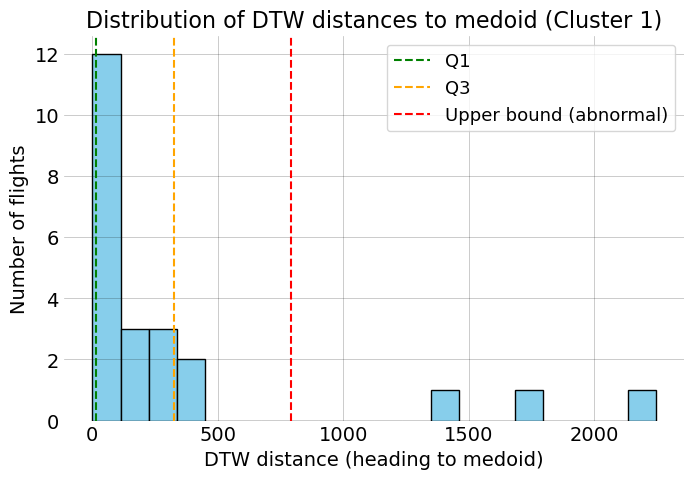

In [88]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(dtw_df["dtw"], bins=20, color="skyblue", edgecolor="black")
    ax.axvline(Q1, color="green", linestyle="--", label="Q1")
    ax.axvline(Q3, color="orange", linestyle="--", label="Q3")
    ax.axvline(upper_bound, color="red", linestyle="--", label="Upper bound (abnormal)")
    ax.set_xlabel("DTW distance (heading to medoid)")
    ax.set_ylabel("Number of flights")
    ax.set_title("Distribution of DTW distances to medoid (Cluster 1)")
    ax.legend()
plt.show()

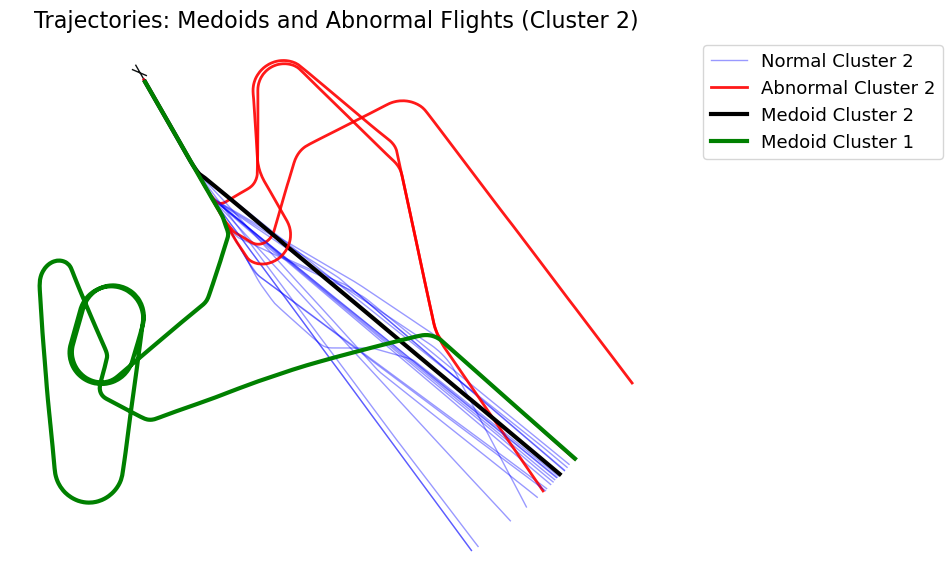

In [96]:
with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()), figsize=(10, 7))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Get medoid indices for both clusters
    medoid1_idx = list(cluster_idx.keys())[0]
    medoid2_idx = list(cluster_idx.keys())[1]
    medoid1_key = icao24_date_list[medoid1_idx]
    medoid2_key = icao24_date_list[medoid2_idx]

    # Prepare (icao24, date) for cluster 2
    cluster2_indices = cluster_idx[medoid2_idx]
    cluster2_keys = [icao24_date_list[i] for i in cluster2_indices]

    # Prepare abnormal keys (icao24, date)
    abnormal_keys = set(tuple(row["icao24"]) for _, row in abnormal_cluster1.iterrows())

    # For legend
    norm_label_added = False
    abn_label_added = False
    medoid_label_added = False

    # Plot all cluster 2 flights (normal in blue, abnormal in red, medoid in black)
    for i, idx in enumerate(cluster2_indices):
        key = icao24_date_list[idx]
        # Find the correct flight by icao24 and date
        flight = next(
            (
                f
                for f in fdb1829_runway33_m1_traffic
                if (f.icao24, f.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]) == key
            ),
            None,
        )
        if flight is None:
            continue
        if idx == medoid2_idx and not medoid_label_added:
            flight.plot(ax, linewidth=3, color="black", alpha=1.0, label="Medoid Cluster 2")
            medoid_label_added = True
        elif key in abnormal_keys and not abn_label_added:
            flight.plot(ax, linewidth=2, color="red", alpha=0.9, label="Abnormal Cluster 2")
            abn_label_added = True
        elif key in abnormal_keys:
            flight.plot(ax, linewidth=2, color="red", alpha=0.9)
        elif not norm_label_added:
            flight.plot(ax, linewidth=1, color="blue", alpha=0.4, label="Normal Cluster 2")
            norm_label_added = True
        else:
            flight.plot(ax, linewidth=1, color="blue", alpha=0.4)

    # Plot medoid from cluster 1 in green
    medoid1_flight = next(
        (
            f
            for f in fdb1829_runway33_m1_traffic
            if (f.icao24, f.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]) == medoid1_key
        ),
        None,
    )
    if medoid1_flight is not None:
        medoid1_flight.plot(ax, linewidth=3, color="green", alpha=1.0, label="Medoid Cluster 1")

    ax.set_title("Trajectories: Medoids and Abnormal Flights (Cluster 2)")
    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

#### Aglomerative clustering

In [100]:
from dtaidistance import dtw, clustering

# Use heading_series from previous code (list of np.arrays)
# Example: heading_series = [df.track_unwrapped.values for flight in fdb1829_runway33_m1_traffic]

# Custom Hierarchical clustering (agglomerative)
model1 = clustering.Hierarchical(dtw.distance_matrix_fast, {})
cluster_idx1 = model1.fit(heading_series)

# Keep track of full tree by using the HierarchicalTree wrapper class
model2 = clustering.HierarchicalTree(model1)
cluster_idx2 = model2.fit(heading_series)

# You can also instantiate HierarchicalTree directly
model3 = clustering.HierarchicalTree(dists_fun=dtw.distance_matrix_fast, dists_options={})
cluster_idx3 = model3.fit(heading_series)

# Example: print cluster assignments for model1
for cluster_id, indices in cluster_idx1.items():
    print(f"Cluster {cluster_id}: {[icao24_date_list[i] for i in indices]}")

 96%|█████████▌| 23/24 [00:00<00:00, 11372.04it/s]

Cluster 0: [('896378', '19-01-2022'), ('8964d2', '03-01-2022'), ('8964d2', '17-01-2022'), ('8964d2', '29-01-2022'), ('8964d3', '02-01-2022'), ('8964d3', '30-01-2022'), ('896513', '16-01-2022'), ('896517', '13-01-2022'), ('896517', '25-01-2022'), ('896530', '01-01-2022'), ('896530', '05-01-2022'), ('896530', '06-01-2022'), ('896530', '12-01-2022'), ('896530', '18-01-2022'), ('896530', '27-01-2022'), ('896531', '31-01-2022'), ('896532', '21-01-2022'), ('896532', '26-01-2022'), ('896533', '14-01-2022'), ('89656a', '20-01-2022'), ('89656b', '10-01-2022'), ('89656c', '15-01-2022'), ('89656c', '22-01-2022'), ('8965b2', '28-01-2022')]


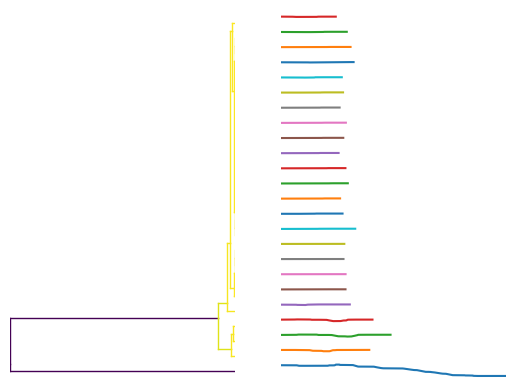

In [ ]:
fig, ax = model2.plot()
plt.show()

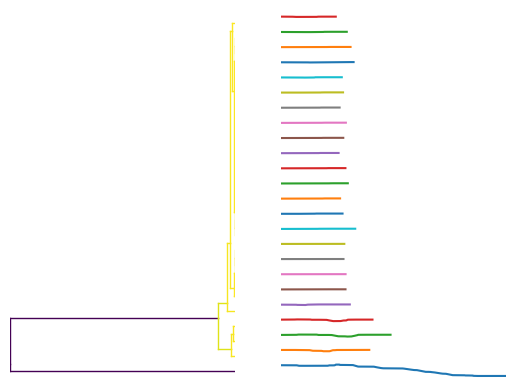

In [113]:
model3.plot()
plt.show()

In [114]:
model2.linkage

[(21, 6, np.float64(5.019378366434838), 0),
 (20, 13, np.float64(5.760292651759472), 0),
 (18, 4, np.float64(5.815548133337967), 0),
 (25, 7, np.float64(6.548552618491322), 0),
 (10, 3, np.float64(6.991212689112332), 0),
 (8, 27, np.float64(7.853218985481439), 0),
 (22, 29, np.float64(8.965752952612549), 0),
 (30, 28, np.float64(10.994001171178208), 0),
 (16, 24, np.float64(12.301645101746582), 0),
 (2, 1, np.float64(22.81014953342312), 0),
 (14, 11, np.float64(23.70734913934607), 0),
 (17, 31, np.float64(28.66332566324087), 0),
 (34, 33, np.float64(63.79147285996767), 0),
 (26, 35, np.float64(78.9328696935446), 0),
 (9, 32, np.float64(146.03818986036225), 0),
 (37, 36, np.float64(155.56961707939996), 0),
 (39, 0, np.float64(255.92151452703956), 0),
 (38, 40, np.float64(319.3047279088995), 0),
 (23, 15, np.float64(322.79709781196755), 0),
 (19, 42, np.float64(382.52498535395756), 0),
 (12, 41, np.float64(402.42333866141166), 0),
 (43, 44, np.float64(1565.6908207018032), 0),
 (5, 45, np

In [118]:
linkage = model2.linkage

# Extract the third element (distance) from each tuple
distances = np.array([row[2] for row in linkage])

# Use IQR to find outlier merges
Q1 = np.percentile(distances, 25)
Q3 = np.percentile(distances, 75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR

# Find merges above the upper bound
outlier_merges = np.where(distances > upper_bound)[0]

print(f"Upper bound for outlier merges: {upper_bound:.2f}")
print(f"Indices of outlier merges: {outlier_merges}")

# Show which samples are involved in these merges
for idx in outlier_merges:
    left = linkage[idx][0]
    right = linkage[idx][1]
    dist = linkage[idx][2]
    print(f"Merge at distance {dist:.2f}: clusters {left} and {right}")

Upper bound for outlier merges: 706.42
Indices of outlier merges: [21 22]
Merge at distance 1565.69: clusters 43 and 44
Merge at distance 33118.47: clusters 5 and 45


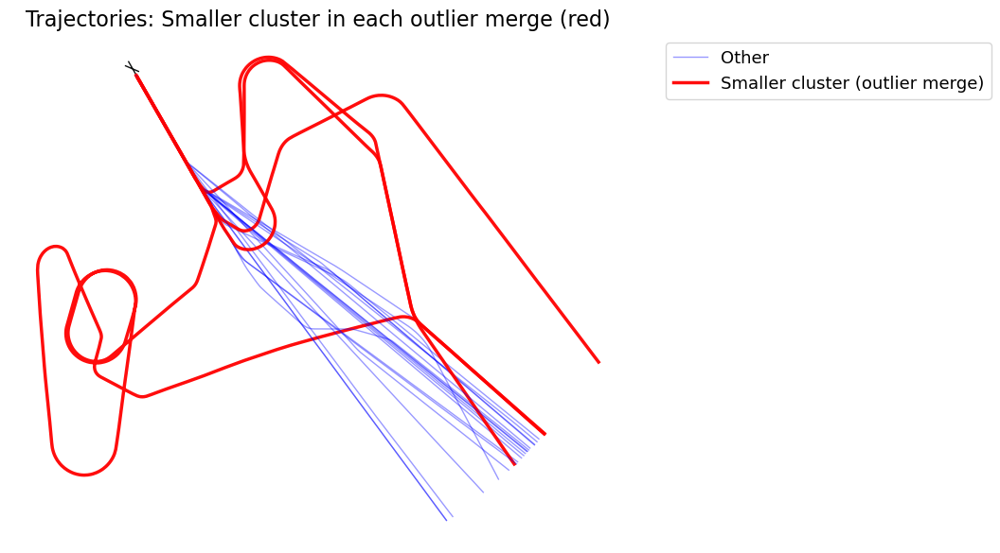

In [123]:
import matplotlib.pyplot as plt

# Helper to recursively get all sample indices under a cluster
def get_sample_indices(cluster_idx, linkage, n_samples):
    if cluster_idx < n_samples:
        return [cluster_idx]
    else:
        left = int(linkage[cluster_idx - n_samples][0])
        right = int(linkage[cluster_idx - n_samples][1])
        return get_sample_indices(left, linkage, n_samples) + get_sample_indices(right, linkage, n_samples)

n_samples = len(heading_series)

# For each outlier merge, find the smaller cluster and collect its sample indices
red_indices = set()
for idx in outlier_merges:
    left = int(linkage[idx][0])
    right = int(linkage[idx][1])
    left_samples = get_sample_indices(left, linkage, n_samples)
    right_samples = get_sample_indices(right, linkage, n_samples)
    # Mark the smaller cluster in red
    if len(left_samples) <= len(right_samples):
        red_indices.update(left_samples)
    else:
        red_indices.update(right_samples)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for i, flight in enumerate(fdb1829_runway33_m1_traffic):
        if i in red_indices:
            flight.plot(ax, linewidth=2.5, color="red", alpha=0.95, label="Smaller cluster (outlier merge)" if i == list(red_indices)[0] else None)
        else:
            flight.plot(ax, linewidth=1, color="blue", alpha=0.4, label="Other" if i == 0 else None)

    ax.set_title("Trajectories: Smaller cluster in each outlier merge (red)")
    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

In [115]:
model3.linkage

[(21, 6, np.float64(5.019378366434838), 0),
 (20, 13, np.float64(5.760292651759472), 0),
 (18, 4, np.float64(5.815548133337967), 0),
 (25, 7, np.float64(6.548552618491322), 0),
 (10, 3, np.float64(6.991212689112332), 0),
 (8, 27, np.float64(7.853218985481439), 0),
 (22, 29, np.float64(8.965752952612549), 0),
 (30, 28, np.float64(10.994001171178208), 0),
 (16, 24, np.float64(12.301645101746582), 0),
 (2, 1, np.float64(22.81014953342312), 0),
 (14, 11, np.float64(23.70734913934607), 0),
 (17, 31, np.float64(28.66332566324087), 0),
 (34, 33, np.float64(63.79147285996767), 0),
 (26, 35, np.float64(78.9328696935446), 0),
 (9, 32, np.float64(146.03818986036225), 0),
 (37, 36, np.float64(155.56961707939996), 0),
 (39, 0, np.float64(255.92151452703956), 0),
 (38, 40, np.float64(319.3047279088995), 0),
 (23, 15, np.float64(322.79709781196755), 0),
 (19, 42, np.float64(382.52498535395756), 0),
 (12, 41, np.float64(402.42333866141166), 0),
 (43, 44, np.float64(1565.6908207018032), 0),
 (5, 45, np

In [124]:
linkage = model3.linkage

# Extract the third element (distance) from each tuple
distances = np.array([row[2] for row in linkage])

# Use IQR to find outlier merges
Q1 = np.percentile(distances, 25)
Q3 = np.percentile(distances, 75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR

# Find merges above the upper bound
outlier_merges = np.where(distances > upper_bound)[0]

print(f"Upper bound for outlier merges: {upper_bound:.2f}")
print(f"Indices of outlier merges: {outlier_merges}")

# Show which samples are involved in these merges
for idx in outlier_merges:
    left = linkage[idx][0]
    right = linkage[idx][1]
    dist = linkage[idx][2]
    print(f"Merge at distance {dist:.2f}: clusters {left} and {right}")

Upper bound for outlier merges: 706.42
Indices of outlier merges: [21 22]
Merge at distance 1565.69: clusters 43 and 44
Merge at distance 33118.47: clusters 5 and 45


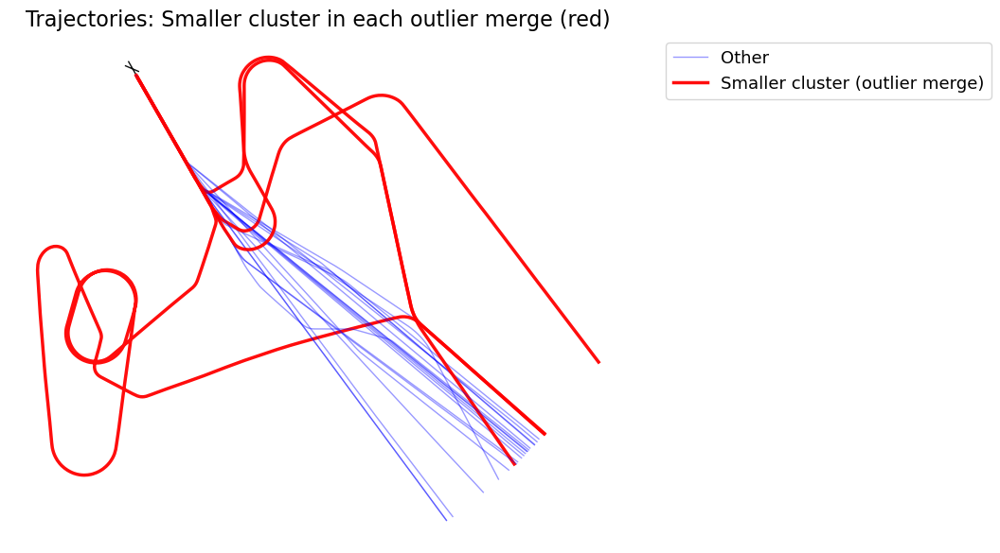

In [125]:
import matplotlib.pyplot as plt

# Helper to recursively get all sample indices under a cluster
def get_sample_indices(cluster_idx, linkage, n_samples):
    if cluster_idx < n_samples:
        return [cluster_idx]
    else:
        left = int(linkage[cluster_idx - n_samples][0])
        right = int(linkage[cluster_idx - n_samples][1])
        return get_sample_indices(left, linkage, n_samples) + get_sample_indices(right, linkage, n_samples)

n_samples = len(heading_series)

# For each outlier merge, find the smaller cluster and collect its sample indices
red_indices = set()
for idx in outlier_merges:
    left = int(linkage[idx][0])
    right = int(linkage[idx][1])
    left_samples = get_sample_indices(left, linkage, n_samples)
    right_samples = get_sample_indices(right, linkage, n_samples)
    # Mark the smaller cluster in red
    if len(left_samples) <= len(right_samples):
        red_indices.update(left_samples)
    else:
        red_indices.update(right_samples)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for i, flight in enumerate(fdb1829_runway33_m1_traffic):
        if i in red_indices:
            flight.plot(ax, linewidth=2.5, color="red", alpha=0.95, label="Smaller cluster (outlier merge)" if i == list(red_indices)[0] else None)
        else:
            flight.plot(ax, linewidth=1, color="blue", alpha=0.4, label="Other" if i == 0 else None)

    ax.set_title("Trajectories: Smaller cluster in each outlier merge (red)")
    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    ax.legend(unique.values(), unique.keys(), bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

### K-Nearest Neighbors Outlier Detection (kNNO)

In [138]:
from anomatools.models import kNNO

# Prepare time series data: for example, use altitude profiles (all must be same length)
# Here, we resample all altitude series to the same length for DTW-based kNNO
from scipy.interpolate import interp1d

def resample_series(series, target_len=100):
    """Resample a 1D array to target_len points."""
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, kind="linear", fill_value="extrapolate")
    return f(x_new)

# Build matrix: each row is a resampled altitude profile
target_len = 100
X = []
icao24_list = []
for flight in fdb1829_runway33_m1_traffic:
    alt = flight.data.altitude.values
    if len(alt) < 2:
        continue  # skip too short
    X.append(resample_series(alt, target_len))
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list.append((flight.icao24, date_str))
X = np.array(X)

# Fit kNNO with DTW metric
model = kNNO(metric="dtw")
labels = model.fit_predict(X)  # 1=outlier, 0=inlier
scores = model.predict_proba(X)[:, 1]  # anomaly probability

# Collect results in a DataFrame
knno_dtw_df = pd.DataFrame({
    "icao24_date": icao24_list,
    "score": scores,
    "outlier": labels
})

# Show detected outliers
outliers = knno_dtw_df[knno_dtw_df["outlier"] == 1]
print("Detected outliers by kNNO (DTW):")
print(outliers)
outliers

Detected outliers by kNNO (DTW):
             icao24_date     score  outlier
19  (89656a, 20-01-2022)  0.582316        1
21  (89656c, 15-01-2022)  0.987935        1


,icao24_date,score,outlier
19,"(89656a, 20-01-2022)",0.582316,1
21,"(89656c, 15-01-2022)",0.987935,1


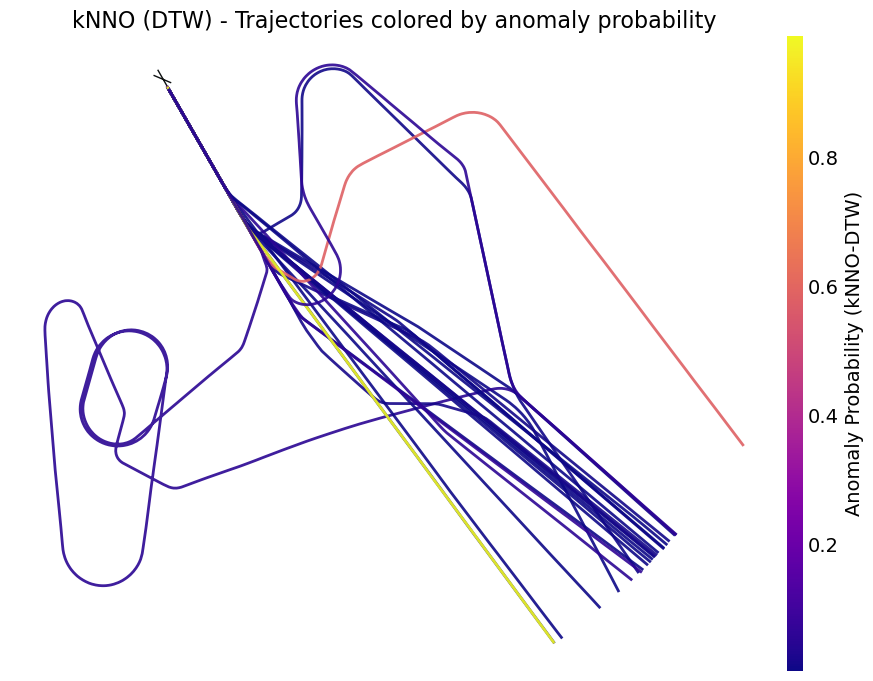

In [145]:
import matplotlib as mpl

# Normalize scores for colormap
norm = mpl.colors.Normalize(vmin=knno_dtw_df["score"].min(), vmax=knno_dtw_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_df["icao24_date"], knno_dtw_df["score"]))

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        color = cmap(norm(score))
        flight.plot(ax, linewidth=2, color=color, alpha=0.9)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability")
    plt.tight_layout()
    plt.show()

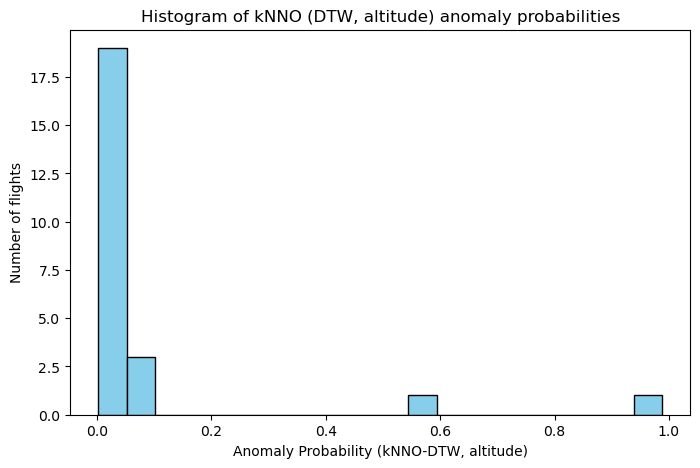

In [157]:
plt.figure(figsize=(8, 5))
plt.hist(knno_dtw_df["score"], bins=20, color="skyblue", edgecolor="black")
plt.xlabel("Anomaly Probability (kNNO-DTW, altitude)")
plt.ylabel("Number of flights")
plt.title("Histogram of kNNO (DTW, altitude) anomaly probabilities")
plt.show()

In [151]:
from anomatools.models import kNNO
from scipy.interpolate import interp1d

def resample_xy(series, target_len=100):
    """Resample a 2D array to target_len points along the first axis."""
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, axis=0, kind="linear", fill_value="extrapolate")
    return f(x_new)

# Build matrix: each row is a resampled 2D trajectory (x, y)
target_len = 100
X2d = []
icao24_list_2d = []
for flight in fdb1829_runway33_m1_traffic:
    df = flight.data
    if len(df) < 2:
        continue
    xy = np.column_stack([df.x, df.y])
    X2d.append(resample_xy(xy, target_len))
    date_str = df.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_2d.append((flight.icao24, date_str))
X2d = np.array(X2d)
X2d = X2d.reshape(X2d.shape[0], -1)

# Fit kNNO with DTW metric for 2D
model_2d = kNNO(metric="dtw")
labels_2d = model_2d.fit_predict(X2d)
scores_2d = model_2d.predict_proba(X2d)[:, 1]

# Collect results in a DataFrame
knno_dtw2d_df = pd.DataFrame({
    "icao24_date": icao24_list_2d,
    "score": scores_2d,
    "outlier": labels_2d
})

# Show detected outliers
outliers_2d = knno_dtw2d_df[knno_dtw2d_df["outlier"] == 1]
print("Detected outliers by kNNO (DTW, 2D):")
print(outliers_2d)
outliers_2d

Detected outliers by kNNO (DTW, 2D):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  0.829814        1
19  (89656a, 20-01-2022)  0.519365        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",0.829814,1
19,"(89656a, 20-01-2022)",0.519365,1


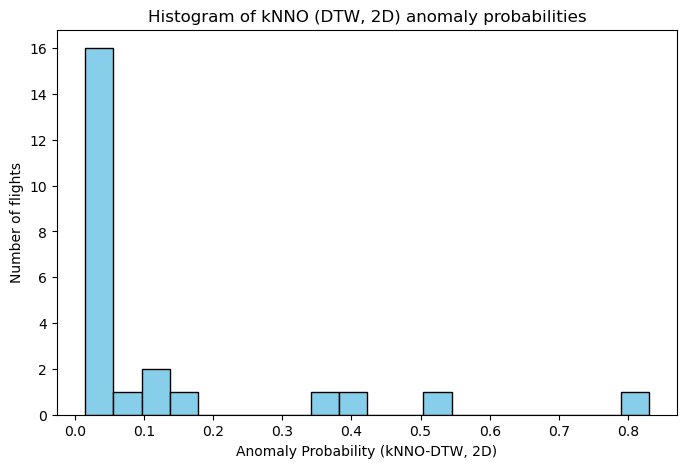

In [156]:
plt.figure(figsize=(8, 5))
plt.hist(knno_dtw2d_df["score"], bins=20, color="skyblue", edgecolor="black")
plt.xlabel("Anomaly Probability (kNNO-DTW, 2D)")
plt.ylabel("Number of flights")
plt.title("Histogram of kNNO (DTW, 2D) anomaly probabilities")
plt.show()

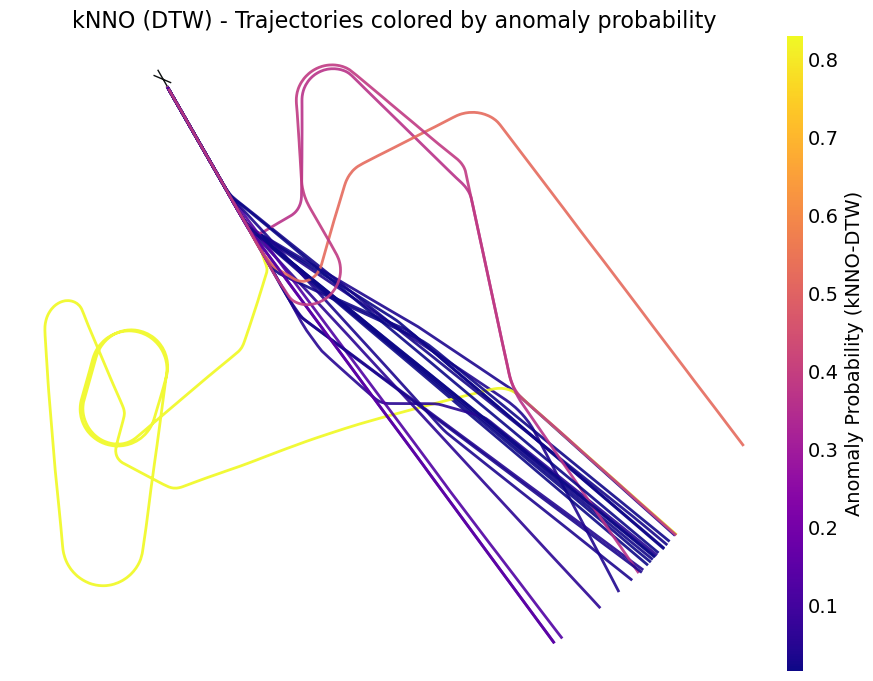

In [152]:
norm = mpl.colors.Normalize(vmin=knno_dtw2d_df["score"].min(), vmax=knno_dtw2d_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw2d_df["icao24_date"], knno_dtw2d_df["score"]))

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        color = cmap(norm(score))
        flight.plot(ax, linewidth=2, color=color, alpha=0.9)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability")
    plt.tight_layout()
    plt.show()

In [153]:
from anomatools.models import kNNO
from scipy.interpolate import interp1d

def resample_xyz(series, target_len=100):
    """Resample a 3D array (x, y, altitude) to target_len points along the first axis."""
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, axis=0, kind="linear", fill_value="extrapolate")
    return f(x_new)

# Build matrix: each row is a resampled 3D trajectory (x, y, altitude)
target_len = 100
X3d = []
icao24_list_3d = []
for flight in fdb1829_runway33_m1_traffic:
    df = flight.data
    if len(df) < 2:
        continue
    xyz = np.column_stack([df.x, df.y, df.altitude])
    X3d.append(resample_xyz(xyz, target_len))
    date_str = df.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_3d.append((flight.icao24, date_str))
X3d = np.array(X3d)
X3d = X3d.reshape(X3d.shape[0], -1)  # Flatten to (n_samples, target_len*3)

# Fit kNNO with DTW metric for 3D
model_3d = kNNO(metric="dtw")
labels_3d = model_3d.fit_predict(X3d)
scores_3d = model_3d.predict_proba(X3d)[:, 1]

# Collect results in a DataFrame
knno_dtw3d_df = pd.DataFrame({
    "icao24_date": icao24_list_3d,
    "score": scores_3d,
    "outlier": labels_3d
})

# Show detected outliers
outliers_3d = knno_dtw3d_df[knno_dtw3d_df["outlier"] == 1]
print("Detected outliers by kNNO (DTW, 3D):")
print(outliers_3d)
outliers_3d

Detected outliers by kNNO (DTW, 3D):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  0.821108        1
19  (89656a, 20-01-2022)  0.516909        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",0.821108,1
19,"(89656a, 20-01-2022)",0.516909,1


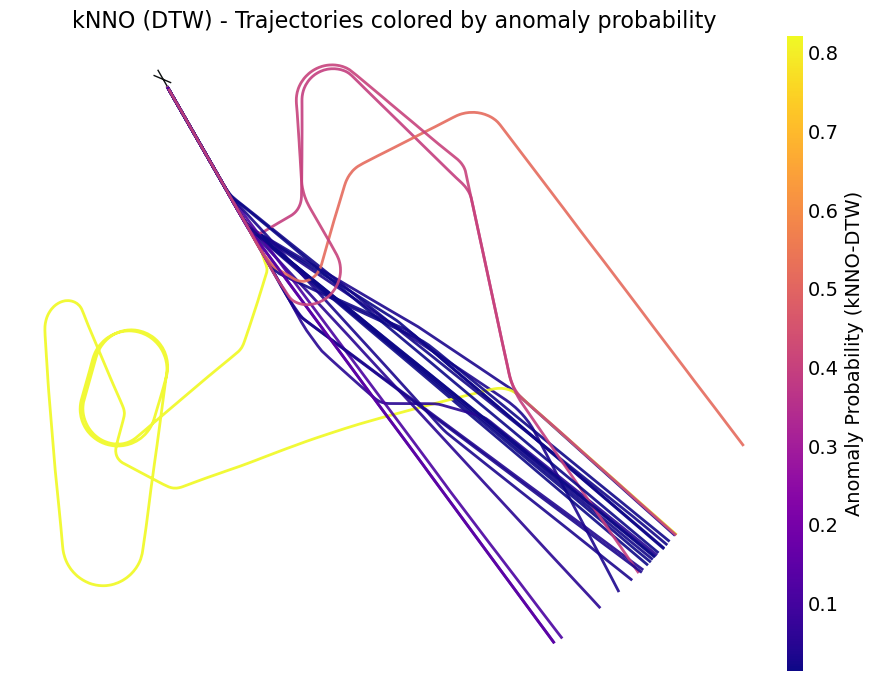

In [154]:
norm = mpl.colors.Normalize(vmin=knno_dtw3d_df["score"].min(), vmax=knno_dtw3d_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw3d_df["icao24_date"], knno_dtw3d_df["score"]))

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        color = cmap(norm(score))
        flight.plot(ax, linewidth=2, color=color, alpha=0.9)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability")
    plt.tight_layout()
    plt.show()

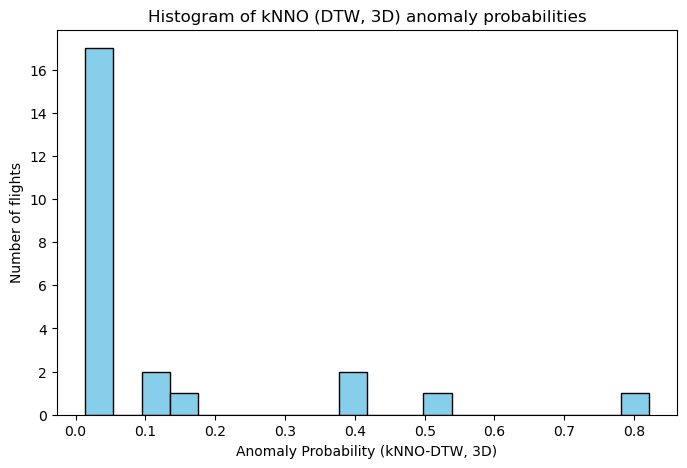

In [155]:
plt.figure(figsize=(8, 5))
plt.hist(knno_dtw3d_df["score"], bins=20, color="skyblue", edgecolor="black")
plt.xlabel("Anomaly Probability (kNNO-DTW, 3D)")
plt.ylabel("Number of flights")
plt.title("Histogram of kNNO (DTW, 3D) anomaly probabilities")
plt.show()

In [158]:
fdb1829_runway33_m1_traffic.data.head()

,timestamp,callsign,icao24,latitude,longitude,altitude,track,groundspeed,vertical_rate,quarter,month,day,hour,weekday,registration,typecode,x,y,track_unwrapped
0,2022-01-19 19:43:24+00:00,FDB1829,896378,51.477127,21.891595,5295.819671,334.538196,179.489024,-9.753599,1,1,19,19,2,A6-FEG,B738,39880.565358,-43387.682776,334.538196
1,2022-01-19 19:43:25+00:00,FDB1829,896378,51.478729,21.890407,5295.743148,334.539308,179.492409,-9.628698,1,1,19,19,2,A6-FEG,B738,39796.651468,-43210.084855,334.539308
2,2022-01-19 19:43:26+00:00,FDB1829,896378,51.480194,21.889294,5295.669939,334.563539,179.575630,-9.563380,1,1,19,19,2,A6-FEG,B738,39718.019908,-43047.723396,334.563539
3,2022-01-19 19:43:27+00:00,FDB1829,896378,51.481515,21.888275,5295.600427,334.578984,179.627915,-9.523062,1,1,19,19,2,A6-FEG,B738,39646.107949,-42901.364304,334.578984
4,2022-01-19 19:43:28+00:00,FDB1829,896378,51.483124,21.887067,5295.535051,334.632213,179.664834,-9.496089,1,1,19,19,2,A6-FEG,B738,39560.771691,-42722.996765,334.632213


In [159]:
from anomatools.models import kNNO
from scipy.interpolate import interp1d

# Resample 1D track (heading) series to fixed length
def resample_track(series, target_len=100):
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, kind="linear", fill_value="extrapolate")
    return f(x_new)

target_len = 100
X_track = []
icao24_list_track = []
for flight in fdb1829_runway33_m1_traffic:
    track = flight.data.track_unwrapped.values if "track_unwrapped" in flight.data else flight.data.track.values
    if len(track) < 2:
        continue
    X_track.append(resample_track(track, target_len))
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_track.append((flight.icao24, date_str))
X_track = np.array(X_track)

# Fit kNNO with DTW metric for track
model_track = kNNO(metric="dtw")
labels_track = model_track.fit_predict(X_track)
scores_track = model_track.predict_proba(X_track)[:, 1]

# Collect results in a DataFrame
knno_dtw_track_df = pd.DataFrame({
    "icao24_date": icao24_list_track,
    "score": scores_track,
    "outlier": labels_track
})

# Show detected outliers
outliers_track = knno_dtw_track_df[knno_dtw_track_df["outlier"] == 1]
print("Detected outliers by kNNO (DTW, track):")
print(outliers_track)
outliers_track

Detected outliers by kNNO (DTW, track):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  1.000000        1
23  (8965b2, 28-01-2022)  0.518569        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",1.000000,1
23,"(8965b2, 28-01-2022)",0.518569,1


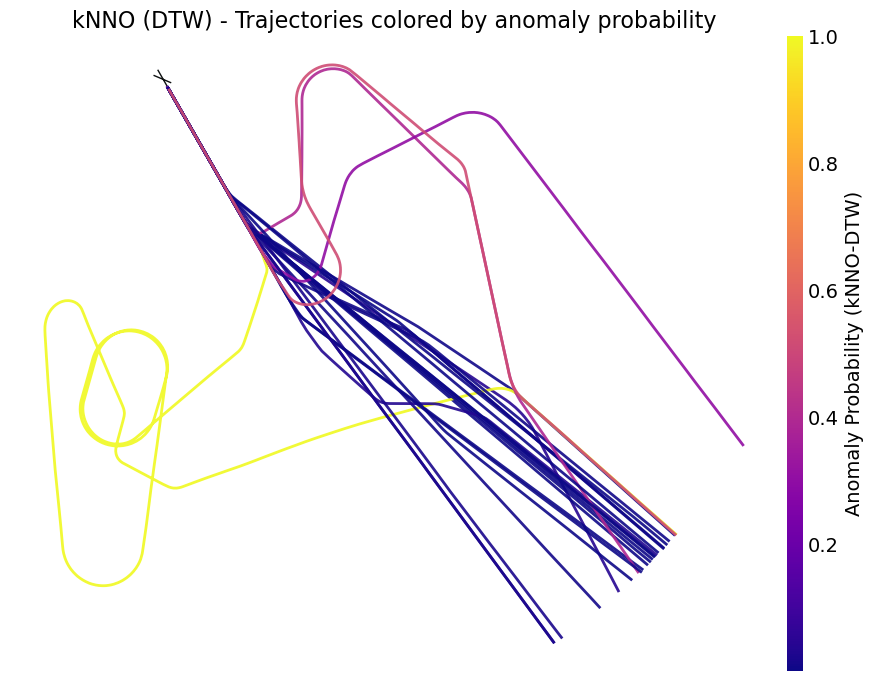

In [160]:
norm = mpl.colors.Normalize(vmin=knno_dtw_track_df["score"].min(), vmax=knno_dtw_track_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_track_df["icao24_date"], knno_dtw_track_df["score"]))

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        color = cmap(norm(score))
        flight.plot(ax, linewidth=2, color=color, alpha=0.9)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability")
    plt.tight_layout()
    plt.show()

In [161]:
from anomatools.models import kNNO
from scipy.interpolate import interp1d

# Resample 1D groundspeed series to fixed length
def resample_groundspeed(series, target_len=100):
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, kind="linear", fill_value="extrapolate")
    return f(x_new)

target_len = 100
X_gs = []
icao24_list_gs = []
for flight in fdb1829_runway33_m1_traffic:
    gs = flight.data.groundspeed.values
    if len(gs) < 2:
        continue
    X_gs.append(resample_groundspeed(gs, target_len))
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_gs.append((flight.icao24, date_str))
X_gs = np.array(X_gs)

# Fit kNNO with DTW metric for groundspeed
model_gs = kNNO(metric="dtw")
labels_gs = model_gs.fit_predict(X_gs)
scores_gs = model_gs.predict_proba(X_gs)[:, 1]

# Collect results in a DataFrame
knno_dtw_gs_df = pd.DataFrame({
    "icao24_date": icao24_list_gs,
    "score": scores_gs,
    "outlier": labels_gs
})

# Show detected outliers
outliers_gs = knno_dtw_gs_df[knno_dtw_gs_df["outlier"] == 1]
print("Detected outliers by kNNO (DTW, groundspeed):")
print(outliers_gs)
outliers_gs

Detected outliers by kNNO (DTW, groundspeed):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  0.852813        1
18  (896533, 14-01-2022)  0.532723        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",0.852813,1
18,"(896533, 14-01-2022)",0.532723,1


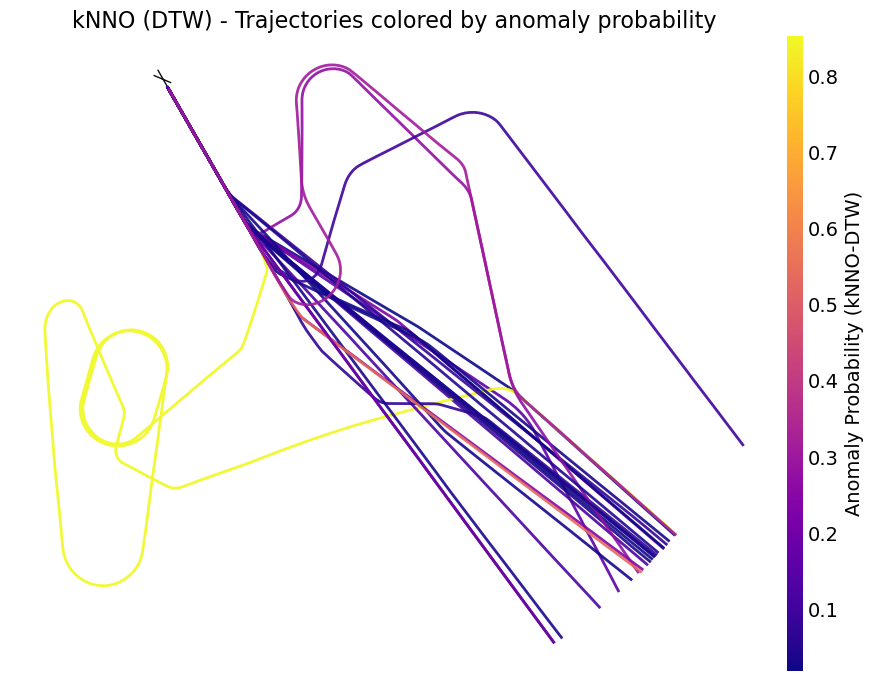

In [162]:
norm = mpl.colors.Normalize(vmin=knno_dtw_gs_df["score"].min(), vmax=knno_dtw_gs_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_gs_df["icao24_date"], knno_dtw_gs_df["score"]))

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        color = cmap(norm(score))
        flight.plot(ax, linewidth=2, color=color, alpha=0.9)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability")
    plt.tight_layout()
    plt.show()

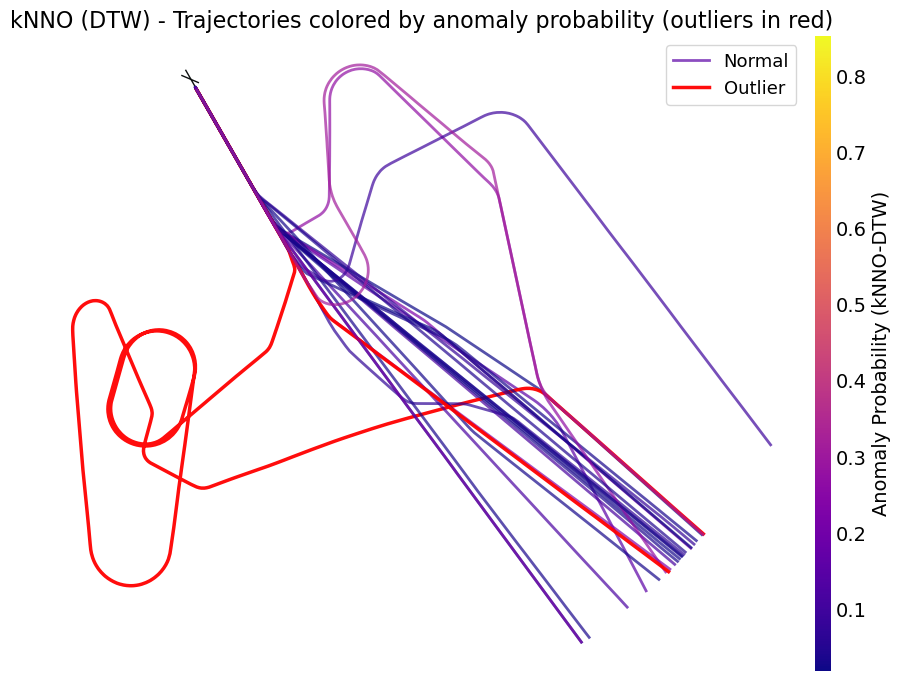

In [174]:
import matplotlib as mpl

norm = mpl.colors.Normalize(vmin=knno_dtw_gs_df["score"].min(), vmax=knno_dtw_gs_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_gs_df["icao24_date"], knno_dtw_gs_df["score"]))
outlier_keys = set(knno_dtw_gs_df[knno_dtw_gs_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        if key in outlier_keys:
            flight.plot(ax, linewidth=2.5, color="red", alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            color = cmap(norm(score))
            flight.plot(ax, linewidth=2, color=color, alpha=0.7, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability (outliers in red)")
    ax.legend()
    plt.tight_layout()
    plt.show()

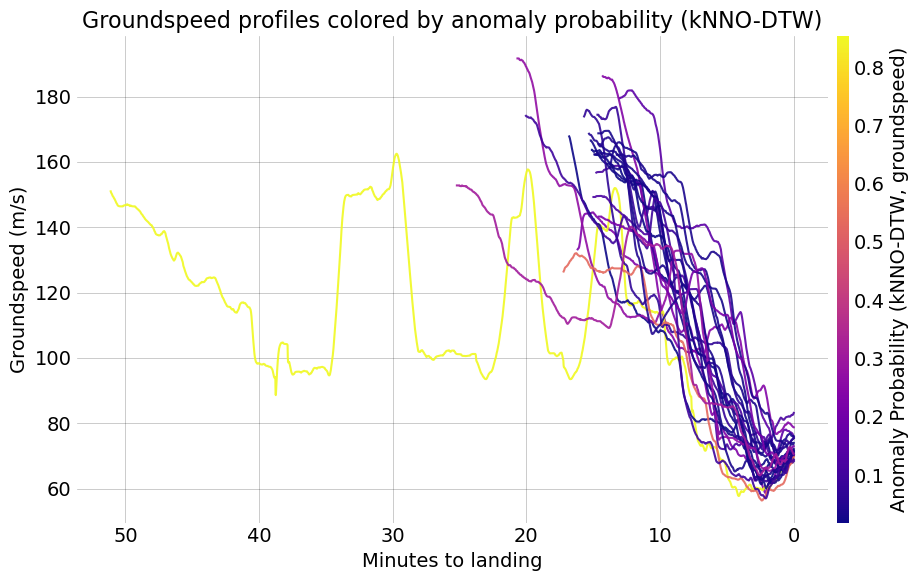

In [167]:
import matplotlib as mpl

# Normalize scores for colormap
norm = mpl.colors.Normalize(vmin=knno_dtw_gs_df["score"].min(), vmax=knno_dtw_gs_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_gs_df["icao24_date"], knno_dtw_gs_df["score"]))

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))
    # Plot each flight's groundspeed profile colored by anomaly probability
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        color = cmap(norm(score))
        df = flight.data
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        ax.plot(time_to_end, df.groundspeed.values, color=color, alpha=0.9)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW, groundspeed)")
    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Groundspeed (m/s)")
    ax.set_title("Groundspeed profiles colored by anomaly probability (kNNO-DTW)")
    ax.invert_xaxis()
    plt.tight_layout()
    plt.show()

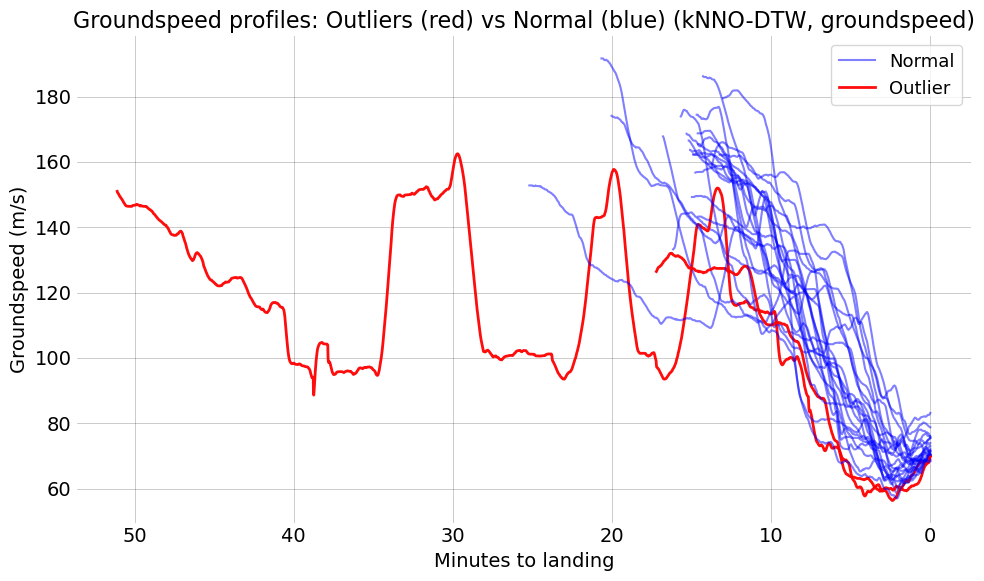

In [170]:
import matplotlib as mpl

# Prepare set of outlier keys (icao24, date) for groundspeed kNNO-DTW
outlier_keys = set(knno_dtw_gs_df[knno_dtw_gs_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))
    # Plot each flight's groundspeed profile, outliers in red, others in blue
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        df = flight.data
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        if key in outlier_keys:
            ax.plot(time_to_end, df.groundspeed.values, color="red", linewidth=2, alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            ax.plot(time_to_end, df.groundspeed.values, color="blue", alpha=0.5, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)
    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Groundspeed (m/s)")
    ax.set_title("Groundspeed profiles: Outliers (red) vs Normal (blue) (kNNO-DTW, groundspeed)")
    ax.invert_xaxis()
    ax.legend()
    plt.tight_layout()
    plt.show()

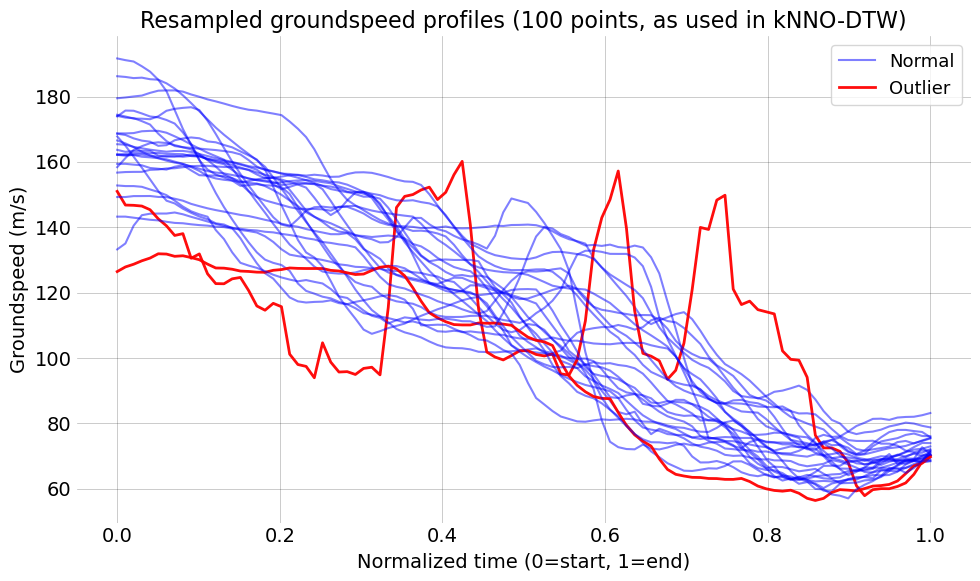

In [171]:
# Plot the resampled groundspeed time series (100 points) as used in the kNNO model

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Prepare outlier keys for highlighting
    outlier_keys = set(knno_dtw_gs_df[knno_dtw_gs_df["outlier"] == 1]["icao24_date"])

    for i, (gs_resampled, key) in enumerate(zip(X_gs, icao24_list_gs)):
        if key in outlier_keys:
            ax.plot(np.linspace(0, 1, len(gs_resampled)), gs_resampled, color="red", linewidth=2, alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            ax.plot(np.linspace(0, 1, len(gs_resampled)), gs_resampled, color="blue", alpha=0.5, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)

    ax.set_xlabel("Normalized time (0=start, 1=end)")
    ax.set_ylabel("Groundspeed (m/s)")
    ax.set_title("Resampled groundspeed profiles (100 points, as used in kNNO-DTW)")
    ax.legend()
    plt.tight_layout()
    plt.show()

### Vertical rate

In [176]:
def resample_vertical_rate(series, target_len=100):
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, kind="linear", fill_value="extrapolate")
    return f(x_new)

target_len = 100
X_vr = []
icao24_list_vr = []
for flight in fdb1829_runway33_m1_traffic:
    vr = flight.data.vertical_rate.values
    if len(vr) < 2:
        continue
    X_vr.append(resample_vertical_rate(vr, target_len))
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_vr.append((flight.icao24, date_str))
X_vr = np.array(X_vr)

# Fit kNNO with DTW metric for vertical_rate
model_vr = kNNO(metric="dtw")
labels_vr = model_vr.fit_predict(X_vr)
scores_vr = model_vr.predict_proba(X_vr)[:, 1]

# Collect results in a DataFrame
knno_dtw_vr_df = pd.DataFrame({
    "icao24_date": icao24_list_vr,
    "score": scores_vr,
    "outlier": labels_vr
})

# Show detected outliers
outliers_vr = knno_dtw_vr_df[knno_dtw_vr_df["outlier"] == 1]
print("Detected outliers by kNNO (DTW, vertical_rate):")
print(outliers_vr)
outliers_vr

Detected outliers by kNNO (DTW, vertical_rate):
            icao24_date     score  outlier
5  (8964d3, 30-01-2022)  0.507850        1
8  (896517, 25-01-2022)  0.550355        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",0.507850,1
8,"(896517, 25-01-2022)",0.550355,1


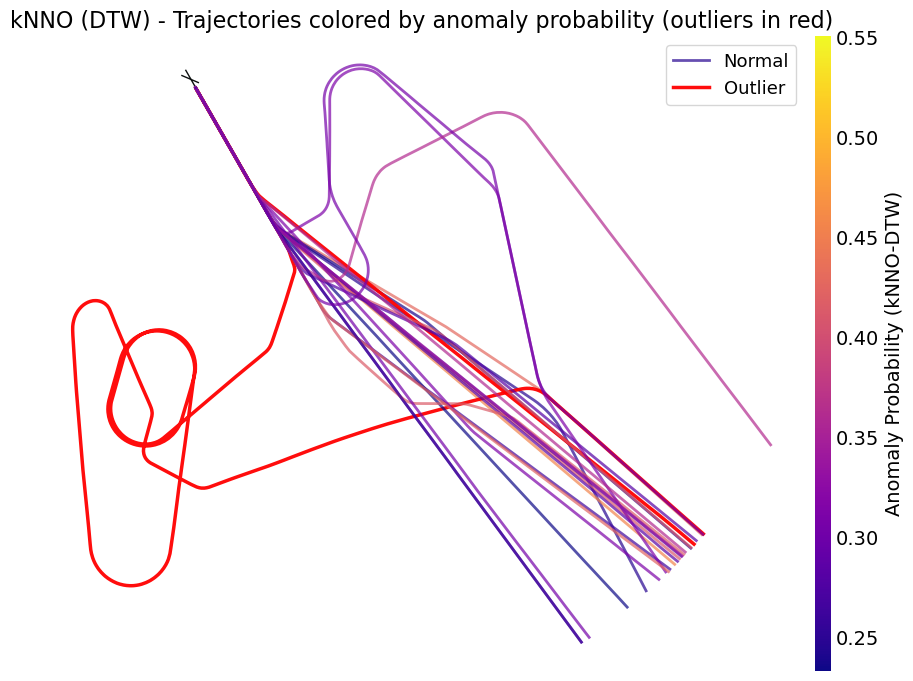

In [177]:
norm = mpl.colors.Normalize(vmin=knno_dtw_vr_df["score"].min(), vmax=knno_dtw_vr_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_vr_df["icao24_date"], knno_dtw_vr_df["score"]))
outlier_keys = set(knno_dtw_vr_df[knno_dtw_vr_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        if key in outlier_keys:
            flight.plot(ax, linewidth=2.5, color="red", alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            color = cmap(norm(score))
            flight.plot(ax, linewidth=2, color=color, alpha=0.7, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability (outliers in red)")
    ax.legend()
    plt.tight_layout()
    plt.show()

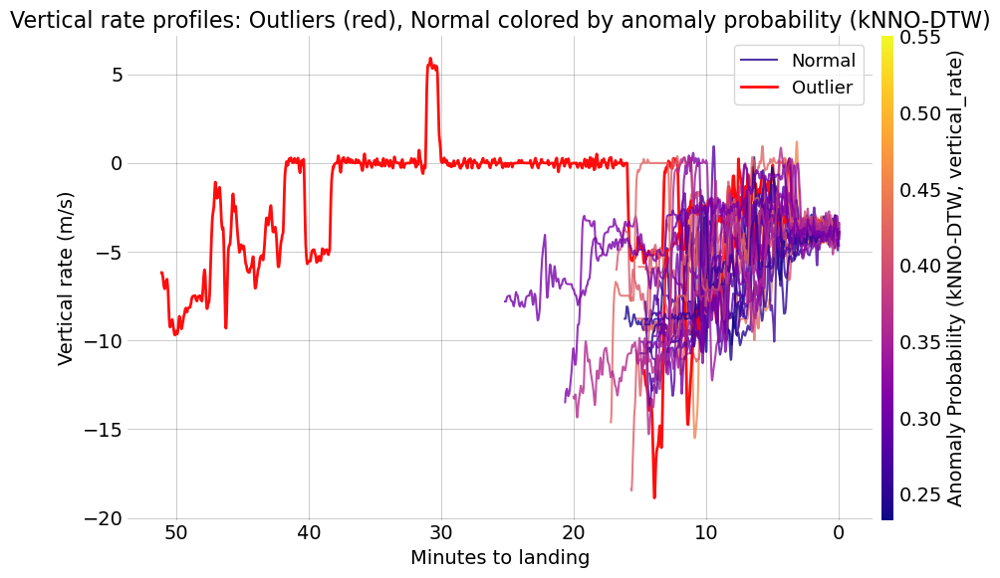

In [180]:
import matplotlib as mpl

# Normalize scores for colormap
norm = mpl.colors.Normalize(vmin=knno_dtw_vr_df["score"].min(), vmax=knno_dtw_vr_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_vr_df["icao24_date"], knno_dtw_vr_df["score"]))
outlier_keys = set(knno_dtw_vr_df[knno_dtw_vr_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        df = flight.data
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        if key in outlier_keys:
            ax.plot(time_to_end, df.vertical_rate.values, color="red", linewidth=2, alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            score = score_dict.get(key, 0)
            color = cmap(norm(score))
            ax.plot(time_to_end, df.vertical_rate.values, color=color, alpha=0.8, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW, vertical_rate)")
    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Vertical rate (m/s)")
    ax.set_title("Vertical rate profiles: Outliers (red), Normal colored by anomaly probability (kNNO-DTW)")
    ax.invert_xaxis()
    ax.legend()
    plt.tight_layout()
    plt.show()

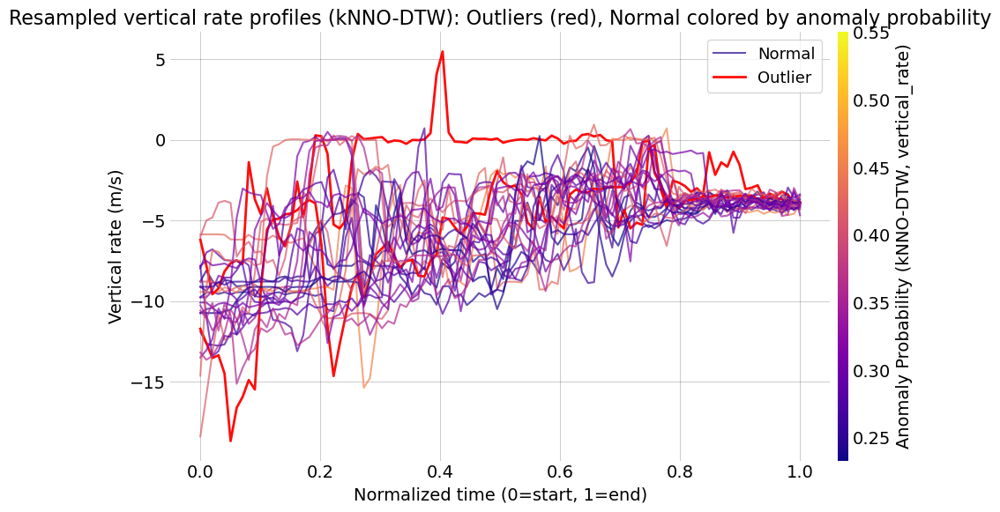

In [181]:
import matplotlib as mpl

# Prepare outlier keys for resampled vertical rate kNNO-DTW
outlier_keys = set(knno_dtw_vr_df[knno_dtw_vr_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))
    for vr_resampled, key in zip(X_vr, icao24_list_vr):
        if key in outlier_keys:
            ax.plot(
                np.linspace(0, 1, len(vr_resampled)),
                vr_resampled,
                color="red",
                linewidth=2,
                alpha=0.95,
                label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None,
            )
        else:
            score = knno_dtw_vr_df.loc[knno_dtw_vr_df["icao24_date"] == key, "score"].values[0]
            color = plt.cm.plasma(
                (score - knno_dtw_vr_df["score"].min()) / (knno_dtw_vr_df["score"].max() - knno_dtw_vr_df["score"].min())
            )
            ax.plot(
                np.linspace(0, 1, len(vr_resampled)),
                vr_resampled,
                color=color,
                alpha=0.7,
                label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None,
            )
    sm = plt.cm.ScalarMappable(
        cmap=plt.cm.plasma,
        norm=mpl.colors.Normalize(vmin=knno_dtw_vr_df["score"].min(), vmax=knno_dtw_vr_df["score"].max()),
    )
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW, vertical_rate)")
    ax.set_xlabel("Normalized time (0=start, 1=end)")
    ax.set_ylabel("Vertical rate (m/s)")
    ax.set_title("Resampled vertical rate profiles (kNNO-DTW): Outliers (red), Normal colored by anomaly probability")
    ax.legend()
    plt.tight_layout()
    plt.show()

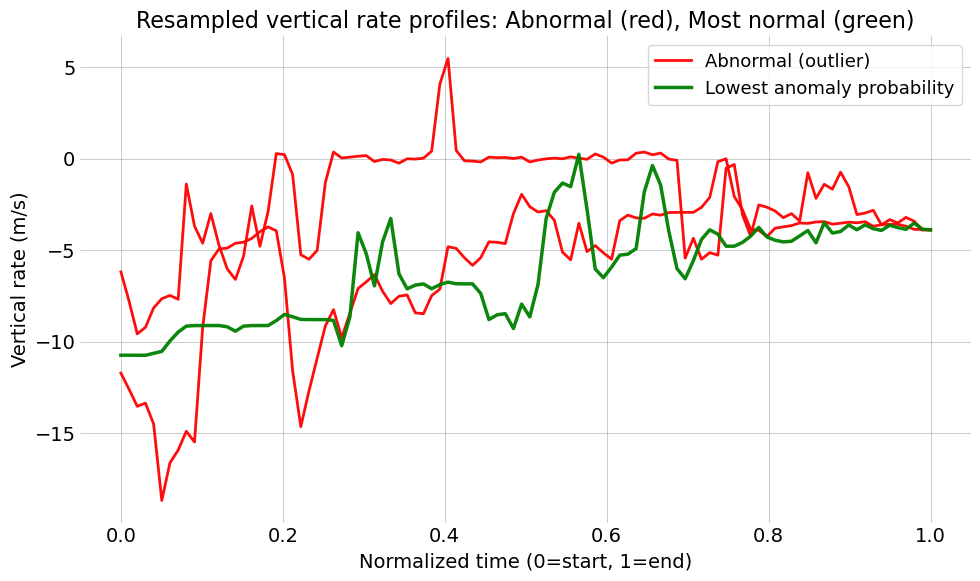

In [182]:
import matplotlib as mpl

# Find keys for abnormal (outlier) resampled vertical rate profiles
outlier_keys = set(knno_dtw_vr_df[knno_dtw_vr_df["outlier"] == 1]["icao24_date"])

# Find the key with the lowest anomaly probability (i.e., most normal)
min_prob_idx = knno_dtw_vr_df["score"].idxmin()
min_prob_key = knno_dtw_vr_df.loc[min_prob_idx, "icao24_date"]

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))
    # Plot all abnormal (outlier) profiles in red
    for vr_resampled, key in zip(X_vr, icao24_list_vr):
        if key in outlier_keys:
            ax.plot(
                np.linspace(0, 1, len(vr_resampled)),
                vr_resampled,
                color="red",
                linewidth=2,
                alpha=0.95,
                label="Abnormal (outlier)" if "Abnormal (outlier)" not in ax.get_legend_handles_labels()[1] else None,
            )
    # Plot the most normal (lowest probability) profile in green
    for vr_resampled, key in zip(X_vr, icao24_list_vr):
        if key == min_prob_key:
            ax.plot(
                np.linspace(0, 1, len(vr_resampled)),
                vr_resampled,
                color="green",
                linewidth=2.5,
                alpha=0.95,
                label="Lowest anomaly probability",
            )
            break  # Only one

    ax.set_xlabel("Normalized time (0=start, 1=end)")
    ax.set_ylabel("Vertical rate (m/s)")
    ax.set_title("Resampled vertical rate profiles: Abnormal (red), Most normal (green)")
    ax.legend()
    plt.tight_layout()
    plt.show()

### Heading

In [183]:
def resample_heading(series, target_len=100):
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, kind="linear", fill_value="extrapolate")
    return f(x_new)

target_len = 100
X_heading = []
icao24_list_heading = []
for flight in fdb1829_runway33_m1_traffic:
    heading = flight.data.track_unwrapped.values if "track_unwrapped" in flight.data else flight.data.track.values
    if len(heading) < 2:
        continue
    X_heading.append(resample_heading(heading, target_len))
    date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_heading.append((flight.icao24, date_str))
X_heading = np.array(X_heading)

# Fit kNNO with DTW metric for heading
model_heading = kNNO(metric="dtw")
labels_heading = model_heading.fit_predict(X_heading)
scores_heading = model_heading.predict_proba(X_heading)[:, 1]

# Collect results in a DataFrame
knno_dtw_heading_df = pd.DataFrame({
    "icao24_date": icao24_list_heading,
    "score": scores_heading,
    "outlier": labels_heading
})

# Show detected outliers
outliers_heading = knno_dtw_heading_df[knno_dtw_heading_df["outlier"] == 1]
print("Detected outliers by kNNO (DTW, heading):")
print(outliers_heading)
outliers_heading

Detected outliers by kNNO (DTW, heading):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  1.000000        1
23  (8965b2, 28-01-2022)  0.518569        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",1.000000,1
23,"(8965b2, 28-01-2022)",0.518569,1


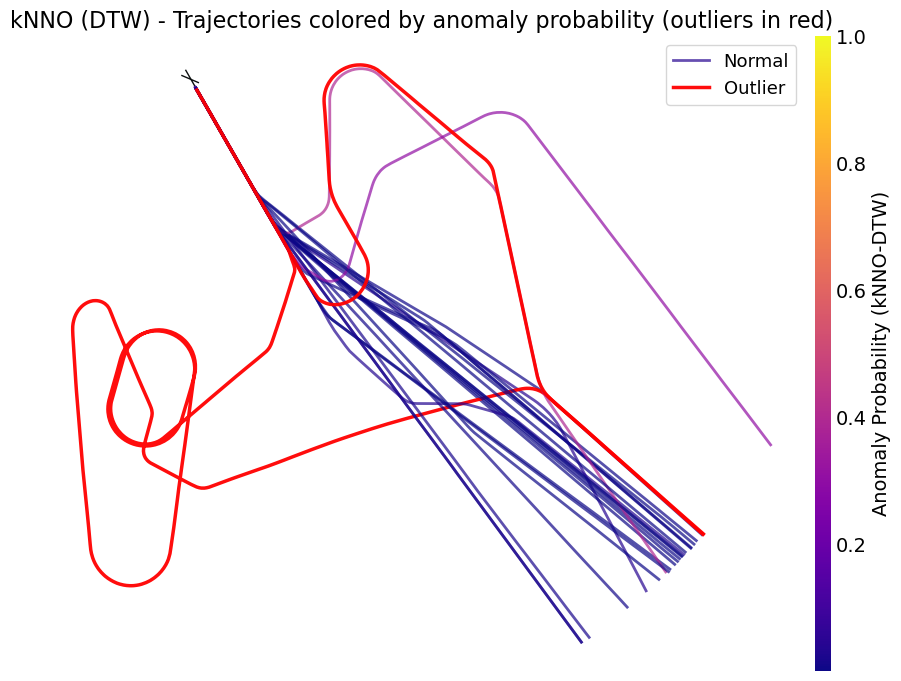

In [184]:
norm = mpl.colors.Normalize(vmin=knno_dtw_heading_df["score"].min(), vmax=knno_dtw_heading_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_heading_df["icao24_date"], knno_dtw_heading_df["score"]))
outlier_keys = set(knno_dtw_heading_df[knno_dtw_heading_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        if key in outlier_keys:
            flight.plot(ax, linewidth=2.5, color="red", alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            color = cmap(norm(score))
            flight.plot(ax, linewidth=2, color=color, alpha=0.7, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability (outliers in red)")
    ax.legend()
    plt.tight_layout()
    plt.show()

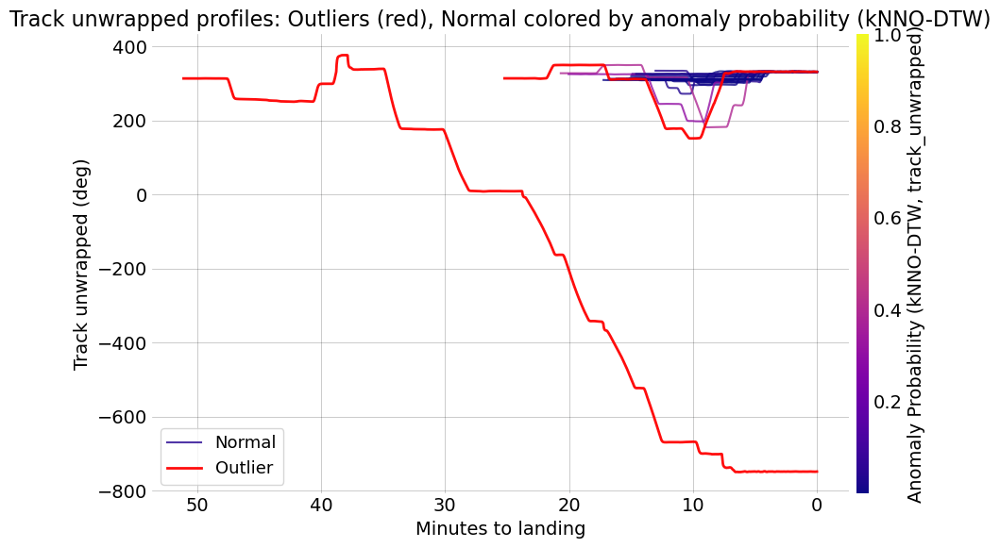

In [187]:
norm = mpl.colors.Normalize(vmin=knno_dtw_heading_df["score"].min(), vmax=knno_dtw_heading_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_dtw_heading_df["icao24_date"], knno_dtw_heading_df["score"]))
outlier_keys = set(knno_dtw_heading_df[knno_dtw_heading_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))
    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        df = flight.data
        time_to_end = (df.timestamp.iloc[-1] - df.timestamp).dt.total_seconds() / 60
        if key in outlier_keys:
            ax.plot(time_to_end, df.track_unwrapped.values, color="red", linewidth=2, alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            score = score_dict.get(key, 0)
            color = cmap(norm(score))
            ax.plot(time_to_end, df.track_unwrapped.values, color=color, alpha=0.8, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW, track_unwrapped)")
    ax.set_xlabel("Minutes to landing")
    ax.set_ylabel("Track unwrapped (deg)")
    ax.set_title("Track unwrapped profiles: Outliers (red), Normal colored by anomaly probability (kNNO-DTW)")
    ax.invert_xaxis()
    ax.legend()
    plt.tight_layout()
    plt.show()

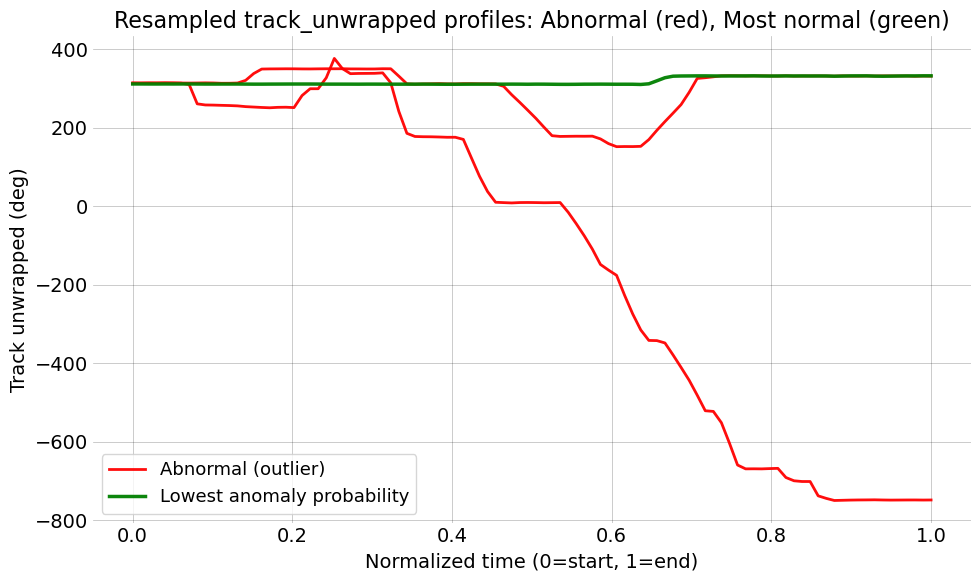

In [188]:
import matplotlib as mpl

# Find keys for abnormal (outlier) resampled heading (track_unwrapped) profiles
outlier_keys = set(knno_dtw_heading_df[knno_dtw_heading_df["outlier"] == 1]["icao24_date"])

# Find the key with the lowest anomaly probability (i.e., most normal)
min_prob_idx = knno_dtw_heading_df["score"].idxmin()
min_prob_key = knno_dtw_heading_df.loc[min_prob_idx, "icao24_date"]

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(10, 6))
    # Plot all abnormal (outlier) profiles in red
    for heading_resampled, key in zip(X_heading, icao24_list_heading):
        if key in outlier_keys:
            ax.plot(
                np.linspace(0, 1, len(heading_resampled)),
                heading_resampled,
                color="red",
                linewidth=2,
                alpha=0.95,
                label="Abnormal (outlier)" if "Abnormal (outlier)" not in ax.get_legend_handles_labels()[1] else None,
            )
    # Plot the most normal (lowest probability) profile in green
    for heading_resampled, key in zip(X_heading, icao24_list_heading):
        if key == min_prob_key:
            ax.plot(
                np.linspace(0, 1, len(heading_resampled)),
                heading_resampled,
                color="green",
                linewidth=2.5,
                alpha=0.95,
                label="Lowest anomaly probability",
            )
            break  # Only one

    ax.set_xlabel("Normalized time (0=start, 1=end)")
    ax.set_ylabel("Track unwrapped (deg)")
    ax.set_title("Resampled track_unwrapped profiles: Abnormal (red), Most normal (green)")
    ax.legend()
    plt.tight_layout()
    plt.show()

### All features

In [189]:
from anomatools.models import kNNO
from scipy.interpolate import interp1d

def resample(series, target_len=100):
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, kind="linear", fill_value="extrapolate")
    return f(x_new)

target_len = 100
X_combined = []
icao24_list_combined = []

for flight in fdb1829_runway33_m1_traffic:
    df = flight.data
    if len(df) < 2:
        continue
    # Resample each feature
    vr = resample(df.vertical_rate.values, target_len)
    gs = resample(df.groundspeed.values, target_len)
    heading = resample(df.track_unwrapped.values if "track_unwrapped" in df else df.track.values, target_len)
    # Optionally: alt = resample(df.altitude.values, target_len)
    # Concatenate features (here: vertical_rate, groundspeed, heading)
    combined = np.concatenate([vr, gs, heading])
    X_combined.append(combined)
    date_str = df.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_combined.append((flight.icao24, date_str))

X_combined = np.array(X_combined)

# Fit kNNO with DTW metric (or 'euclidean' for speed)
model_combined = kNNO(metric="euclidean")  # DTW is possible but slow for high-dim
labels_combined = model_combined.fit_predict(X_combined)
scores_combined = model_combined.predict_proba(X_combined)[:, 1]

# Collect results in a DataFrame
knno_combined_df = pd.DataFrame({
    "icao24_date": icao24_list_combined,
    "score": scores_combined,
    "outlier": labels_combined
})

# Show detected outliers
outliers_combined = knno_combined_df[knno_combined_df["outlier"] == 1]
print("Detected outliers by kNNO (combined features):")
print(outliers_combined)
outliers_combined

Detected outliers by kNNO (combined features):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  1.000000        1
23  (8965b2, 28-01-2022)  0.514119        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",1.000000,1
23,"(8965b2, 28-01-2022)",0.514119,1


In [190]:
from anomatools.models import kNNO
from scipy.interpolate import interp1d

def resample(series, target_len=100):
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, axis=0, kind="linear", fill_value="extrapolate")
    return f(x_new)

target_len = 100
X_all = []
icao24_list_all = []

for flight in fdb1829_runway33_m1_traffic:
    df = flight.data
    if len(df) < 2:
        continue
    # Resample each feature
    x = resample(df.x.values, target_len)
    y = resample(df.y.values, target_len)
    alt = resample(df.altitude.values, target_len)
    vr = resample(df.vertical_rate.values, target_len)
    gs = resample(df.groundspeed.values, target_len)
    heading = resample(df.track_unwrapped.values if "track_unwrapped" in df else df.track.values, target_len)
    # Concatenate all features
    combined = np.concatenate([x, y, alt, vr, gs, heading])
    X_all.append(combined)
    date_str = df.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_all.append((flight.icao24, date_str))

X_all = np.array(X_all)

# Fit kNNO with Euclidean metric (DTW is very slow for high-dim)
model_all = kNNO(metric="euclidean")
labels_all = model_all.fit_predict(X_all)
scores_all = model_all.predict_proba(X_all)[:, 1]

# Collect results in a DataFrame
knno_all_df = pd.DataFrame({
    "icao24_date": icao24_list_all,
    "score": scores_all,
    "outlier": labels_all
})

# Show detected outliers
outliers_all = knno_all_df[knno_all_df["outlier"] == 1]
print("Detected outliers by kNNO (all features):")
print(outliers_all)
outliers_all

Detected outliers by kNNO (all features):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  0.913962        1
19  (89656a, 20-01-2022)  0.513717        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",0.913962,1
19,"(89656a, 20-01-2022)",0.513717,1


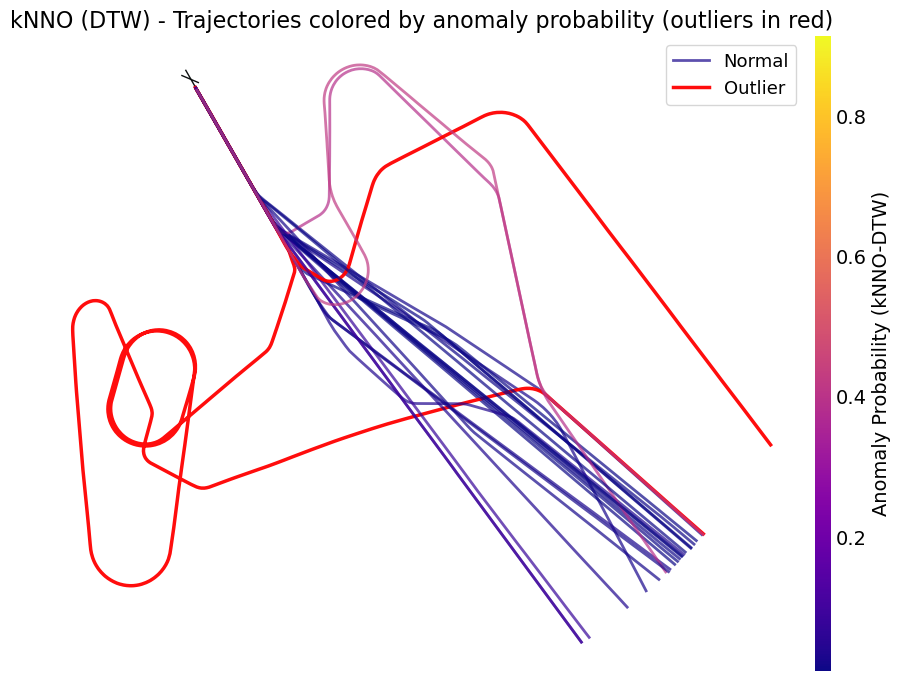

In [191]:
norm = mpl.colors.Normalize(vmin=knno_all_df["score"].min(), vmax=knno_all_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(knno_all_df["icao24_date"], knno_all_df["score"]))
outlier_keys = set(knno_all_df[knno_all_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        if key in outlier_keys:
            flight.plot(ax, linewidth=2.5, color="red", alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            color = cmap(norm(score))
            flight.plot(ax, linewidth=2, color=color, alpha=0.7, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (kNNO-DTW)")

    ax.set_title("kNNO (DTW) - Trajectories colored by anomaly probability (outliers in red)")
    ax.legend()
    plt.tight_layout()
    plt.show()

## iNNE

In [194]:
from anomatools.models import iNNE
from scipy.interpolate import interp1d

def resample(series, target_len=100):
    x_old = np.linspace(0, 1, len(series))
    x_new = np.linspace(0, 1, target_len)
    f = interp1d(x_old, series, axis=0, kind="linear", fill_value="extrapolate")
    return f(x_new)

target_len = 100
X_all = []
icao24_list_all = []

for flight in fdb1829_runway33_m1_traffic:
    df = flight.data
    if len(df) < 2:
        continue
    # Resample each feature
    x = resample(df.x.values, target_len)
    y = resample(df.y.values, target_len)
    alt = resample(df.altitude.values, target_len)
    vr = resample(df.vertical_rate.values, target_len)
    gs = resample(df.groundspeed.values, target_len)
    heading = resample(df.track_unwrapped.values if "track_unwrapped" in df else df.track.values, target_len)
    # Concatenate all features
    combined = np.concatenate([x, y, alt, vr, gs, heading])
    X_all.append(combined)
    date_str = df.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
    icao24_list_all.append((flight.icao24, date_str))

X_all = np.array(X_all)

# Fit iNNE outlier detector
detector = iNNE(n_members=200)
labels_all = detector.fit_predict(X_all)
scores_all = detector.predict_proba(X_all)[:, 1]

# Collect results in a DataFrame
inne_all_df = pd.DataFrame({
    "icao24_date": icao24_list_all,
    "score": scores_all,
    "outlier": labels_all
})

# Show detected outliers
outliers_all = inne_all_df[inne_all_df["outlier"] == 1]
print("Detected outliers by iNNE (all features):")
print(outliers_all)
outliers_all

Detected outliers by iNNE (all features):
             icao24_date     score  outlier
5   (8964d3, 30-01-2022)  0.568929        1
19  (89656a, 20-01-2022)  0.502917        1


,icao24_date,score,outlier
5,"(8964d3, 30-01-2022)",0.568929,1
19,"(89656a, 20-01-2022)",0.502917,1


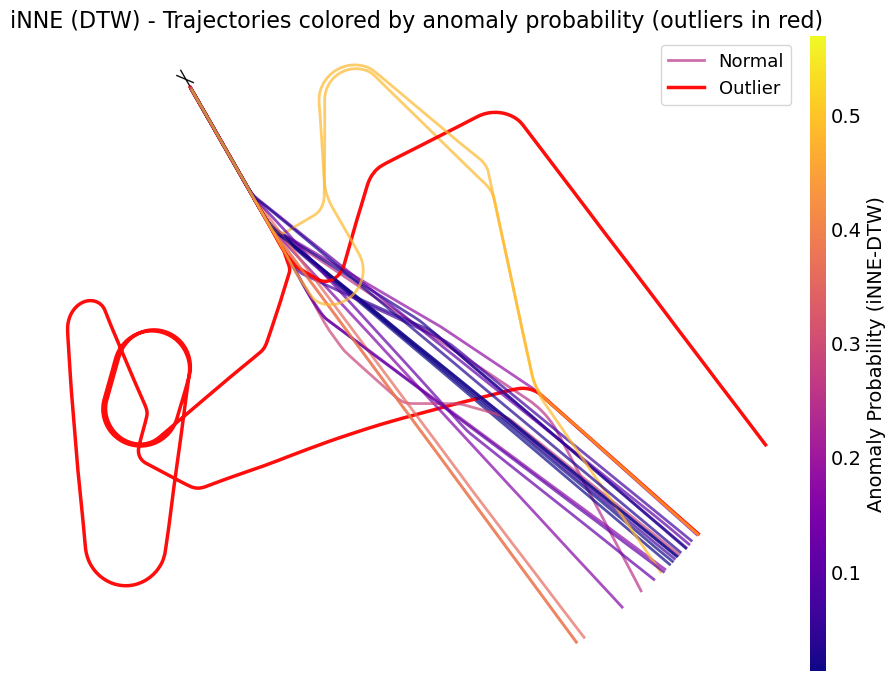

In [196]:
norm = mpl.colors.Normalize(vmin=inne_all_df["score"].min(), vmax=inne_all_df["score"].max())
cmap = plt.cm.plasma  # or 'viridis', 'inferno', etc.

score_dict = dict(zip(inne_all_df["icao24_date"], inne_all_df["score"]))
outlier_keys = set(inne_all_df[inne_all_df["outlier"] == 1]["icao24_date"])

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    for flight in fdb1829_runway33_m1_traffic:
        icao24 = flight.icao24
        date_str = flight.data.timestamp.dt.strftime("%d-%m-%Y").iloc[0]
        key = (icao24, date_str)
        score = score_dict.get(key, 0)
        if key in outlier_keys:
            flight.plot(ax, linewidth=2.5, color="red", alpha=0.95, label="Outlier" if "Outlier" not in ax.get_legend_handles_labels()[1] else None)
        else:
            color = cmap(norm(score))
            flight.plot(ax, linewidth=2, color=color, alpha=0.7, label="Normal" if "Normal" not in ax.get_legend_handles_labels()[1] else None)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, pad=0.01, aspect=40)
    cbar.set_label("Anomaly Probability (iNNE-DTW)")

    ax.set_title("iNNE (DTW) - Trajectories colored by anomaly probability (outliers in red)")
    ax.legend()
    plt.tight_layout()
    plt.show()

# Conclusions
## Features:
- **X**: Longitude in EPSG:2180
- **Y**: Latitude in EPSG:2180
- **Z**: Altitude in meters
- **ground_speed**: Ground speed in m/s
- **vertical_rate**: Vertical rate in m/s
- **heading**: Heading in degrees
## Tested methods:
- **Time in area (duration-based outlier detection):** Compute time spent in area for each trajectory, detect abnormal durations using IQR.
- **Frechet distance (2D/3D):** Measure spatial similarity between trajectories and a reference using Frechet distance; flag outliers via IQR.
- **Dynamic Time Warping (DTW):** Compare temporal sequences (altitude, groundspeed, vertical rate, heading, 2D/3D position) to a reference using DTW; detect outliers with IQR.
- **Clustering (K-Medoids, Agglomerative):** Cluster heading/track time series using DTW-based clustering; identify abnormal members by distance to cluster medoid or outlier merges in hierarchical clustering.
- **k-Nearest Neighbors Outlier (kNNO):** Use kNNO with DTW or Euclidean metric on resampled time series (altitude, groundspeed, vertical rate, heading, 2D/3D/all features); outliers have high anomaly probability.
- **iNNE (ensemble nearest neighbor):** Apply iNNE on all resampled features for robust outlier detection; outliers have high anomaly probability.

# Iterative RDP

In [209]:
from rdp import rdp

In [239]:
anomaly_flight = fdb1829_runway33_m1_traffic.query('icao24 == "8964d3" and timestamp.dt.strftime("%d-%m-%Y") == "30-01-2022"')["FDB1829"]
anomaly_flight.data.shape

(3034, 19)

In [240]:
simplified_anomaly_flight = anomaly_flight.simplify(1e3)
simplified_anomaly_flight.data.shape

(31, 19)

Original points: 3034, Simplified points: 31


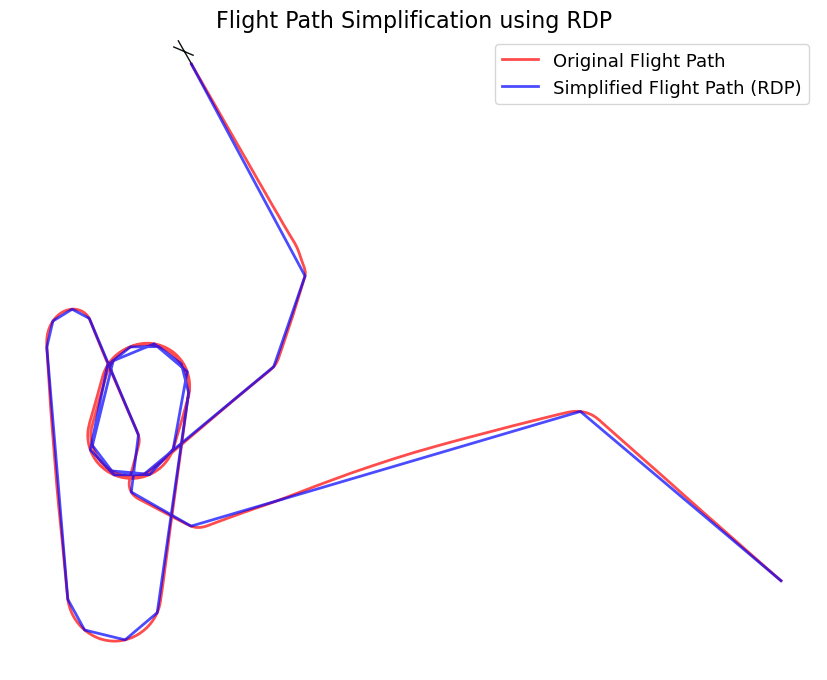

In [252]:
simplified_anomaly_flight = anomaly_flight.simplify(1e3)
print(f"Original points: {anomaly_flight.data.shape[0]}, Simplified points: {simplified_anomaly_flight.data.shape[0]}")
with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))
    
    anomaly_flight.plot(ax, linewidth=2, color="red", alpha=0.7, label="Original Flight Path")
    simplified_anomaly_flight.plot(ax, linewidth=2, color="blue", alpha=0.7, label="Simplified Flight Path (RDP)")
    
    ax.set_title("Flight Path Simplification using RDP")
    ax.legend()
    plt.tight_layout()
    plt.show()

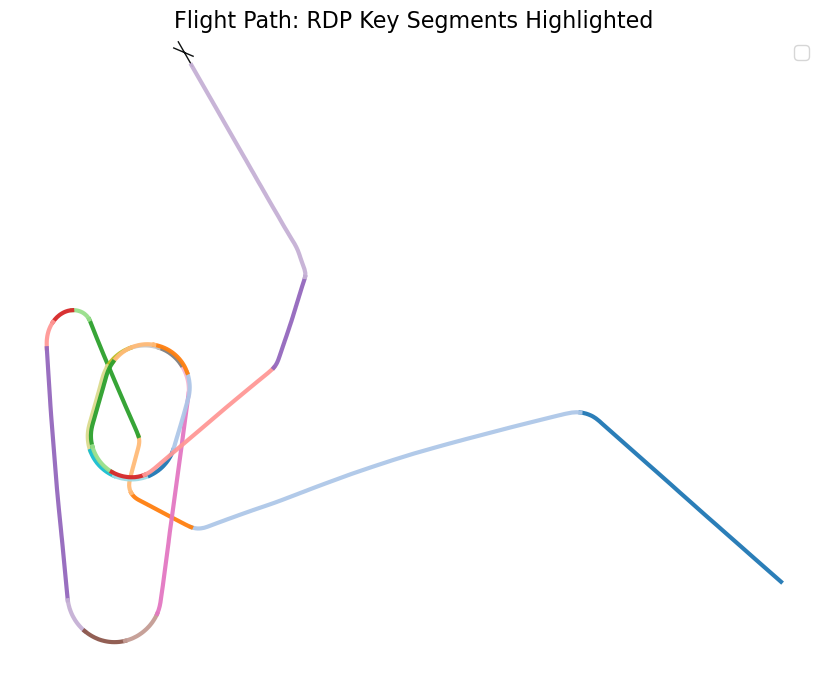

In [263]:
import matplotlib.pyplot as plt
from pyproj import Transformer

# Prepare projection transformer
transformer = Transformer.from_crs("epsg:4326", "epsg:2180", always_xy=True)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
    airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))

    # Original trajectory coordinates
    coords = anomaly_flight.data[["longitude", "latitude"]].to_numpy()
    x, y = transformer.transform(coords[:, 0], coords[:, 1])

    # Simplified trajectory (RDP key points)
    simp_coords = simplified_anomaly_flight.data[["longitude", "latitude"]].to_numpy()
    x_s, y_s = transformer.transform(simp_coords[:, 0], simp_coords[:, 1])

    # Use a qualitative colormap for contrast
    cmap = plt.colormaps.get_cmap("tab20")
    num_colors = cmap.N

    # Plot colored segments between RDP key points
    for i in range(len(x_s) - 1):
        # Find indices of the key points in the original trajectory
        idx_start = np.where((x == x_s[i]) & (y == y_s[i]))[0][0]
        idx_end = np.where((x == x_s[i+1]) & (y == y_s[i+1]))[0][0]
        ax.plot(x[idx_start:idx_end+1], y[idx_start:idx_end+1],
                color=cmap(i % num_colors), linewidth=3, alpha=0.95, label=None)

    ax.set_title("Flight Path: RDP Key Segments Highlighted")
    ax.legend()
    plt.tight_layout()
    plt.show()

With altitude

In [276]:
simplified_with_altitude_anomaly_flight = anomaly_flight.simplify(1e3, altitude='altitude', z_factor=10)


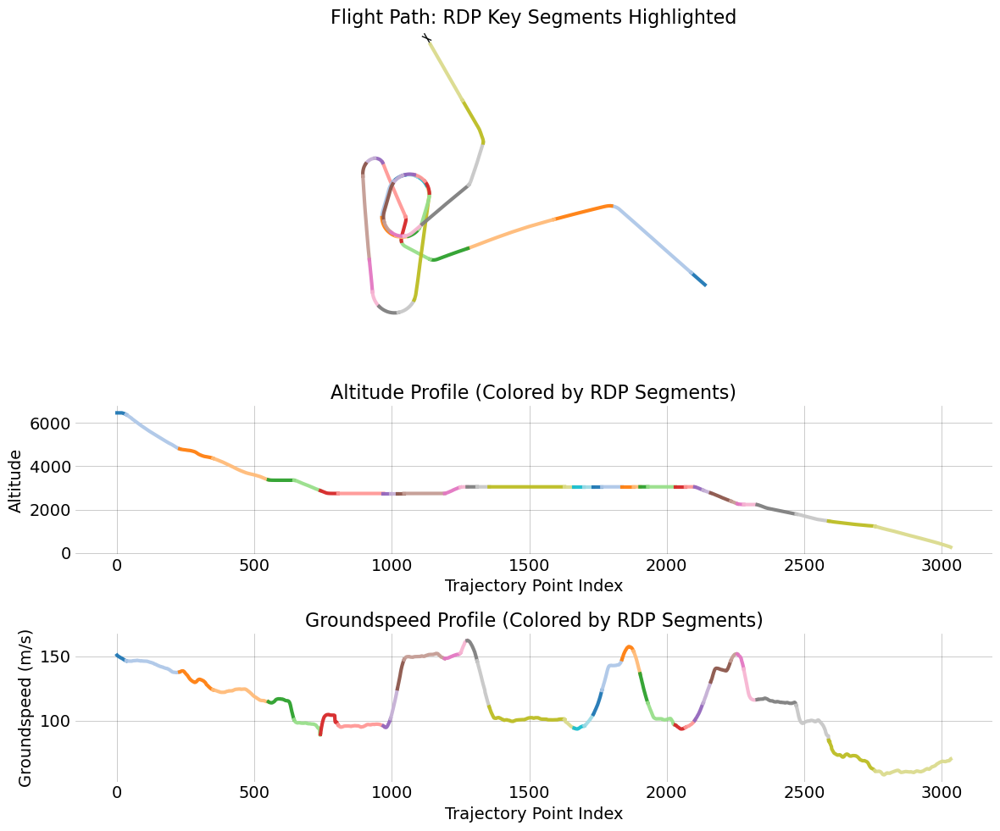

In [283]:
# Prepare projection transformer
transformer = Transformer.from_crs("epsg:4326", "epsg:2180", always_xy=True)

# Get original trajectory coordinates, altitude, and groundspeed
coords = anomaly_flight.data[["longitude", "latitude"]].to_numpy()
altitude = anomaly_flight.data["altitude"].to_numpy()
groundspeed = anomaly_flight.data["groundspeed"].to_numpy()
x, y = transformer.transform(coords[:, 0], coords[:, 1])

# Simplified trajectory (RDP key points)
simp_coords = simplified_with_altitude_anomaly_flight.data[["longitude", "latitude"]].to_numpy()
x_s, y_s = transformer.transform(simp_coords[:, 0], simp_coords[:, 1])

# Use a qualitative colormap for contrast
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(12, 10))
    gs = fig.add_gridspec(3, 1, height_ratios=[2, 1, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_alt = fig.add_subplot(gs[1])
    ax_gs = fig.add_subplot(gs[2])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))
    for i in range(len(x_s) - 1):
        idx_start = np.where((x == x_s[i]) & (y == y_s[i]))[0][0]
        idx_end = np.where((x == x_s[i+1]) & (y == y_s[i+1]))[0][0]
        color = cmap(i % num_colors)
        ax_map.plot(x[idx_start:idx_end+1], y[idx_start:idx_end+1],
                    color=color, linewidth=3, alpha=0.95)
        ax_alt.plot(range(idx_start, idx_end+1), altitude[idx_start:idx_end+1],
                    color=color, linewidth=3, alpha=0.95)
        ax_gs.plot(range(idx_start, idx_end+1), groundspeed[idx_start:idx_end+1],
                   color=color, linewidth=3, alpha=0.95)

    ax_map.set_title("Flight Path: RDP Key Segments Highlighted")
    ax_alt.set_title("Altitude Profile (Colored by RDP Segments)")
    ax_alt.set_xlabel("Trajectory Point Index")
    ax_alt.set_ylabel("Altitude")

    ax_gs.set_title("Groundspeed Profile (Colored by RDP Segments)")
    ax_gs.set_xlabel("Trajectory Point Index")
    ax_gs.set_ylabel("Groundspeed (m/s)")

    plt.tight_layout()
    plt.show()

# ruptures 

In [278]:
import ruptures as rpt

In [286]:
flight = anomaly_flight  # or any flight from fdb1829_runway33_m1_traffic
transformer = Transformer.from_crs("epsg:4326", "epsg:2180", always_xy=True)

# Get original trajectory coordinates and altitude/groundspeed
coords = anomaly_flight.data[["longitude", "latitude"]].to_numpy()
altitude = anomaly_flight.data["altitude"].to_numpy()
groundspeed = anomaly_flight.data["groundspeed"].to_numpy()
x, y = transformer.transform(coords[:, 0], coords[:, 1])

# 2D trajectory for ruptures
xy = np.column_stack([x, y])

In [299]:
model = "rbf"
algo = rpt.Binseg(model=model).fit(xy)
bkps = algo.predict(pen=50)

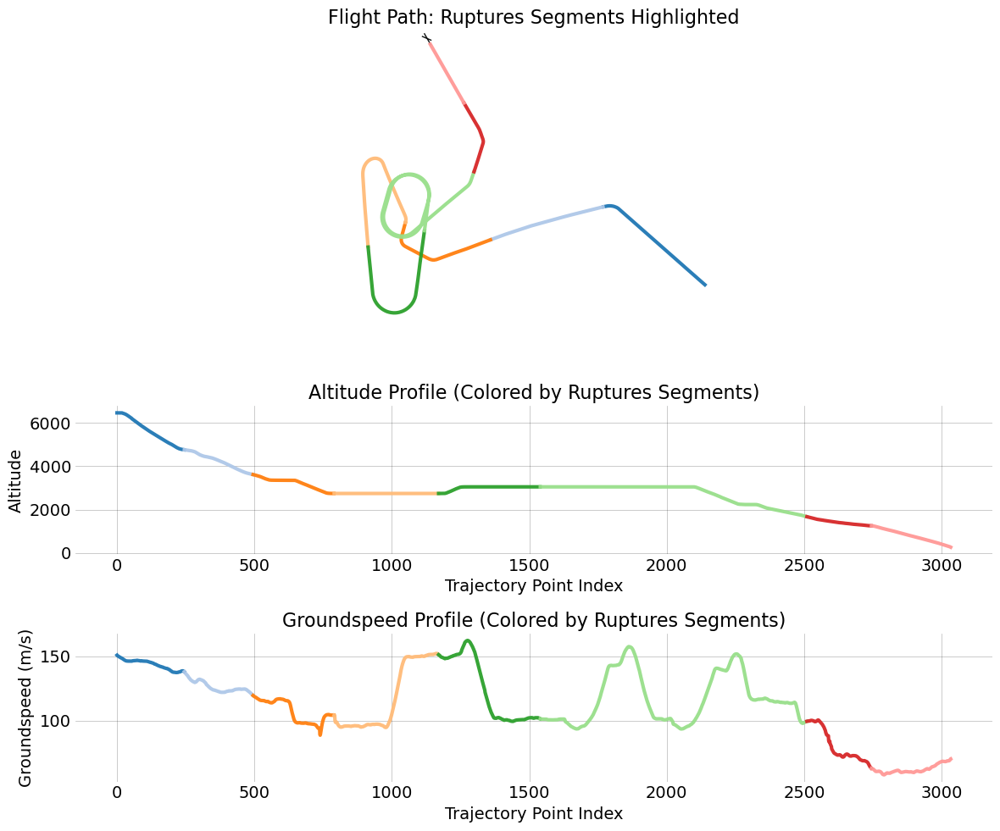

In [300]:
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(12, 10))
    gs = fig.add_gridspec(3, 1, height_ratios=[2, 1, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_alt = fig.add_subplot(gs[1])
    ax_gs = fig.add_subplot(gs[2])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    # Plot colored segments between ruptures change points
    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_alt.plot(range(prev, bkp), altitude[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_gs.plot(range(prev, bkp), groundspeed[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures Segments Highlighted")
    ax_alt.set_title("Altitude Profile (Colored by Ruptures Segments)")
    ax_alt.set_xlabel("Trajectory Point Index")
    ax_alt.set_ylabel("Altitude")

    ax_gs.set_title("Groundspeed Profile (Colored by Ruptures Segments)")
    ax_gs.set_xlabel("Trajectory Point Index")
    ax_gs.set_ylabel("Groundspeed (m/s)")

    plt.tight_layout()
    plt.show()

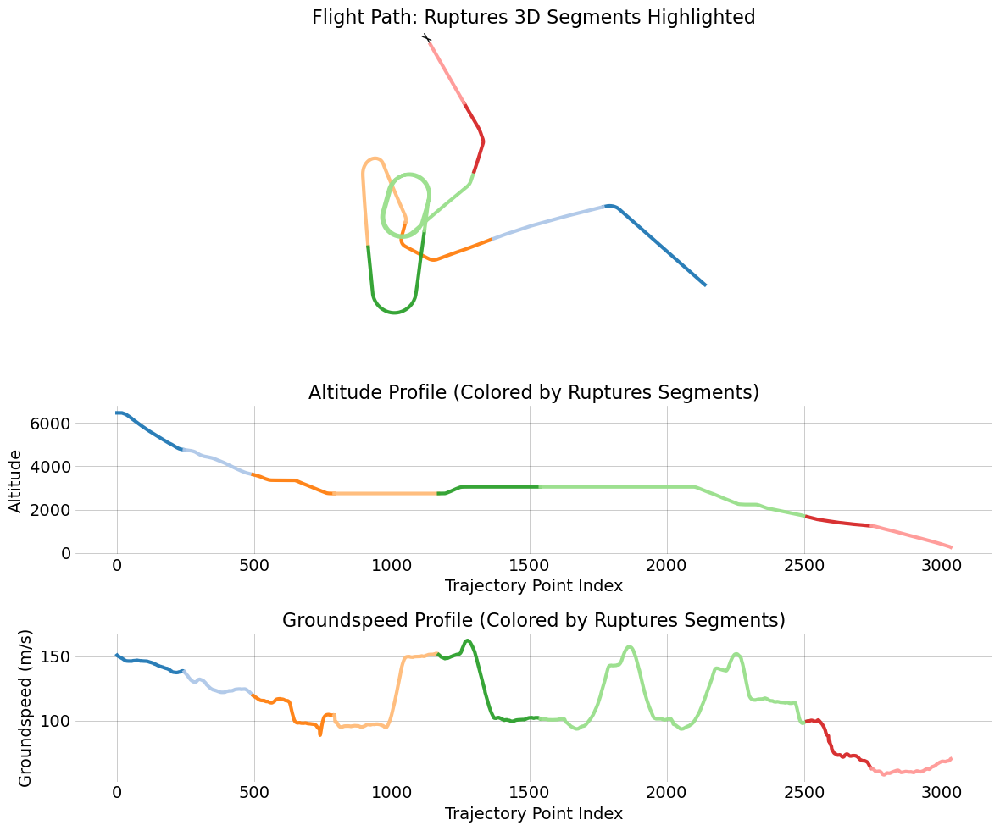

In [301]:
xyz = np.column_stack([x, y, altitude])

# Fit the change point detection model
model = "rbf"  # or "l2", "linear", etc.
algo = rpt.Binseg(model=model).fit(xyz)

# Use a penalty value to let ruptures choose the number of segments
bkps = algo.predict(pen=50)  # Adjust pen as needed

# Visualize the segments
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(12, 10))
    gs = fig.add_gridspec(3, 1, height_ratios=[2, 1, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_alt = fig.add_subplot(gs[1])
    ax_gs = fig.add_subplot(gs[2])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_alt.plot(range(prev, bkp), altitude[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_gs.plot(range(prev, bkp), groundspeed[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures 3D Segments Highlighted")
    ax_alt.set_title("Altitude Profile (Colored by Ruptures Segments)")
    ax_alt.set_xlabel("Trajectory Point Index")
    ax_alt.set_ylabel("Altitude")
    ax_gs.set_title("Groundspeed Profile (Colored by Ruptures Segments)")
    ax_gs.set_xlabel("Trajectory Point Index")
    ax_gs.set_ylabel("Groundspeed (m/s)")
    plt.tight_layout()
    plt.show()

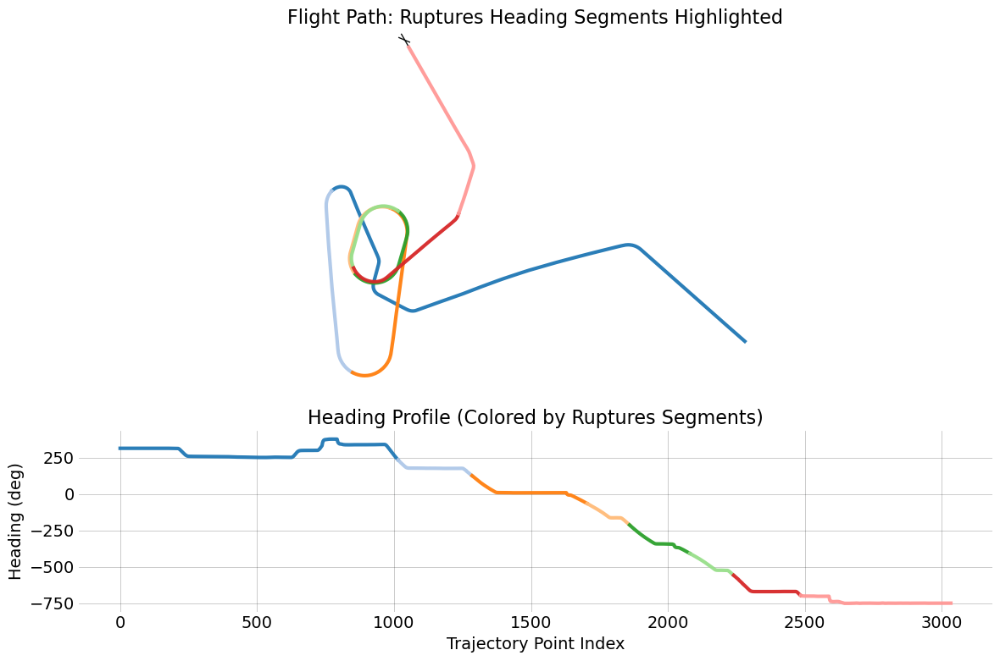

In [303]:
flight = anomaly_flight

# Extract heading (track_unwrapped if available, else track)
if "track_unwrapped" in flight.data:
    heading = flight.data["track_unwrapped"].values
else:
    heading = flight.data["track"].values

# Reshape for ruptures (expects 2D array)
heading_2d = heading.reshape(-1, 1)

# Fit ruptures change point detection
model = "rbf"  # or "l2", "linear", etc.
algo = rpt.Binseg(model=model).fit(heading_2d)
bkps = algo.predict(pen=10)  # Adjust pen for more/fewer segments

# Visualize the segments on heading and trajectory
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(12, 8))
    gs = fig.add_gridspec(2, 1, height_ratios=[2, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_heading = fig.add_subplot(gs[1])

    # Prepare projected coordinates
    coords = flight.data[["longitude", "latitude"]].to_numpy()
    x, y = transformer.transform(coords[:, 0], coords[:, 1])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_heading.plot(range(prev, bkp), heading[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures Heading Segments Highlighted")
    ax_heading.set_title("Heading Profile (Colored by Ruptures Segments)")
    ax_heading.set_xlabel("Trajectory Point Index")
    ax_heading.set_ylabel("Heading (deg)")
    plt.tight_layout()
    plt.show()

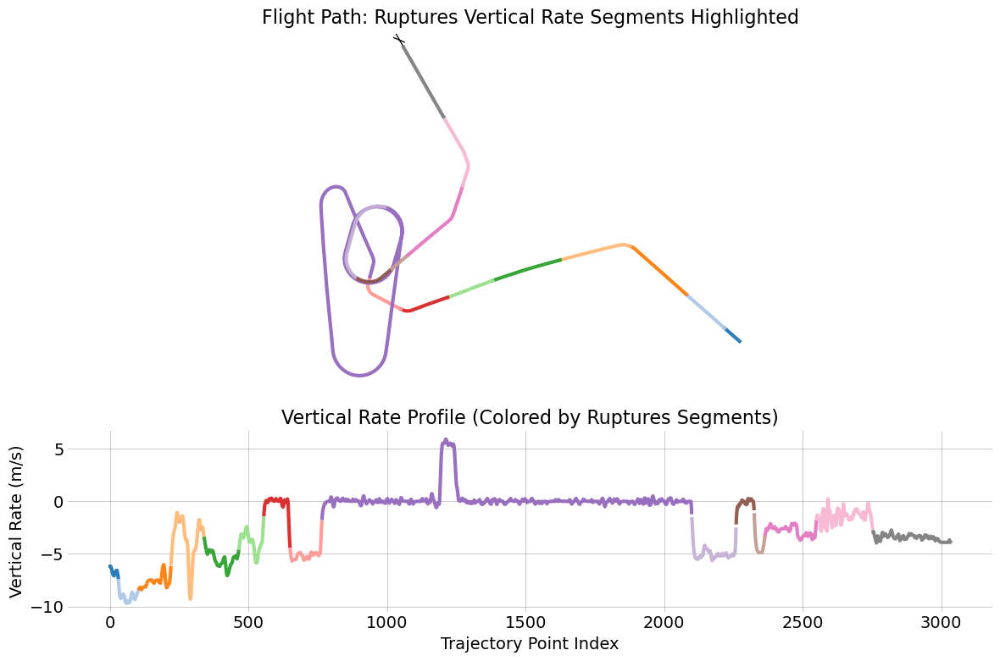

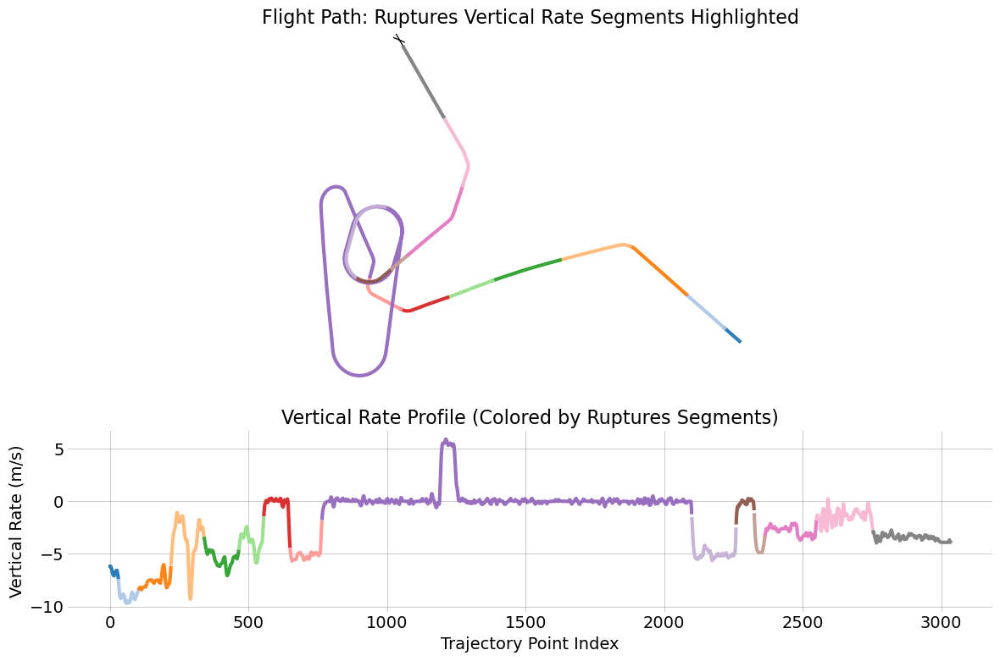

In [305]:
flight = anomaly_flight

# Extract vertical rate
vertical_rate = flight.data["vertical_rate"].values

# Reshape for ruptures (expects 2D array)
vr_2d = vertical_rate.reshape(-1, 1)

# Fit ruptures change point detection
model = "rbf"  # or "l2", "linear", etc.
algo = rpt.Binseg(model=model).fit(vr_2d)
bkps = algo.predict(pen=10)  # Adjust pen for more/fewer segments

# Visualize the segments on vertical rate and trajectory
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(12, 8))
    gs = fig.add_gridspec(2, 1, height_ratios=[2, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_vr = fig.add_subplot(gs[1])

    # Prepare projected coordinates
    coords = flight.data[["longitude", "latitude"]].to_numpy()
    x, y = transformer.transform(coords[:, 0], coords[:, 1])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_vr.plot(range(prev, bkp), vertical_rate[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures Vertical Rate Segments Highlighted")
    ax_vr.set_title("Vertical Rate Profile (Colored by Ruptures Segments)")
    ax_vr.set_xlabel("Trajectory Point Index")
    ax_vr.set_ylabel("Vertical Rate (m/s)")
    plt.tight_layout()
    plt.show()

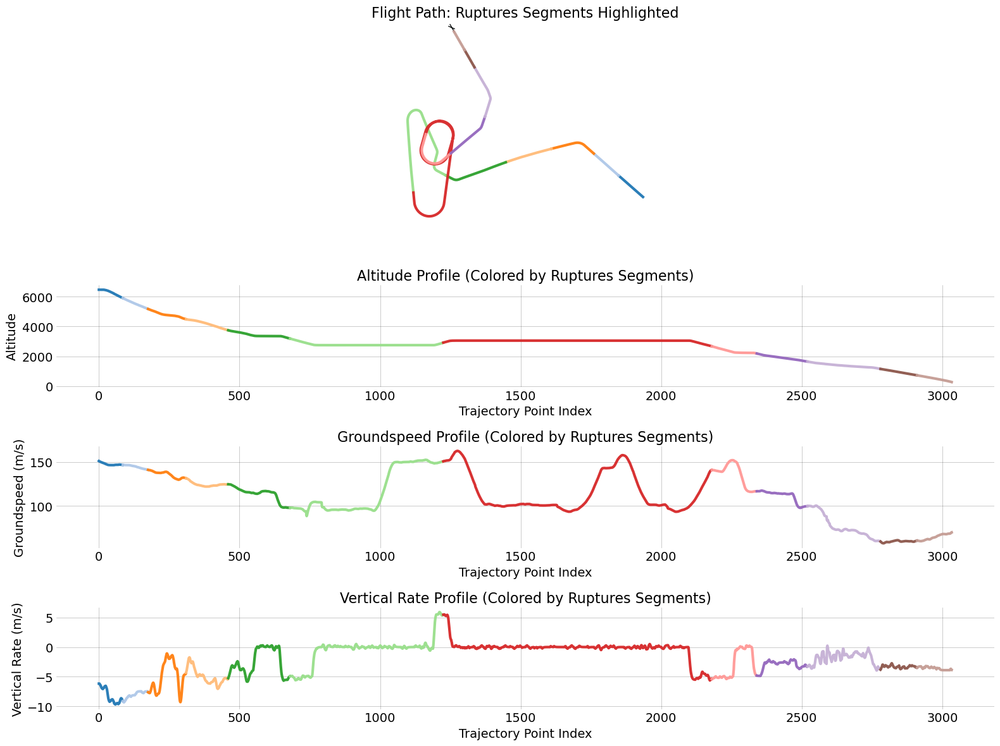

In [318]:
flight = anomaly_flight

# Extract features
altitude = flight.data["altitude"].values
groundspeed = flight.data["groundspeed"].values
vertical_rate = flight.data["vertical_rate"].values

# Stack features for ruptures (3D: [altitude, groundspeed, vertical_rate])
features = np.column_stack([altitude, groundspeed, vertical_rate])

# Fit ruptures change point detection
model = "rbf"  # or "l2", "linear", etc.
algo = rpt.Binseg(model=model).fit(features)
bkps = algo.predict(pen=10)  # Adjust pen for more/fewer segments

# Visualize the segments on all features and trajectory
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(16, 12))
    gs = fig.add_gridspec(4, 1, height_ratios=[2, 1, 1, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_alt = fig.add_subplot(gs[1])
    ax_gs = fig.add_subplot(gs[2])
    ax_vr = fig.add_subplot(gs[3])

    # Prepare projected coordinates
    coords = flight.data[["longitude", "latitude"]].to_numpy()
    x, y = transformer.transform(coords[:, 0], coords[:, 1])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_alt.plot(range(prev, bkp), altitude[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_gs.plot(range(prev, bkp), groundspeed[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_vr.plot(range(prev, bkp), vertical_rate[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures Segments Highlighted")
    ax_alt.set_title("Altitude Profile (Colored by Ruptures Segments)")
    ax_alt.set_xlabel("Trajectory Point Index")
    ax_alt.set_ylabel("Altitude")
    ax_gs.set_title("Groundspeed Profile (Colored by Ruptures Segments)")
    ax_gs.set_xlabel("Trajectory Point Index")
    ax_gs.set_ylabel("Groundspeed (m/s)")
    ax_vr.set_title("Vertical Rate Profile (Colored by Ruptures Segments)")
    ax_vr.set_xlabel("Trajectory Point Index")
    ax_vr.set_ylabel("Vertical Rate (m/s)")
    plt.tight_layout()
    plt.show()

<Figure size 1400x1000 with 0 Axes>

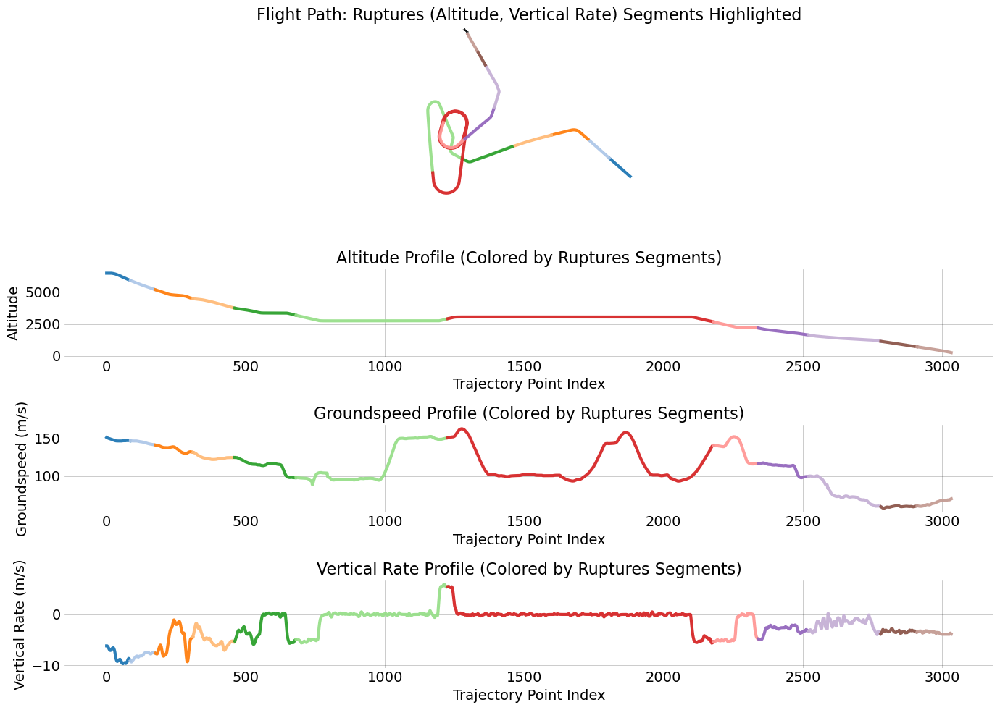

In [317]:
altitude = flight.data["altitude"].values
vertical_rate = flight.data["vertical_rate"].values

# Stack features for ruptures (2D: [altitude, vertical_rate])
alt_vr = np.column_stack([altitude, vertical_rate])

# Fit ruptures change point detection
model = "rbf"  # or "l2", "linear", etc.
algo = rpt.Binseg(model=model).fit(alt_vr)
bkps = algo.predict(pen=10)  # Adjust pen for more/fewer segments

# Visualize the segments on (altitude, vertical rate) and trajectory
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(14, 10))
    gs = fig.add_gridspec(4, 1, height_ratios=[2, 1, 1, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_alt = fig.add_subplot(gs[1])
    ax_gs = fig.add_subplot(gs[2])
    ax_vr = fig.add_subplot(gs[3])

    # Prepare projected coordinates
    coords = flight.data[["longitude", "latitude"]].to_numpy()
    x, y = transformer.transform(coords[:, 0], coords[:, 1])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_alt.plot(range(prev, bkp), altitude[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_gs.plot(range(prev, bkp), flight.data["groundspeed"].values[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_vr.plot(range(prev, bkp), vertical_rate[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures (Altitude, Vertical Rate) Segments Highlighted")
    ax_alt.set_title("Altitude Profile (Colored by Ruptures Segments)")
    ax_alt.set_xlabel("Trajectory Point Index")
    ax_alt.set_ylabel("Altitude")
    ax_gs.set_title("Groundspeed Profile (Colored by Ruptures Segments)")
    ax_gs.set_xlabel("Trajectory Point Index")
    ax_gs.set_ylabel("Groundspeed (m/s)")
    ax_vr.set_title("Vertical Rate Profile (Colored by Ruptures Segments)")
    ax_vr.set_xlabel("Trajectory Point Index")
    ax_vr.set_ylabel("Vertical Rate (m/s)")
    plt.tight_layout()
    plt.show()

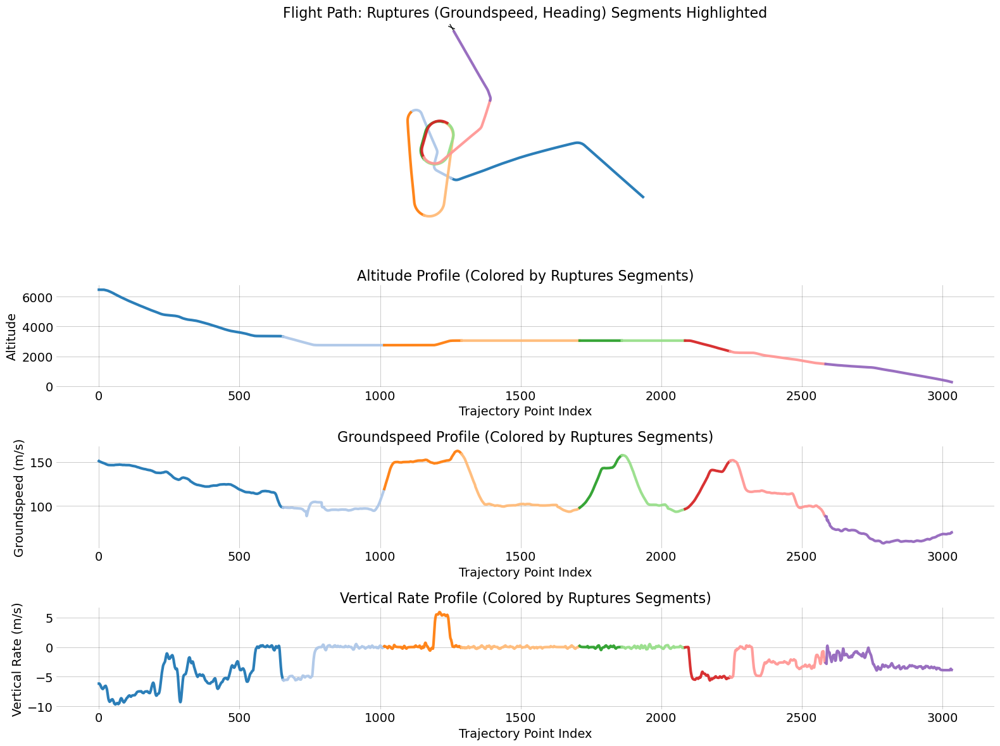

In [308]:
groundspeed = flight.data["groundspeed"].values
# Use 'track_unwrapped' if available, else 'track'
if "track_unwrapped" in flight.data:
    heading = flight.data["track_unwrapped"].values
else:
    heading = flight.data["track"].values
altitude = flight.data["altitude"].values
vertical_rate = flight.data["vertical_rate"].values

# Stack features for ruptures (2D: [groundspeed, heading])
gs_heading = np.column_stack([groundspeed, heading])

# Fit ruptures change point detection
import ruptures as rpt
model = "rbf"  # or "l2", "linear", etc.
algo = rpt.Binseg(model=model).fit(gs_heading)
bkps = algo.predict(pen=10)  # Adjust pen for more/fewer segments

# Prepare projected coordinates
coords = flight.data[["longitude", "latitude"]].to_numpy()
from pyproj import Transformer
transformer = Transformer.from_crs("epsg:4326", "epsg:2180", always_xy=True)
x, y = transformer.transform(coords[:, 0], coords[:, 1])

# Plot
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(16, 12))
    gs = fig.add_gridspec(4, 1, height_ratios=[2, 1, 1, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_alt = fig.add_subplot(gs[1])
    ax_gs = fig.add_subplot(gs[2])
    ax_vr = fig.add_subplot(gs[3])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_alt.plot(range(prev, bkp), altitude[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_gs.plot(range(prev, bkp), groundspeed[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_vr.plot(range(prev, bkp), vertical_rate[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures (Groundspeed, Heading) Segments Highlighted")
    ax_alt.set_title("Altitude Profile (Colored by Ruptures Segments)")
    ax_alt.set_xlabel("Trajectory Point Index")
    ax_alt.set_ylabel("Altitude")
    ax_gs.set_title("Groundspeed Profile (Colored by Ruptures Segments)")
    ax_gs.set_xlabel("Trajectory Point Index")
    ax_gs.set_ylabel("Groundspeed (m/s)")
    ax_vr.set_title("Vertical Rate Profile (Colored by Ruptures Segments)")
    ax_vr.set_xlabel("Trajectory Point Index")
    ax_vr.set_ylabel("Vertical Rate (m/s)")
    plt.tight_layout()
    plt.show()

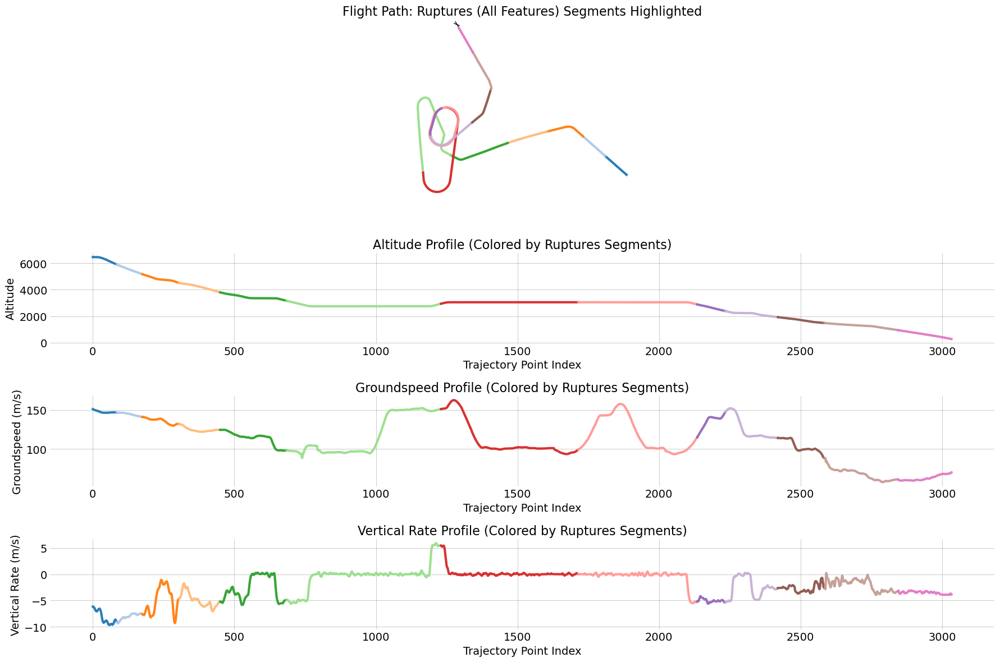

In [312]:
flight = anomaly_flight

# Extract all relevant features
groundspeed = flight.data["groundspeed"].values
if "track_unwrapped" in flight.data:
    heading = flight.data["track_unwrapped"].values
else:
    heading = flight.data["track"].values
altitude = flight.data["altitude"].values
vertical_rate = flight.data["vertical_rate"].values

# Stack all features for ruptures (4D: [groundspeed, heading, altitude, vertical_rate])
features = np.column_stack([groundspeed, heading, altitude, vertical_rate])

# Fit ruptures change point detection
import ruptures as rpt
model = "rbf"  # or "l2", "linear", etc.
algo = rpt.Binseg(model=model).fit(features)
bkps = algo.predict(pen=10)  # Adjust pen for more/fewer segments

# Prepare projected coordinates
coords = flight.data[["longitude", "latitude"]].to_numpy()
from pyproj import Transformer
transformer = Transformer.from_crs("epsg:4326", "epsg:2180", always_xy=True)
x, y = transformer.transform(coords[:, 0], coords[:, 1])

# Plot
cmap = plt.colormaps.get_cmap("tab20")
num_colors = cmap.N

with plt.style.context("traffic"):
    fig = plt.figure(figsize=(18, 12))
    gs = fig.add_gridspec(4, 1, height_ratios=[2, 1, 1, 1])

    ax_map = fig.add_subplot(gs[0], projection=EPSG_2180())
    ax_alt = fig.add_subplot(gs[1])
    ax_gs = fig.add_subplot(gs[2])
    ax_vr = fig.add_subplot(gs[3])

    airports["EPWA"].plot(ax_map, footprint=False, runways=dict(linewidth=1))

    prev = 0
    for i, bkp in enumerate(bkps):
        color = cmap(i % num_colors)
        ax_map.plot(x[prev:bkp], y[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_alt.plot(range(prev, bkp), altitude[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_gs.plot(range(prev, bkp), groundspeed[prev:bkp], color=color, linewidth=3, alpha=0.95)
        ax_vr.plot(range(prev, bkp), vertical_rate[prev:bkp], color=color, linewidth=3, alpha=0.95)
        prev = bkp

    ax_map.set_title("Flight Path: Ruptures (All Features) Segments Highlighted")
    ax_alt.set_title("Altitude Profile (Colored by Ruptures Segments)")
    ax_alt.set_xlabel("Trajectory Point Index")
    ax_alt.set_ylabel("Altitude")
    ax_gs.set_title("Groundspeed Profile (Colored by Ruptures Segments)")
    ax_gs.set_xlabel("Trajectory Point Index")
    ax_gs.set_ylabel("Groundspeed (m/s)")
    ax_vr.set_title("Vertical Rate Profile (Colored by Ruptures Segments)")
    ax_vr.set_xlabel("Trajectory Point Index")
    ax_vr.set_ylabel("Vertical Rate (m/s)")
    plt.tight_layout()
    plt.show()
